In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import cm
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns
import matplotlib.gridspec as gridspec
from typing import Iterable, List

## Разведывательный анализ

In [2]:
X_raw = pd.read_csv(
    "kc_house_data.csv",
    na_values=["?"],
)
X_raw.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [3]:
X_raw = X_raw.drop(columns=['id', 'lat', 'long']) 

In [4]:
X_raw['date'] = pd.to_datetime(X_raw['date'])
X_raw['year'] = X_raw['date'].dt.year
X_raw['month'] = X_raw['date'].dt.month
X_raw['day'] = X_raw['date'].dt.day
del X_raw['date']

In [5]:
X_raw.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,year,month,day
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,2014,10,13
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,2014,12,9
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,2015,2,25
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000,2014,12,9
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503,2015,2,18


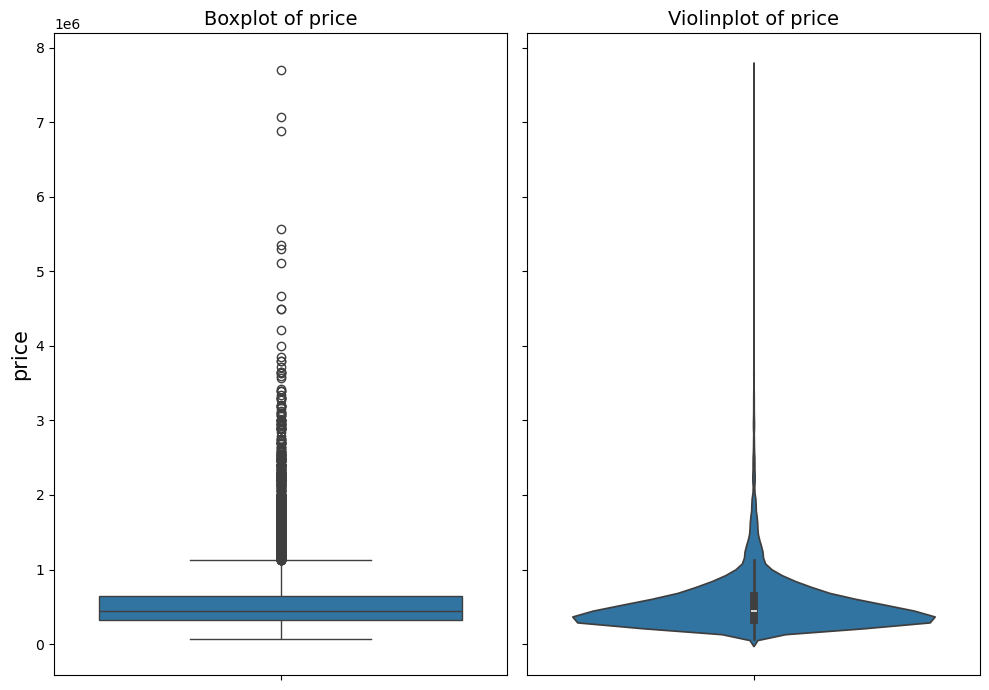

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(10, 7), sharey=True)

sns.boxplot(X_raw['price'], ax=axes[0])
axes[0].set_title('Boxplot of price', fontsize=14)
axes[0].set_ylabel('price', fontsize=15)

sns.violinplot(X_raw['price'], ax=axes[1])
axes[1].set_title('Violinplot of price', fontsize=14)
plt.tight_layout()

In [7]:
all_features = X_raw.columns.tolist()
excluded_features = ['price', 'waterfront', 'zipcode', 'year', 'month', 'day','view']
features_to_analyze = [feature for feature in all_features if feature not in excluded_features]

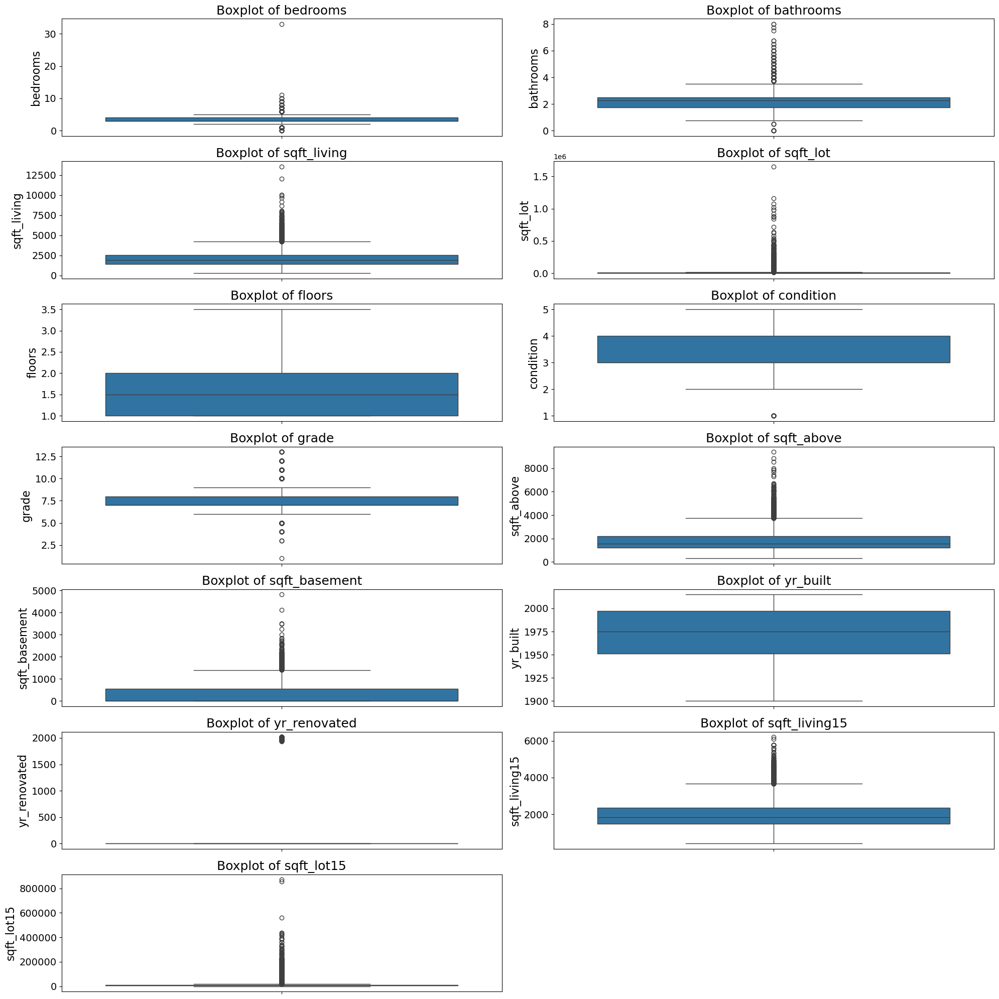

In [8]:
plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(7, 2) 
for i, feature in enumerate(features_to_analyze):
    ax = plt.subplot(gs[i])
    sns.boxplot(X_raw[feature], ax=ax)
    ax.set_title(f'Boxplot of {feature}',fontsize=18)
    ax.set_ylabel(feature, fontsize=16)
    ax.tick_params(axis='y', labelsize=14) 
plt.tight_layout()

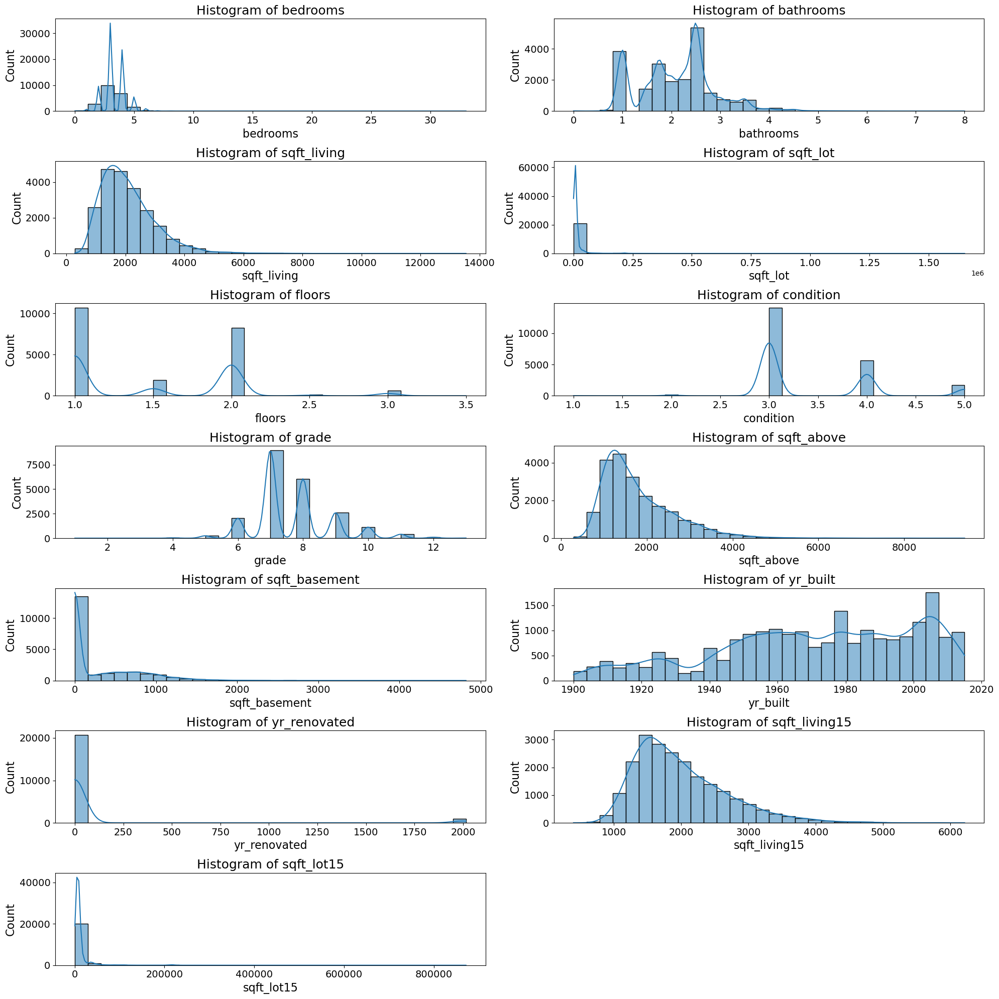

In [9]:
plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(7, 2) 
for i, feature in enumerate(features_to_analyze):
    ax = plt.subplot(gs[i])
    sns.histplot(X_raw[feature], bins=30, kde=True)
    ax.set_title(f'Histogram of {feature}',fontsize=18)
    ax.set_xlabel(feature, fontsize=16)
    ax.set_ylabel('Count', fontsize=16)
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14) 
plt.tight_layout()

In [44]:
# imp_corr = X_raw.corr()[(X_raw.corr().abs() > 0.2)]
# imp_features = imp_corr.columns[imp_corr.any()].tolist()
# filtered_data = X_raw[imp_features]
# filt_corr = filtered_data.corr()

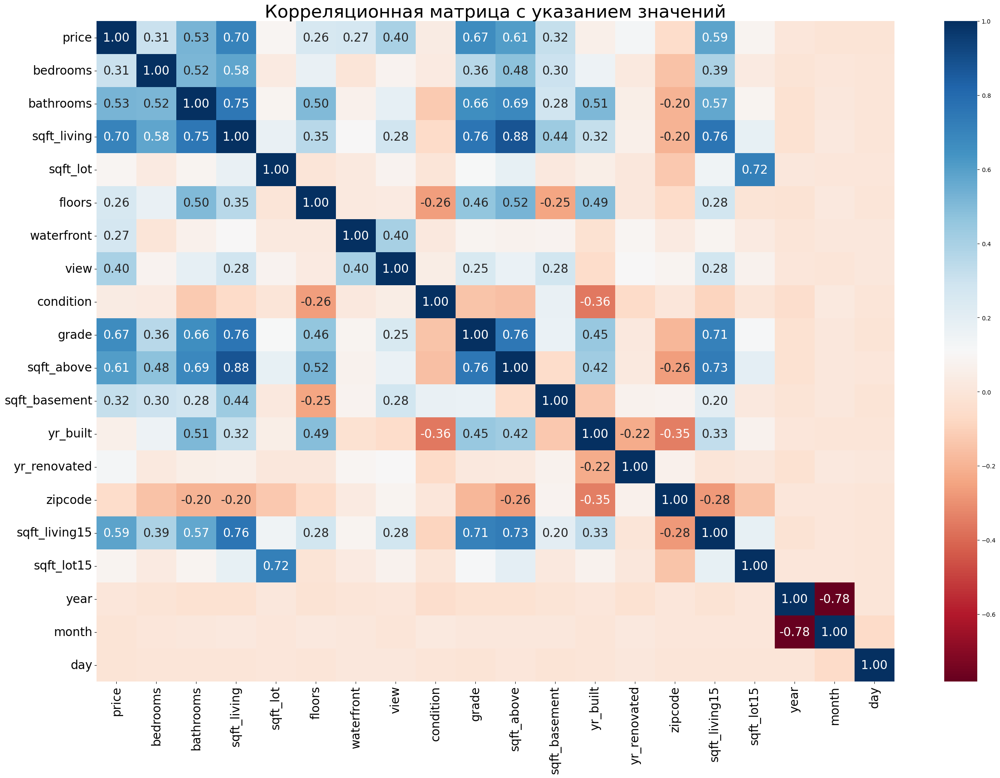

In [10]:
colormap = plt.cm.RdBu
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.heatmap(X_raw.corr(), ax=ax, annot=True, cmap=colormap, linecolor="white", fmt="0.2f")
ax.set_title('Корреляционная матрица с указанием значений', fontsize=30)
for t in ax.texts:
    if float(t.get_text()) >= 0.2 or float(t.get_text()) <= -0.2:
        t.set_text(t.get_text())
        t.set_fontsize(20)
    else:
        t.set_text("")
plt.xticks(fontsize=20,rotation=90)
plt.yticks(fontsize=20)
plt.show()

In [11]:
check = X_raw.corr().iloc[:,0]
mask = ((np.abs(check) > 0.2) & (np.abs(check) < 1))
check = check[mask]
check
lst = check.index.tolist()

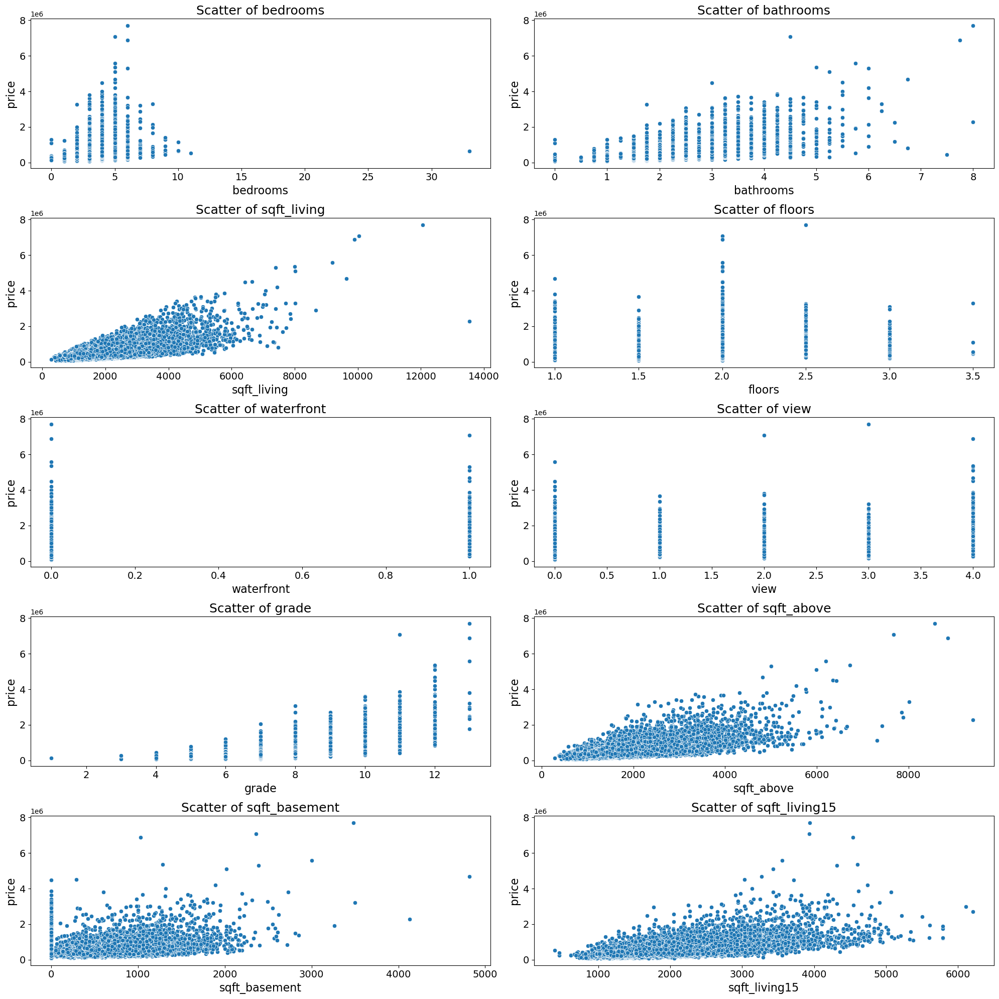

In [12]:
plt.figure(figsize=(20, 20))
gs = gridspec.GridSpec(5, 2) 
for i, feature in enumerate(lst):
    ax = plt.subplot(gs[i])
    sns.scatterplot(data = X_raw,x = feature, y = 'price')
    ax.set_title(f'Scatter of {feature}',fontsize=18)
    ax.set_xlabel(feature, fontsize=16)
    ax.set_ylabel('price', fontsize=16)
    ax.tick_params(axis='y', labelsize=14)
    ax.tick_params(axis='x', labelsize=14) 
plt.tight_layout()

In [48]:
# plt.scatter(np.power(np.log(np.power(X_raw['bathrooms'],2)), 2), X_raw['price']) - отказался от перевода

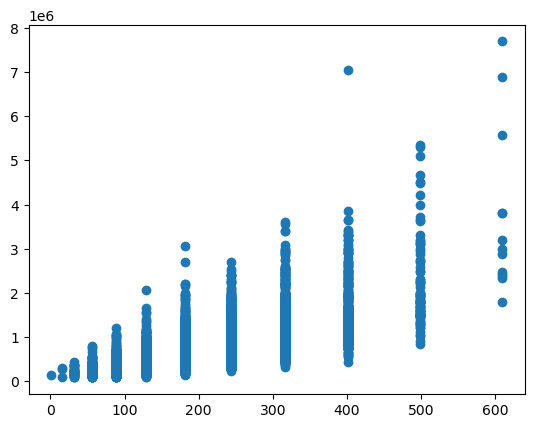

In [13]:
plt.scatter(np.power(X_raw['grade'],2.5), X_raw['price'])

In [50]:
# y = ((2 * 10 ** 6) ** 2) * np.sqrt(np.abs(1 - ((X_raw['sqft_basement']) ** 2 / (1000 ** 2)))) - тест
# plt.scatter(y, X_raw['price'])

In [51]:
# new_basement = np.where(X_raw['sqft_basement'] == 100, 100.01, X_raw['sqft_basement']) - аналогично не уверен в эффективности
# plt.scatter(np.power(np.abs(np.log1p(np.abs(new_basement - 100))), 7), X_raw['price'])

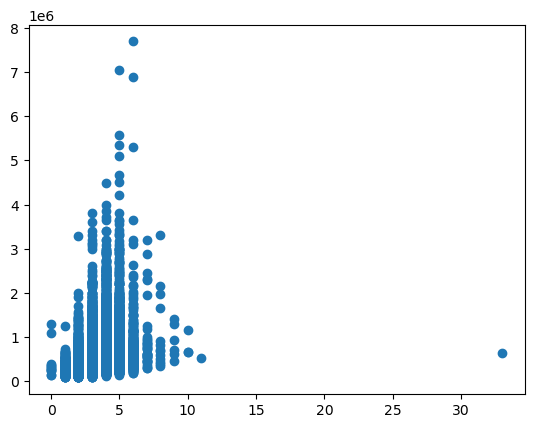

In [14]:
plt.scatter(X_raw['bedrooms'], X_raw['price'])

In [15]:
feature = X_raw['bedrooms']
max_point = 5
X_raw['bedrooms_before'] = np.where(feature <= max_point, feature, 0)
X_raw['bedrooms_after'] = np.where(feature > max_point, feature, 0)

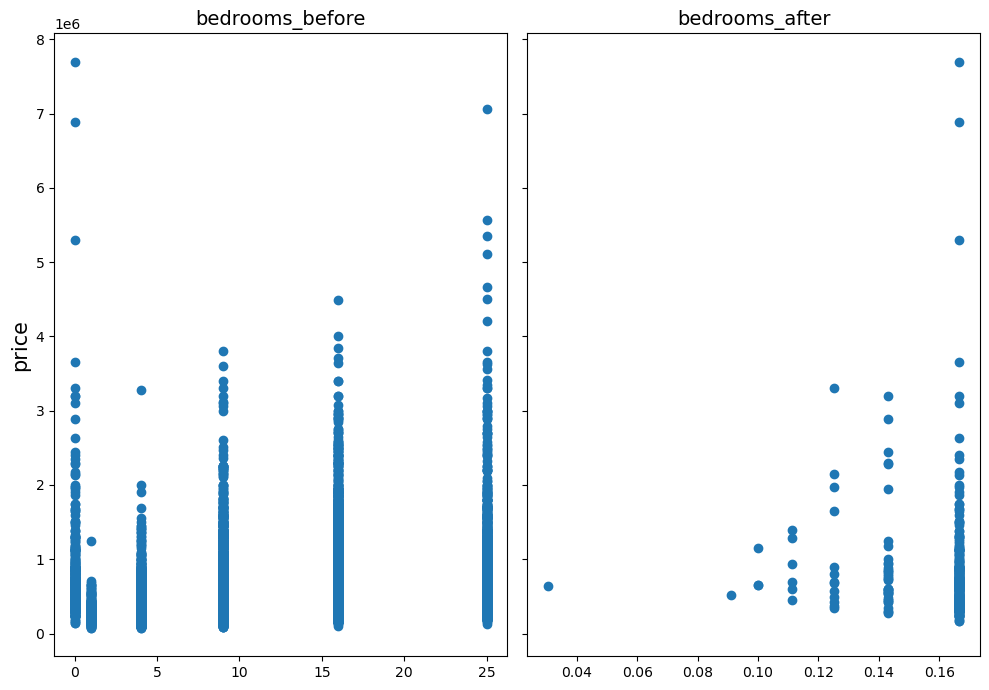

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(10, 7), sharey=True)

axes[0].scatter(X_raw['bedrooms_before'] ** 2, X_raw['price'])
axes[0].set_title('bedrooms_before', fontsize=14)
axes[0].set_ylabel('price', fontsize=15)

axes[1].scatter(1 / X_raw['bedrooms_after'], X_raw['price'])
axes[1].set_title('bedrooms_after', fontsize=14)
plt.tight_layout()

In [17]:
feature = X_raw['floors']
max_point1 = 1.5
max_point2 = 2
X_raw['floors_1'] = np.where(feature <= max_point1, feature, 0)
X_raw['floors_2'] = np.where(((feature > max_point1) & (feature <= max_point2)), feature, 0)
X_raw['floors_3'] = np.where(feature > max_point2, feature, 0)

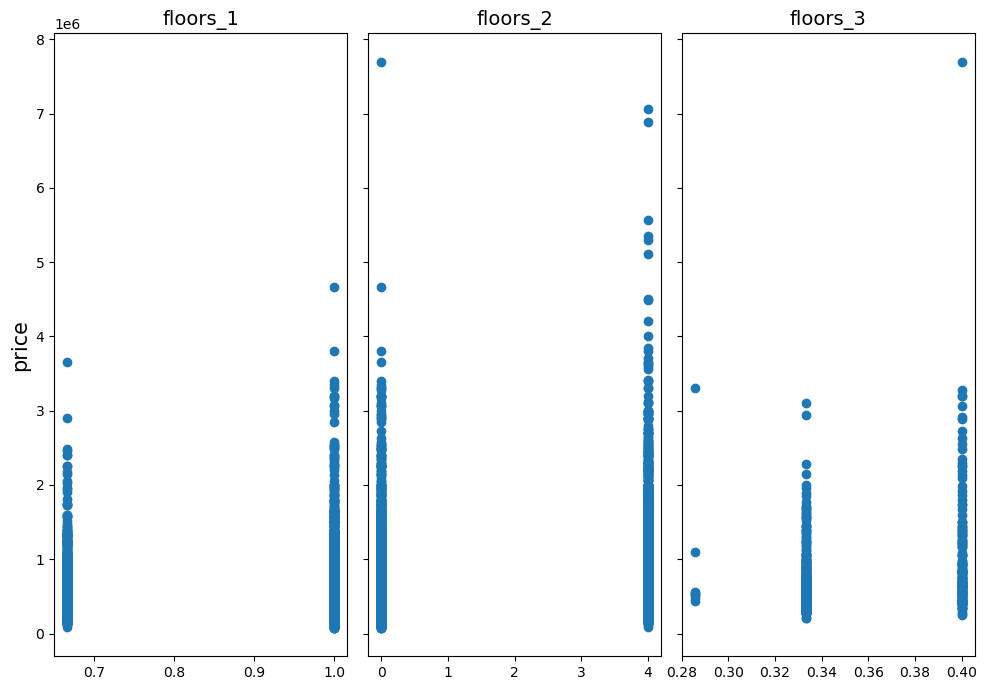

In [18]:
fig, axes = plt.subplots(1, 3, figsize=(10, 7), sharey=True)

axes[0].scatter(1 / X_raw['floors_1'], X_raw['price'])
axes[0].set_title('floors_1', fontsize=14)
axes[0].set_ylabel('price', fontsize=15)

axes[1].scatter(X_raw['floors_2'] ** 2, X_raw['price'])
axes[1].set_title('floors_2', fontsize=14)

axes[2].scatter(1 / X_raw['floors_3'], X_raw['price'])
axes[2].set_title('floors_3', fontsize=14)

plt.tight_layout()

In [19]:
X_raw = X_raw.drop(columns=['bedrooms','floors']) 

In [20]:
X_raw['floors_1_p'] = np.where(X_raw['floors_1'] != 0, 1 / X_raw['floors_1'], X_raw['floors_1'])
X_raw['floors_2_p'] = X_raw['floors_2'] ** 2
X_raw['floors_3_p'] = np.where(X_raw['floors_3'] != 0, 1 / X_raw['floors_3'], X_raw['floors_3'])

X_raw['bedrooms_before_p'] = X_raw['bedrooms_before'] ** 2
X_raw['bedrooms_after_p'] = np.where(X_raw['bedrooms_after'] != 0, 1 / X_raw['bedrooms_after'], X_raw['bedrooms_after'])

X_raw['grade_p'] = np.power(X_raw['grade'], 2.5)

In [21]:
lst = ['floors_1', 'floors_2', 'floors_3', 'bedrooms_before', 'bedrooms_after', 'grade']
X_raw = X_raw.drop(columns=lst) 

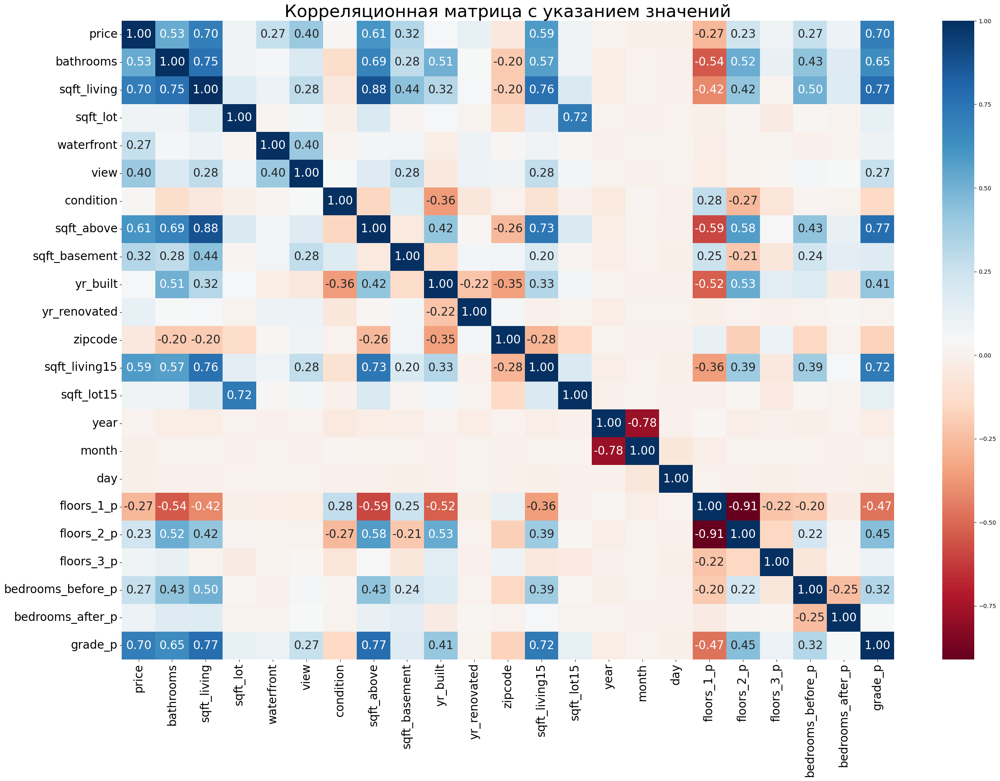

In [22]:
colormap = plt.cm.RdBu
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.heatmap(X_raw.corr(), ax=ax, annot=True, cmap=colormap, linecolor="white", fmt="0.2f")
ax.set_title('Корреляционная матрица с указанием значений', fontsize=30)
for t in ax.texts:
    if float(t.get_text()) >= 0.2 or float(t.get_text()) <= -0.2:
        t.set_text(t.get_text())
        t.set_fontsize(20)
    else:
        t.set_text("")
plt.xticks(fontsize=20,rotation=90)
plt.yticks(fontsize=20)
plt.show()

 ## Функционалы ошибок и градиентный спуск

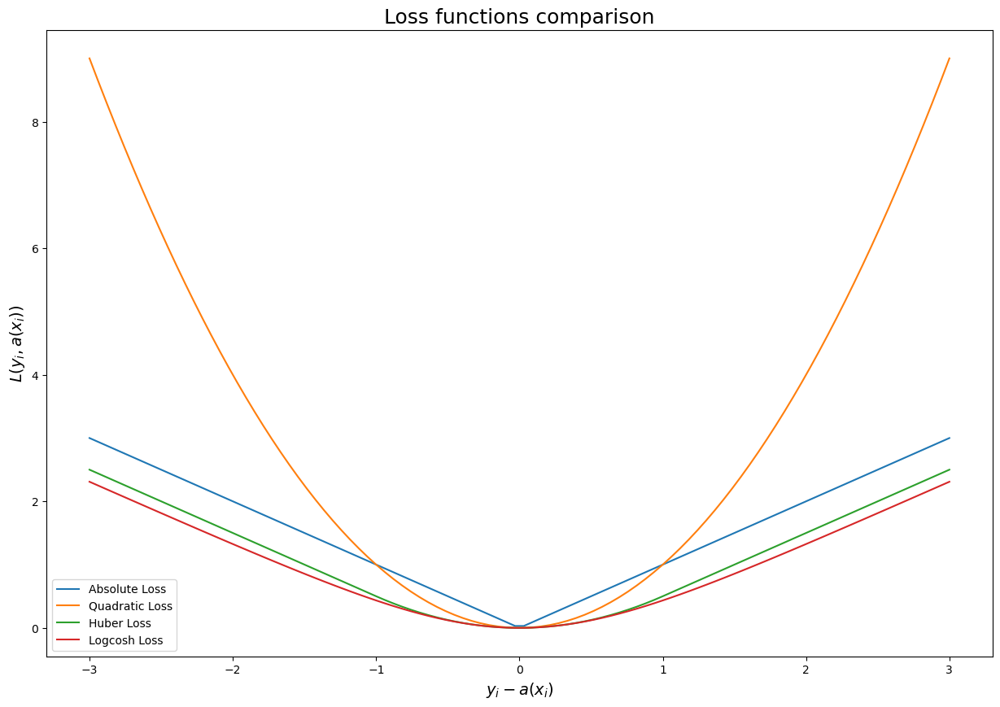

In [23]:
plt.figure(figsize=(15, 10))
grid = np.linspace(-3, 3, 100)
mse_loss = grid**2
mae_loss = np.abs(grid)
huber_loss = (
    0.5 * mse_loss * (grid >= -1) * (grid <= 1)
    + (mae_loss - 0.5) * (grid < -1)
    + (mae_loss - 0.5) * (grid > 1)
)
lcos = np.log(np.cosh(grid))
plt.plot(grid, mae_loss, label="Absolute Loss")
plt.plot(grid, mse_loss, label="Quadratic Loss")
plt.plot(grid, huber_loss, label="Huber Loss")
plt.plot(grid, lcos, label="Logcosh Loss")
plt.xlabel("$y_i - a(x_i)$", fontsize=14)
plt.ylabel("$L(y_i, a(x_i))$", fontsize=14)
plt.title("Loss functions comparison", fontsize=18)
plt.legend()
plt.show()

In [23]:
import abc


class BaseLoss(abc.ABC):

    @abc.abstractmethod
    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
       
        raise NotImplementedError

    @abc.abstractmethod
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
       
        raise NotImplementedError

    @abc.abstractmethod
    def calc_grad_sag(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
       
        raise NotImplementedError

Функционал MSE:
$$ 
Q(a,X) = \frac{1}{l} \sum_{i=1}^{l} (y_i - a(x_i))^2 
$$
Функционал MSE в матричном виде:
$$
Q(w,X,y) = (y - Xw)^T(y - Xw)
$$
Градиент:
$$
\nabla_w Q(w,X,y) = \frac{2}{l}X^T(Xw-y)
$$
 

Сложность вычислений при нахождении параметров в данном случае равна $O(d \ell)$.

In [24]:
class MSELoss(BaseLoss):
    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        return np.square(X.dot(w) - y).mean()

    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        return 2 * X.T @ (X.dot(w) - y) / y.shape[0]

    def calc_grad_sag(self, X: np.ndarray, y: float , w: np.ndarray) -> np.ndarray:
        return 2 * X * (X.dot(w) - y)

Функция потерь Хьюбера:
$$ 
L_{\delta}(r) = 
\begin{cases} 
\frac{1}{2}r^2 & \text{если } |r| < \delta, \\
\delta(|r| - \frac{1}{2}\delta) & \text{если } |r| \geq \delta,
\end{cases}
$$
Функционал Huber Loss:
$$
Q_{\delta}(a, X) = \frac{1}{l} \sum_{i=1}^{l} L_{\delta}(y_i - a(x_i))
$$
Градиент:
$$
\nabla_w Q_{\delta}(w,X,y) = \frac{1}{l}
\begin{cases} 
X^T (Xw - y) & \text{если } |y_i - <xi,w>| < \delta, \\
X^T \cdot \delta \cdot \text{sign}(Xw - y) & \text{если } |y_i - <x_i,w>| \geq \delta
\end{cases}
$$
Сложность вычислений при нахождении параметров в данном случае равна $O(d \ell)$.

In [25]:
class HuberLoss(BaseLoss):
    def __init__(self, eps: float) -> None:
        self.eps = eps

    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        diff = X.dot(w) - y
        result = np.zeros_like(y)
        mask = (diff < self.eps) & (diff > -self.eps)
        result[mask] = diff[mask] ** 2 / 2
        result[~mask] = self.eps * (np.abs(diff[~mask]) - 1 / 2 * self.eps)
        return result.mean()
        
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        diff = X.dot(w) - y
        mask = np.abs(diff) < self.eps
        grad_mse = X.T @ (diff * mask)
        grad_mae = X.T @ (self.eps * np.sign(diff) * ~mask)
        return (grad_mse + grad_mae) / y.shape[0]
        
    def calc_grad_sag(self, X: np.ndarray, y: float, w: np.ndarray) -> np.ndarray:
        diff = X.dot(w) - y
        mask = np.abs(diff) < self.eps  
        grad_mse = X * diff * mask
        grad_mae = X * self.eps * np.sign(diff) * ~mask
        return grad_mse + grad_mae

Функция потерь Log-Cosh:
$$
L(y, a) = \log(\cosh(y - a))
$$
Функционал Log-Cosh:
$$
Q(w,X,y) = \frac{1}{l} \sum_{i=1}^{l} \log(\cosh(y_i - a(x_i)))
$$
Градиент:
$$
\nabla_w Q(w,X,y) = \frac{1}{l} X^T \tanh(Xw - y)
$$
Сложность вычислений при нахождении параметров в данном случае равна $O(d \ell)$.

In [80]:
class LogCosh(BaseLoss):
    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        errors = X.dot(w) - y
        logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors))) 
        return logcosh_loss.mean()
        
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        return X.T @ np.tanh(X.dot(w) - y) / y.shape[0]

    def calc_grad_sag(self, X: np.ndarray, y: float, w: np.ndarray) -> np.ndarray:
        return X * np.tanh(X.dot(w) - y) 

In [2335]:
class LinearRegression:
    def __init__(self, loss: BaseLoss, lr: float = 0.01, method: str = 'GD', p: float = 0.32, batch_size: int = 128, n_iterations: int = 100000) -> None:
        self.loss = loss
        self.lr = lr
        self.method = method
        self.eps = 1e-5
        self.batch_size = batch_size
        self.n_iterations = n_iterations
        
    def fit(self, X: np.ndarray, y: np.ndarray) -> "LinearRegression":
        X = np.asarray(X)
        y = np.asarray(y)
        # Добавляем столбец из единиц для константного признака
        X = np.hstack([X, np.ones([X.shape[0], 1])])
        np.random.seed(1338)
        w_init = np.random.uniform(-1e-4, 1e-4, (X.shape[1]))
        if self.method == 'SGD':
            self.w = self.stochastic_gradient_descent(w_init, X, y, self.loss)
        elif self.method == 'SAD':
            self.w = self.stochastic_average_gradient(w_init, X, y, self.loss)
        else:
            self.w = self.gradient_descent(w_init, X, y, self.loss, self.lr)
        return self

    def gradient_descent(self, w_init: np.ndarray, X: np.ndarray, y: np.ndarray, loss: BaseLoss, lr: float) -> np.ndarray:
        
        w = w_init.copy()        
        iteration = 0
        while np.linalg.norm(grad := loss.calc_grad(X,y,w)) >= self.eps and iteration < self.n_iterations:
            w -= lr * grad
            iteration += 1
        return w
    
    def stochastic_gradient_descent(self, w_init: np.ndarray, X: np.ndarray, y: np.ndarray, loss: BaseLoss, p: float = 0.32) -> np.ndarray:
        
        batch_indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
        batch = X[batch_indices]
        w = w_init.copy()
        
        iteration = 0
        while np.linalg.norm(grad := loss.calc_grad(batch,y[batch_indices],w)) >= self.eps and iteration < self.n_iterations:
            #w -= (0.1 / np.power(iteration + 1, 0.5)) * grad
            w -= self.lr * np.power((1 / (1 + iteration)), p) * grad
            batch_indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
            batch = X[batch_indices]
            iteration += 1
        return w

    def stochastic_average_gradient(self, w_init: np.ndarray, X: np.ndarray, y: np.ndarray, loss: BaseLoss, p: float = 0.32) -> np.ndarray:
        
            n_samples, n_features = X.shape
            grad_memory = np.zeros((n_samples, n_features))
            w = w_init.copy()
        
            for i in range(n_samples):
                grad_memory[i] = loss.calc_grad_sag(X[i], y[i], w)
            avg_grad = grad_memory.mean(axis=0)
        
            iteration = 0
            while np.linalg.norm(avg_grad) >= self.eps and iteration < self.n_iterations:
                i = np.random.randint(0, n_samples)
                grad_i = loss.calc_grad_sag(X[i], y[i], w)
                avg_grad += (grad_i - grad_memory[i]) / n_samples
                grad_memory[i] = grad_i
                w -= self.lr * avg_grad
                #w -= (0.1 / np.power(iteration + 1, 0.5)) * avg_grad
                #w -= self.lr * np.power((1 / (1 + iteration)), p) * avg_grad
                #w -= self.lr * avg_grad / np.sqrt(iteration + 1)
                iteration += 1
            return w
    
    def predict(self, X: np.ndarray) -> np.ndarray:
        # Проверяем, что регрессия обучена, то есть, что был вызван fit и в нём был установлен атрибут self.w
        assert hasattr(self, "w"), "Linear regression must be fitted first"
        # Добавляем столбец из единиц для константного признака
        X = np.hstack([X, np.ones([X.shape[0], 1])])
        return X @ self.w

In [929]:
class LinearRegressionStats(LinearRegression):
    def __init__(self, loss: BaseLoss, lr: float = 0.01, method: str = 'GD', n_iterations: int = 100000, p: float = 0.32, batch_size: int = 128) -> None:
        super().__init__(loss, lr, method, p, batch_size, n_iterations)

    def calc_loss_rmse(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        return (np.square(X.dot(w) - y).mean()) ** 0.5
    
    def gradient_descent(self, w_init: np.ndarray, X: np.ndarray, y: np.ndarray, loss: BaseLoss, lr: float) -> np.ndarray:
        grad_list = []
        deviation = [loss.calc_loss(X, y, w_init)]
        rmse = [self.calc_loss_rmse(X, y, w_init)]
        w = w_init.copy()
        result = [w.copy()]
        
        iteration = 0
        while np.linalg.norm(grad := loss.calc_grad(X, y, w)) >= self.eps and iteration < self.n_iterations:
            grad_list.append(np.linalg.norm(grad))
            w -= lr * grad
            deviation.append(loss.calc_loss(X, y, w))
            rmse.append(self.calc_loss_rmse(X, y, w))
            result.append(w.copy())
            iteration += 1
        
        self.deviation_list = deviation
        self.grad_list = grad_list
        self.descent_list = result
        self.iteration = iteration
        self.rmse_list = rmse
        return w
    
    def stochastic_gradient_descent(self, w_init: np.ndarray, X: np.ndarray, y: np.ndarray, loss: BaseLoss, p: float = 0.32) -> np.ndarray:
        batch_indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
        batch = X[batch_indices]
        grad_list = []
        deviation = [loss.calc_loss(X, y, w_init)]
        rmse = [self.calc_loss_rmse(X, y, w_init)]
        w = w_init.copy()
        result = [w.copy()]
        
        iteration = 0
        while np.linalg.norm(grad := loss.calc_grad(batch, y[batch_indices], w)) >= self.eps and iteration < self.n_iterations:
            grad_list.append(np.linalg.norm(grad))
             #w -= (0.1 / np.power(iteration + 1, 0.5)) * grad
            w -= self.lr * np.power((1 / (1 + iteration)), p) * grad
            #w -= 1e-2 * grad
            deviation.append(loss.calc_loss(X, y, w))
            rmse.append(self.calc_loss_rmse(X, y, w))
            result.append(w.copy())
            batch_indices = np.random.choice(X.shape[0], size=self.batch_size, replace=False)
            batch = X[batch_indices]
            iteration += 1
        
        self.deviation_list = deviation
        self.grad_list = grad_list
        self.descent_list = result
        self.iteration = iteration
        self.rmse_list = rmse
        return w

    def stochastic_average_gradient(self, w_init: np.ndarray, X: np.ndarray, y: np.ndarray, loss: BaseLoss, p: float = 0.32) -> np.ndarray:
        n_samples, n_features = X.shape
        grad_memory = np.zeros((n_samples, n_features))
        grad_list = []
        deviation = [loss.calc_loss(X, y, w_init)]
        rmse = [self.calc_loss_rmse(X, y, w_init)]
        w = w_init.copy()
        result = [w.copy()]
        
        for i in range(n_samples):
            grad_memory[i] = loss.calc_grad_sag(X[i], y[i], w)
        avg_grad = grad_memory.mean(axis=0)
        
        iteration = 0
        while np.linalg.norm(avg_grad) >= self.eps and iteration < self.n_iterations:
            i = np.random.randint(0, n_samples)
            grad_i = loss.calc_grad_sag(X[i], y[i], w)
            avg_grad += (grad_i - grad_memory[i]) / n_samples
            grad_list.append(np.linalg.norm(avg_grad))
            grad_memory[i] = grad_i
            w -= self.lr * avg_grad
            #w -= (0.1 / np.power(iteration + 1, 0.5)) * avg_grad
            #w -= self.lr * np.power((1 / (1 + iteration)), p) * avg_grad
            #w -= 1e-4 * avg_grad
            deviation.append(loss.calc_loss(X, y, w))
            rmse.append(self.calc_loss_rmse(X, y, w))
            result.append(w.copy())
            iteration += 1
            
        self.deviation_list = deviation
        self.grad_list = grad_list
        self.descent_list = result
        self.iteration = iteration
        self.rmse_list = rmse
        return w

Сгенерируем матрицу объекты-признаки $X$ и вектор весов $w_{true}$, вектор целевых переменных $y$ будем вычислять как:

$$
y = Xw_{true} + \epsilon,
$$
где $\epsilon \sim N(0, 1)$ (нормальный шум).

In [108]:
np.random.seed(25)
n_features = 2
n_objects = 300
batch_size = 10
num_steps = 43

w_true = np.random.normal(size=(n_features,))

X = np.random.uniform(-5, 5, (n_objects, n_features))
X *= (np.arange(n_features) * 2 + 1)[np.newaxis, :]
Y = X.dot(w_true) + np.random.normal(0, 1, (n_objects))
w_0 = np.random.uniform(-2, 2, (n_features))

In [208]:
def plot_gradient(w_list, title, loss: BaseLoss):
    A, B = np.meshgrid(np.linspace(-2, 2, 100), np.linspace(-2, 2, 100))

    levels = np.empty_like(A)
    for i in range(A.shape[0]):
        for j in range(A.shape[1]):
            w_tmp = np.array([A[i, j], B[i, j]])
            levels[i, j] = loss.calc_loss(X, Y, w_tmp)

    plt.figure(figsize=(15, 6))
    plt.title(title)
    plt.xlabel(r"$w_1$")
    plt.ylabel(r"$w_2$")
    plt.xlim((w_list[:, 0].min() - 0.2, w_list[:, 0].max() + 0.2))
    plt.ylim((w_list[:, 1].min() - 0.2, w_list[:, 1].max() + 0.2))
    plt.gca().set_aspect("equal")

    # visualize the level set
    CS = plt.contour(
        A, B, levels, levels=np.logspace(0, 1, num=20), cmap=plt.cm.rainbow_r
    )
    CB = plt.colorbar(CS, shrink=0.8, extend="both")

    # visualize trajectory
    plt.scatter(w_true[0], w_true[1], c="r")
    plt.scatter(w_list[:, 0], w_list[:, 1])
    plt.plot(w_list[:, 0], w_list[:, 1])

    plt.show()

### Визуализация траекторий GD

In [214]:
w = w_0.copy()
lr_vis = LinearRegressionStats(MSELoss(), method='GD')
lr_vis.gradient_descent(w, X, Y, lr_vis.loss, lr=1e-2, n_iterations=num_steps)
w_list = np.array(lr_vis.descent_list)

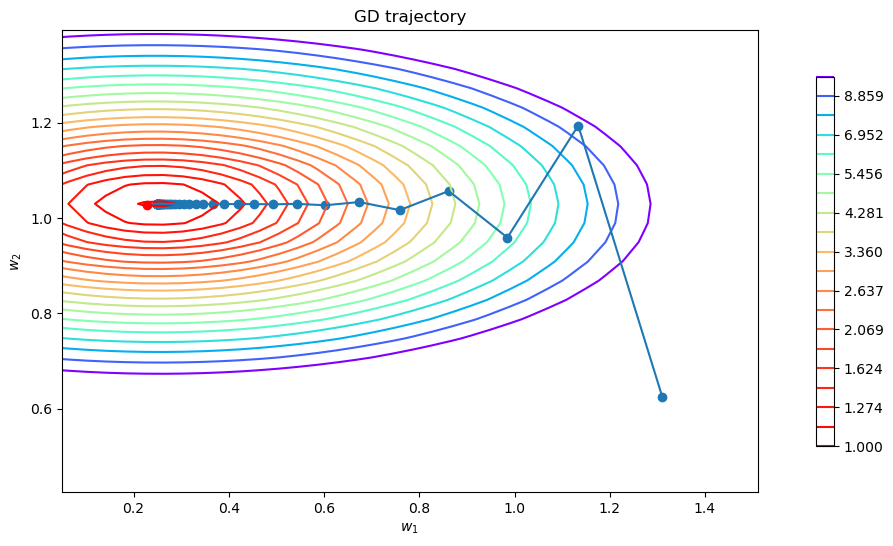

In [215]:
plot_gradient(w_list, "GD trajectory", MSELoss())

### Визуализация траекторий SGD

In [204]:
w = w_0.copy()
lr_vis = LinearRegressionStats(MSELoss(), method='SGD')
lr_vis.stochastic_gradient_descent(w, X, Y, lr_vis.loss, batch_size=batch_size, n_iterations=num_steps)
w_list = np.array(lr_vis.descent_list)

Заменить шаг в классе на 1e-2

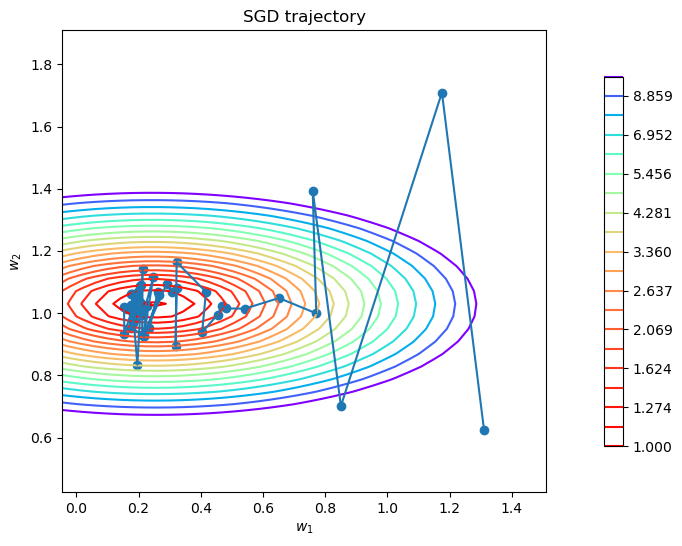

In [205]:
plot_gradient(w_list, "SGD trajectory", MSELoss())

### Визуализация траекторий SAG

In [321]:
w = w_0.copy()
lr_vis = LinearRegressionStats(MSELoss(), method='SAG')
lr_vis.stochastic_average_gradient(w, X, Y, lr_vis.loss, n_iterations=1050)
w_list = np.array(lr_vis.descent_list)

Заменить шаг в классе на 1e-4

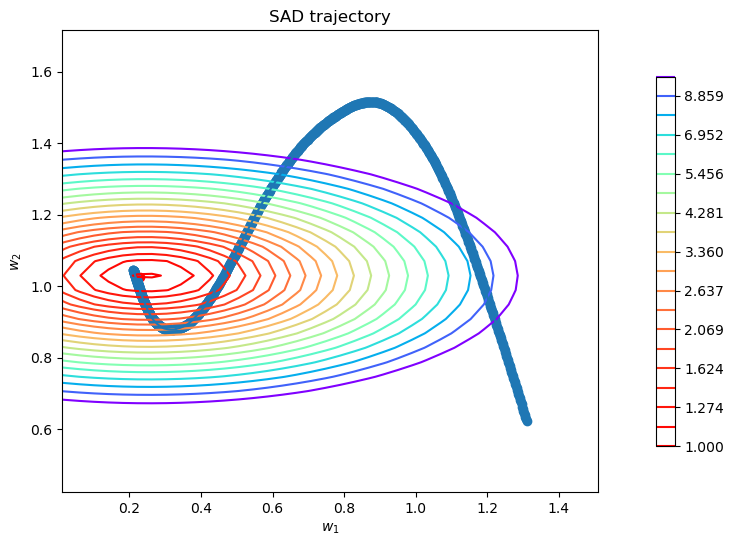

In [299]:
plot_gradient(w_list, "SAD trajectory", MSELoss())

## Этап 1
### Данные не масштабированы

In [1172]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [1713]:
y = X_raw['price']
X_dum = X_raw.drop('price', axis=1)

In [32]:
X_dum = X_dum.values
y = y.values
X_train, X_temp, y_train, y_temp = train_test_split(X_dum,y,test_size=0.30,random_state=66)
X_val, X_test, y_val, y_test = train_test_split(X_temp,y_temp,test_size=0.3333,random_state=66)

In [1714]:
X_dum = X_dum.values
y = y.values
X_train, X_test, y_train, y_test = train_test_split(X_dum,y,test_size=0.3,random_state=69)

## GD

In [698]:
lr_mse = LinearRegressionStats(MSELoss(), lr=1e-11, method='GD')
lr_mse.fit(X_train, y_train)
np.array(lr_mse.w)

array([ 8.18236190e-02,  1.35452497e+02,  1.39485310e-01,  1.36546490e-02,
        1.39164368e-01,  4.06024310e-02,  8.59708098e+01,  4.94816077e+01,
       -2.60152062e+00,  2.40997454e+01, -6.55940743e-01,  8.23201415e+01,
       -8.14693172e-01, -5.25708320e-02, -4.75169107e-02, -4.38598756e-02,
       -1.53095778e-02,  5.88520095e-03,  3.58241104e-03,  1.28082562e-01,
        4.59719068e-04,  1.45590717e+01, -4.32248467e-05])

In [701]:
print(f"Train: {mean_squared_error(y_train, lr_mse.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse.predict(X_test))**0.5}")
print(r2_score(y_train, lr_mse.predict(X_train)), r2_score(y_test, lr_mse.predict(X_test)))

Train: 253568.48710008833
Test: 273366.8075345785
0.4987788032674282 0.5015775687754409


In [39]:
from sklearn.model_selection import KFold

learning_rates = np.logspace(-15, -11, num=10)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
best_lr = None
best_score = float('inf')

for lr in learning_rates:
    scores = []
    for train_index, val_index in kf.split(X_train):
        X_tr, X_val = X_train[train_index], X_train[val_index]
        y_tr, y_val = y_train[train_index], y_train[val_index]
        
        model = LinearRegression(MSELoss(), lr=lr, method='GD')
        model.fit(X_tr, y_tr)
        
        y_pred = model.predict(X_val)
        score = mean_squared_error(y_val, y_pred) ** 0.5 
        scores.append(score)
    
    mean_score = np.mean(scores)
    if mean_score < best_score:
        best_score = mean_score
        best_lr = lr

print(f"Лучший шаг обучения (learning rate): {best_lr}, с RMSE: {best_score}")

Лучший шаг обучения (learning rate): 1e-11, с RMSE: 253618.4044404268


In [702]:
lr_hub = LinearRegressionStats(HuberLoss(0.01), lr=0.004, method='GD')
lr_hub.fit(X_train, y_train)
np.array(lr_hub.w)

array([ 9.85493592e-02,  1.08014277e+02,  1.37319113e-01,  2.58930901e-02,
        4.47329023e-01,  2.52128944e-01,  3.99090768e+01,  6.81051202e+01,
       -2.08989749e+01,  4.81394458e+01,  3.30539575e-01,  9.66660475e+01,
       -6.28486115e-01, -5.16083086e-01, -3.14662926e-01, -5.35672781e-01,
       -8.53121808e-02, -2.09751118e-01,  3.39383033e-02, -1.55311137e+00,
        5.78447146e-05,  5.58270171e+01, -2.89964711e-04])

In [357]:
# finite_min = np.nanmin(lr.w[np.isfinite(lr.w)])
# lr.w = np.nan_to_num(lr.w, neginf=finite_min)

# train_pred = lr.predict(X_train)
# val_pred = lr.predict(X_val)
# finite_max = np.nanmax(np.abs(train_pred[np.isfinite(train_pred)]))  # Максимум среди конечных значений
# train_pred = np.nan_to_num(train_pred, nan=finite_max, posinf=finite_max, neginf=-finite_max)
# val_pred = np.nan_to_num(val_pred, nan=finite_max, posinf=finite_max, neginf=-finite_max)

In [358]:
# y_train_log = np.log1p(y_train)
# y_val_log = np.log1p(y_val)
# train_pred_log = np.log1p(np.abs(train_pred))
# val_pred_log = np.log1p(np.abs(val_pred))

In [359]:
# from sklearn.metrics import mean_squared_error
# from sklearn.metrics import r2_score
# print(f"Train: {mean_squared_error(y_train_log, train_pred_log) **0.5}")
# print(f"Val: {mean_squared_error(y_val_log, val_pred_log) **0.5}")
# print(r2_score(y_train_log, train_pred_log), r2_score(y_val_log, val_pred_log))

In [714]:
print(f"Train: {mean_squared_error(y_train, lr_hub.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub.predict(X_test))**0.5}")
print(r2_score(y_train, lr_hub.predict(X_train)), r2_score(y_test, lr_hub.predict(X_test)))

Train: 259222.37405146216
Test: 282139.80072555057
0.47617787549176005 0.4690731025035261


In [384]:
from sklearn.base import BaseEstimator, RegressorMixin
from skopt import BayesSearchCV
from skopt.space import Real, Categorical


param_space = {
    'lr': Real(1e-5, 1e-2, prior='log-uniform'),
    'delta': Categorical([0.01, 0.1, 0.5, 1, 10])  
}

class WrappedHuberModel(BaseEstimator, RegressorMixin):
    def __init__(self, lr=1e-4, delta=1.0):  
        self.lr = lr
        self.delta = delta
        self.model = LinearRegression(HuberLoss(self.delta), lr=self.lr, method='GD')
    
    def fit(self, X, y):
        self.model = LinearRegression(HuberLoss(self.delta), lr=self.lr, method='GD')
        self.model.fit(X, y)
        return self
    
    def predict(self, X):
        return self.model.predict(X)
    
    def get_params(self, deep=True):
        # Возвращаем параметры модели для совместимости с GridSearchCV и BayesSearchCV
        return {'lr': self.lr, 'delta': self.delta}
    
    def set_params(self, **params):
        # Устанавливаем параметры модели
        for key, value in params.items():
            setattr(self, key, value)
        self.model = LinearRegression(HuberLoss(self.delta), lr=self.lr, method='GD')
        return self

# Настройка поиска
opt = BayesSearchCV(
    estimator=WrappedHuberModel(),
    search_spaces=param_space,
    n_iter=20,  # Количество итераций оптимизации
    cv=5,
    scoring='neg_root_mean_squared_error',  # Используем RMSE (отрицательное для оптимизации)
    random_state=42
)

# Выполняем поиск
opt.fit(X_train, y_train)
print(f"Лучшие параметры: {opt.best_params_}")
print(f"Лучшая RMSE: {-opt.best_score_}")  # Отрицательное значение из-за параметра scoring


Лучшие параметры: OrderedDict({'delta': 0.01, 'lr': 0.004061796176609969})
Лучшая RMSE: 265123.57864476414


In [706]:
lr_cos = LinearRegressionStats(LogCosh(), lr=3.79e-05, method='GD')
lr_cos.fit(X_train, y_train)
np.array(lr_cos.w)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


array([ 9.70786681e-02,  1.08059170e+02,  1.29067302e-01,  2.45610556e-02,
        4.26149169e-01,  2.38947022e-01,  4.03136384e+01,  6.77454520e+01,
       -1.97989860e+01,  4.73323167e+01,  3.02716715e-01,  9.63852853e+01,
       -6.29121006e-01, -4.88548601e-01, -2.96303865e-01, -5.07753268e-01,
       -8.09835455e-02, -1.96859387e-01,  3.20565143e-02, -1.44661558e+00,
        7.25629308e-05,  5.32065226e+01, -2.75127071e-04])

In [713]:
print(f"Train: {mean_squared_error(y_train, lr_cos.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos.predict(X_train)), r2_score(y_test, lr_cos.predict(X_test)))

Train: 259429.3249552644
Test: 282347.01845872565
0.47534115192268844 0.46829293700335106


In [53]:
from sklearn.model_selection import KFold

learning_rates = np.logspace(-6, -1, num=20)

kf = KFold(n_splits=5, shuffle=True, random_state=42)
best_lr = None
best_score = float('inf')

for lr in learning_rates:
    scores = []
    for train_index, val_index in kf.split(X_train):
        X_tr, X_val = X_train[train_index], X_train[val_index]
        y_tr, y_val = y_train[train_index], y_train[val_index]
        
        model = LinearRegression(LogCosh(), lr=lr, method='GD')
        model.fit(X_tr, y_tr)
        
        y_pred = model.predict(X_val)
        score = mean_squared_error(y_val, y_pred) ** 0.5 
        scores.append(score)
    
    mean_score = np.mean(scores)
    if mean_score < best_score:
        best_score = mean_score
        best_lr = lr

print(f"Лучший шаг обучения (learning rate): {best_lr}, с RMSE: {best_score}")

Лучший шаг обучения (learning rate): 3.792690190732254e-05, с RMSE: 259373.0498217321


## Оценка GD

### Функционал потерь от величины ошибки

In [815]:
errors_mse = np.array(lr_mse.deviation_list)[1::50] ** 0.5
errors_huber = np.array(lr_hub.deviation_list)[1::50]  
errors_logcosh = np.array(lr_cos.deviation_list)[1::50]

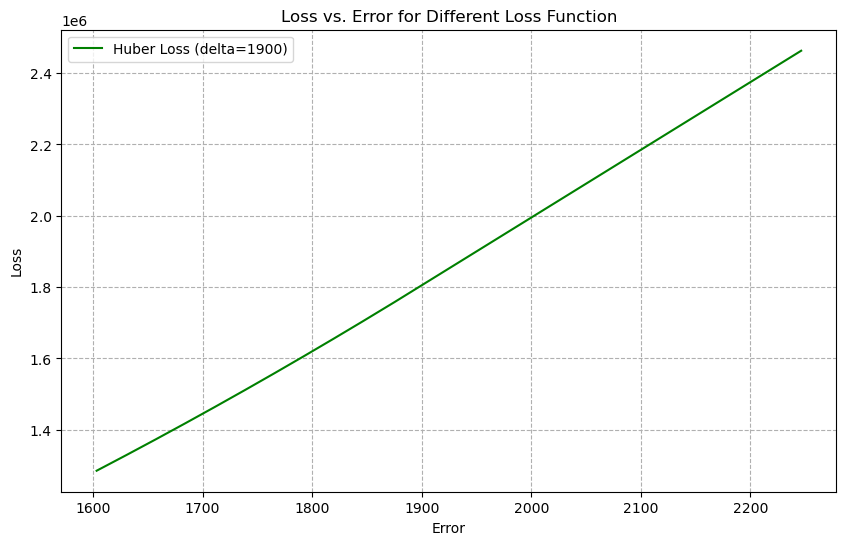

In [363]:
delta = 1900
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

plt.figure(figsize=(10, 6))
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

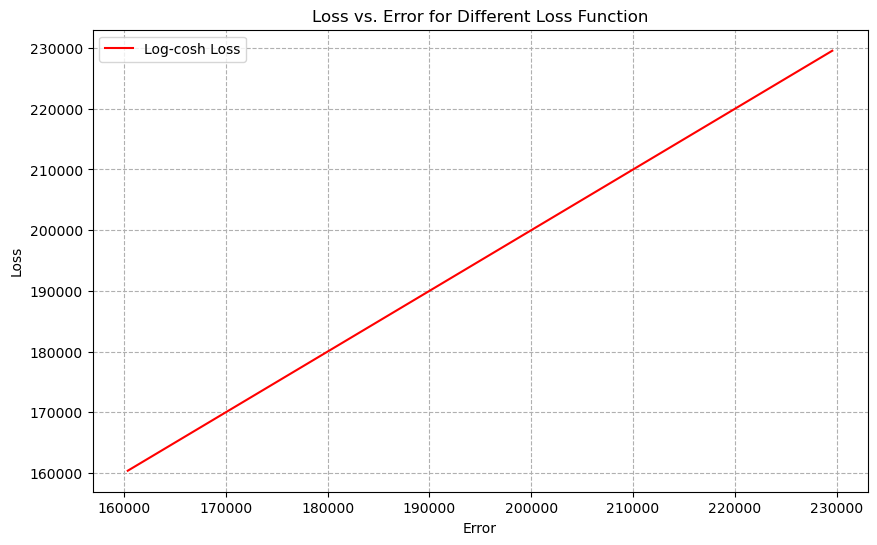

In [364]:
logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

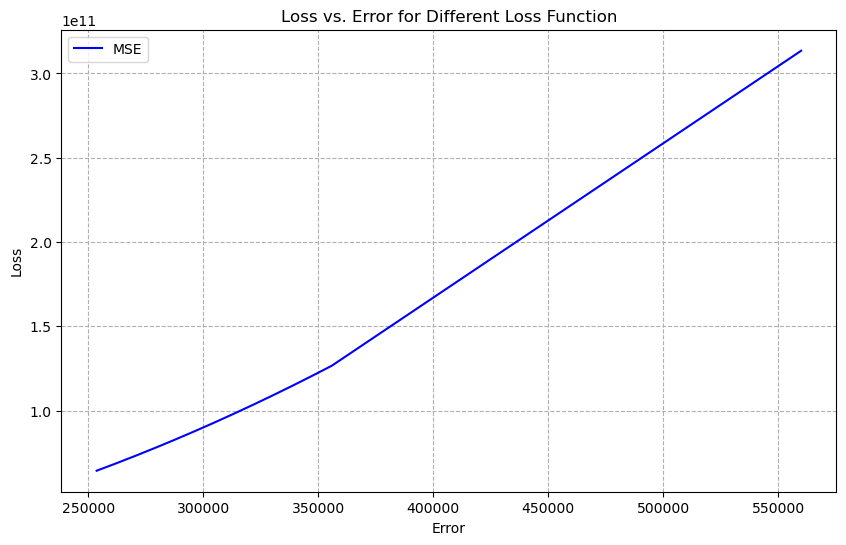

In [365]:
mse_loss = errors_mse ** 2

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

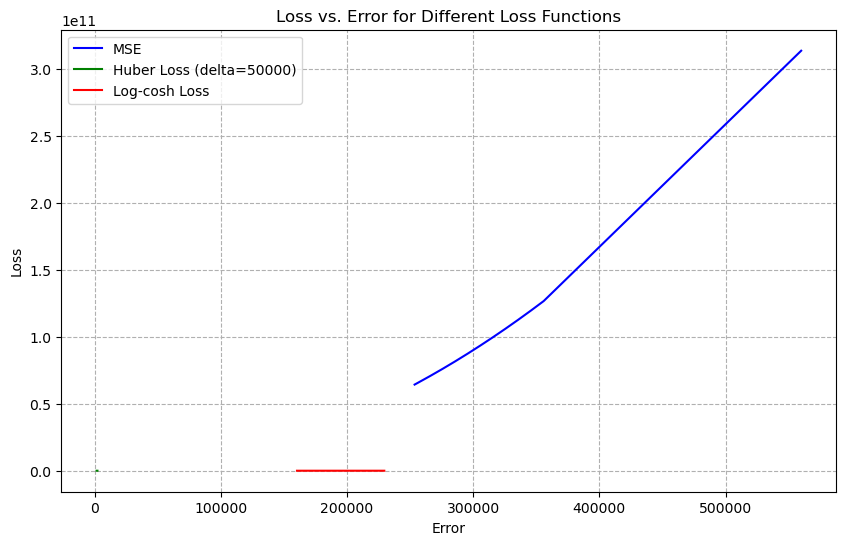

In [819]:
mse_loss = errors_mse ** 2

delta = 50000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

In [767]:
errors_mse = np.array(lr_mse.rmse_list)[1::50]
errors_huber = np.array(lr_hub.rmse_list)[1::50]  
errors_logcosh = np.array(lr_cos.rmse_list)[1::50]

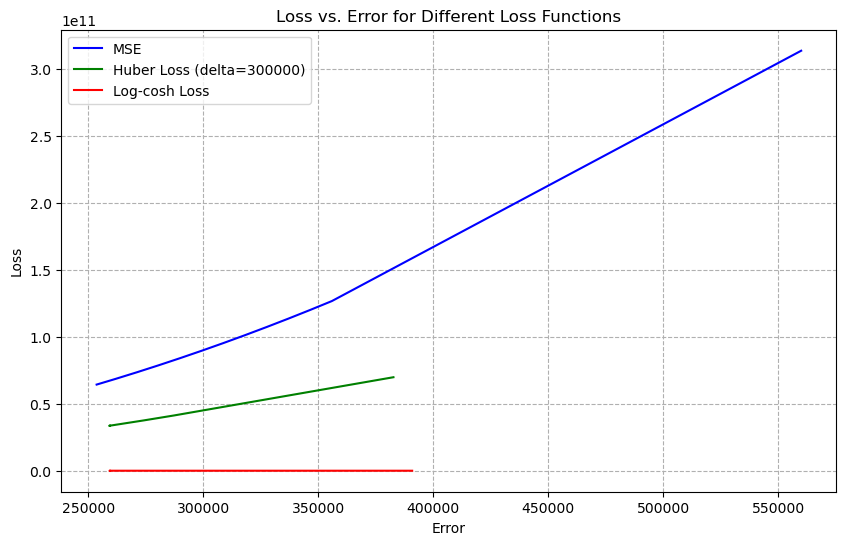

In [768]:
mse_loss = errors_mse ** 2

delta = 300000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

### Функции потерь от итерации

In [635]:
num_steps = 200
errors_mse = np.array(lr_mse.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos.deviation_list)[:num_steps]

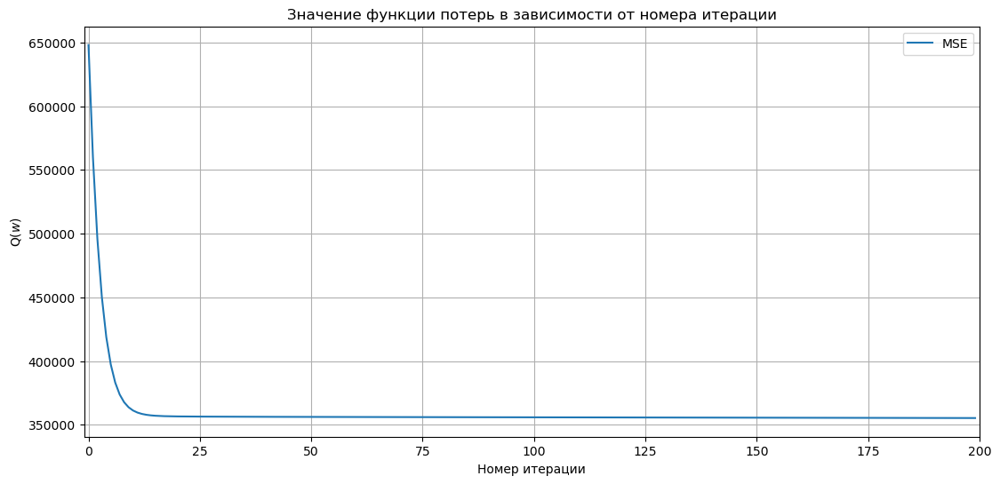

In [636]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

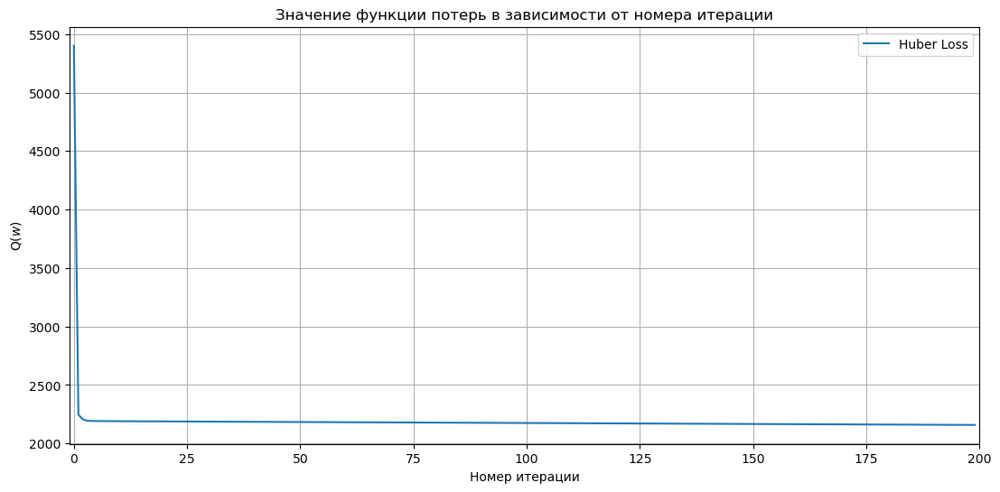

In [637]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber, label="Huber Loss")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

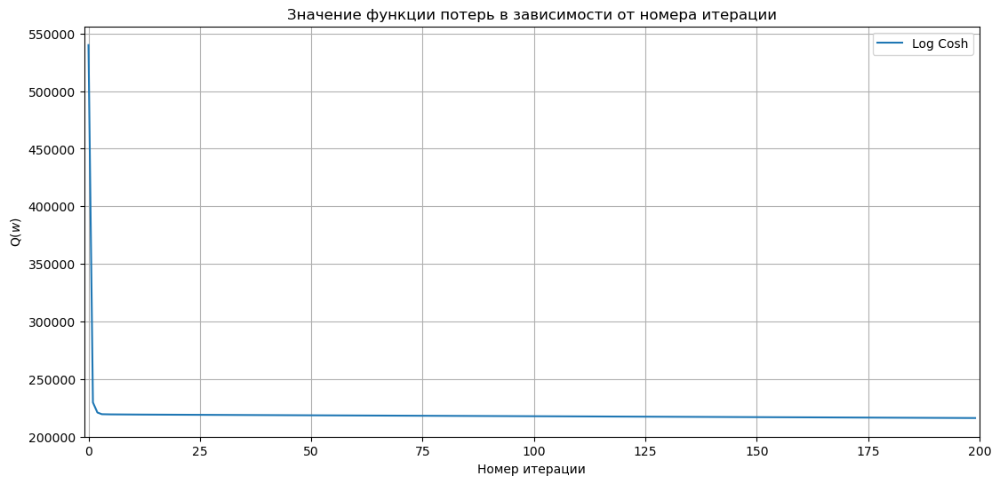

In [638]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [640]:
num_steps = 100000
errors_mse = np.array(lr_mse.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos.deviation_list)[:num_steps]

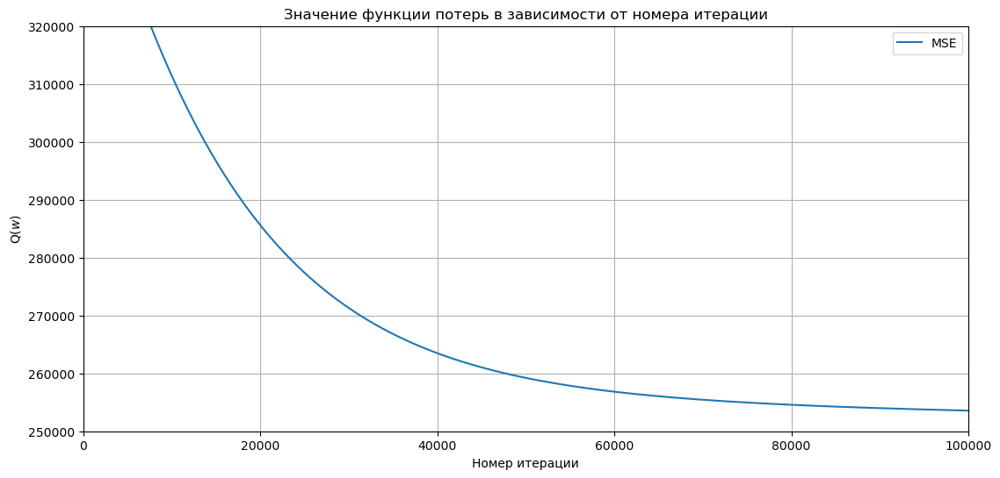

In [641]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((250000, 320000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

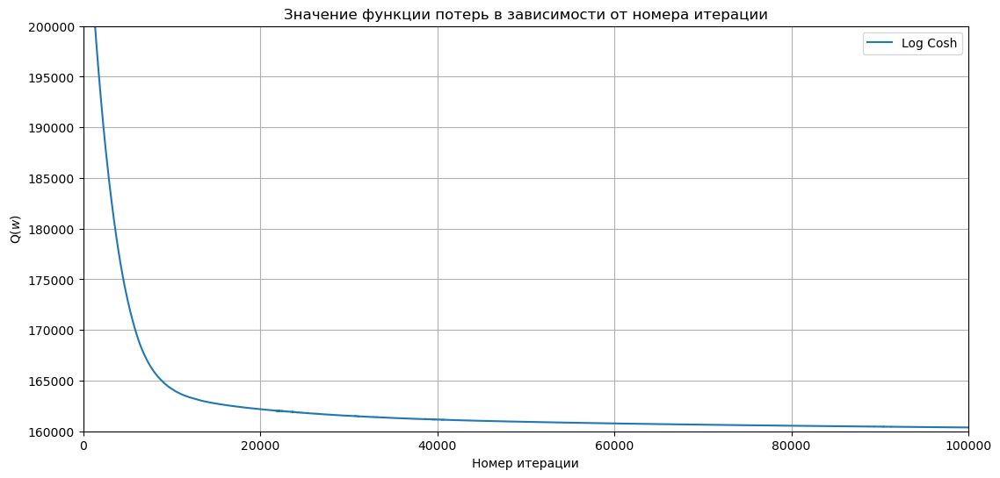

In [642]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((160000, 200000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [643]:
num_steps = 100000
errors_mse = np.array(lr_mse.deviation_list)[:num_steps]
errors_huber = np.array(lr_hub.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos.deviation_list)[:num_steps]

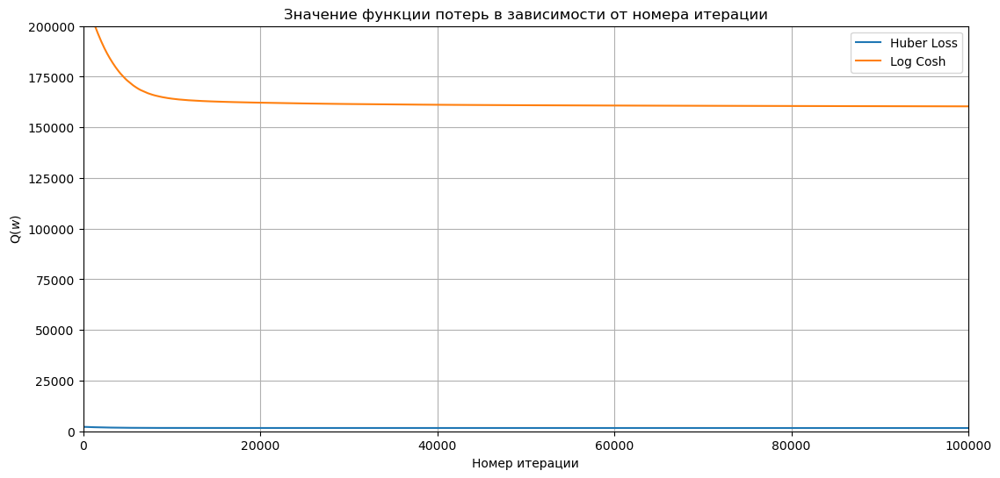

In [644]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 200000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [645]:
num_steps = 100000
errors_mse = np.array(lr_mse.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos.deviation_list)[:num_steps]

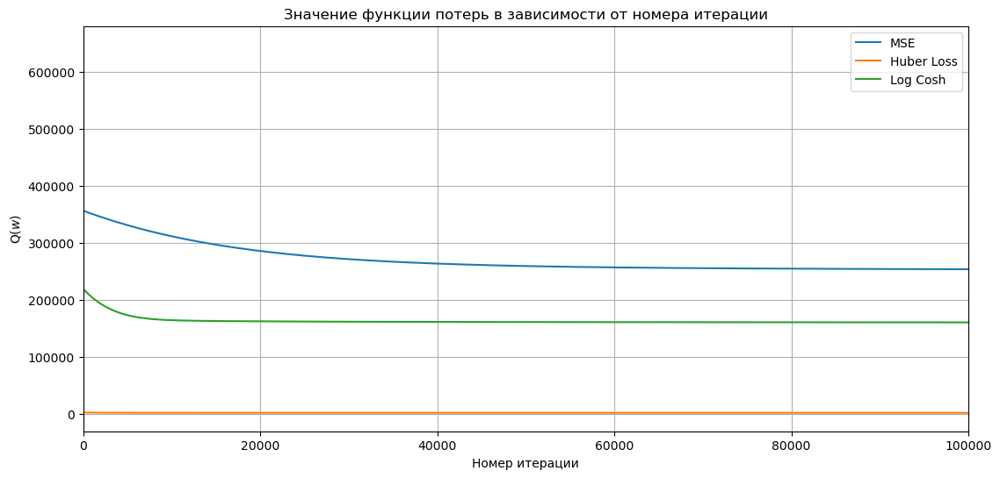

In [646]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [729]:
num_steps = 100000
errors_mse = np.array(lr_mse.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos.rmse_list)[:num_steps]

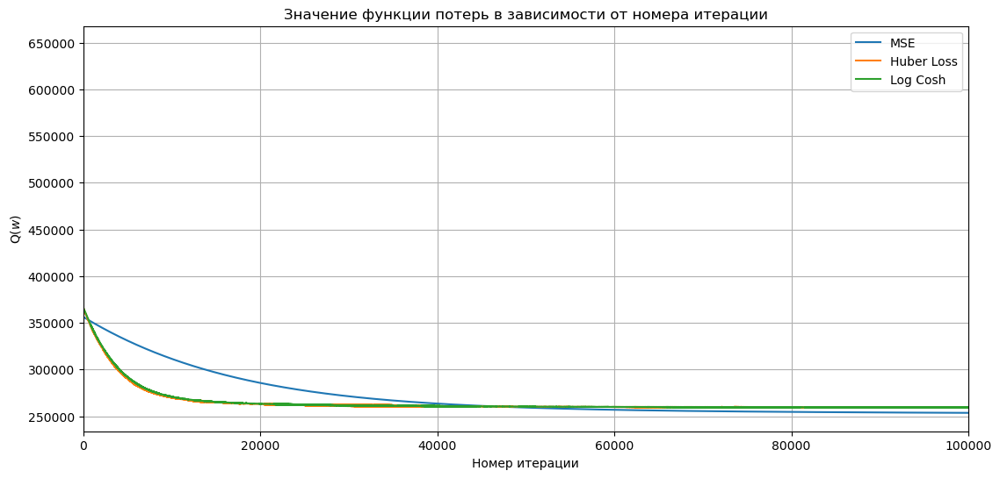

In [730]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

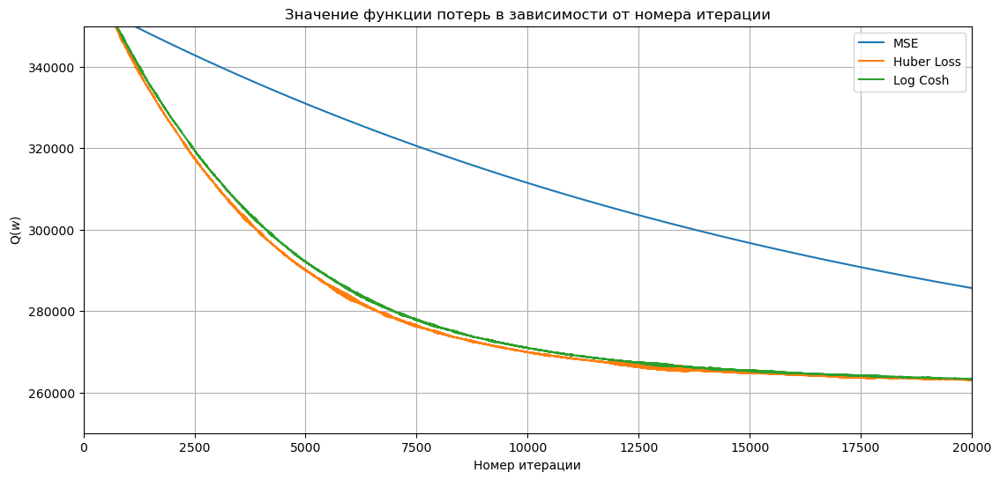

In [735]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 20000))
plt.ylim((250000, 350000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [254]:
num_steps = 200
grad_mse = np.array(lr_mse.grad_list)[:num_steps]
grad_hub = np.array(lr_hub.grad_list)[:num_steps]
grad_cos = np.array(lr_cos.grad_list)[:num_steps]

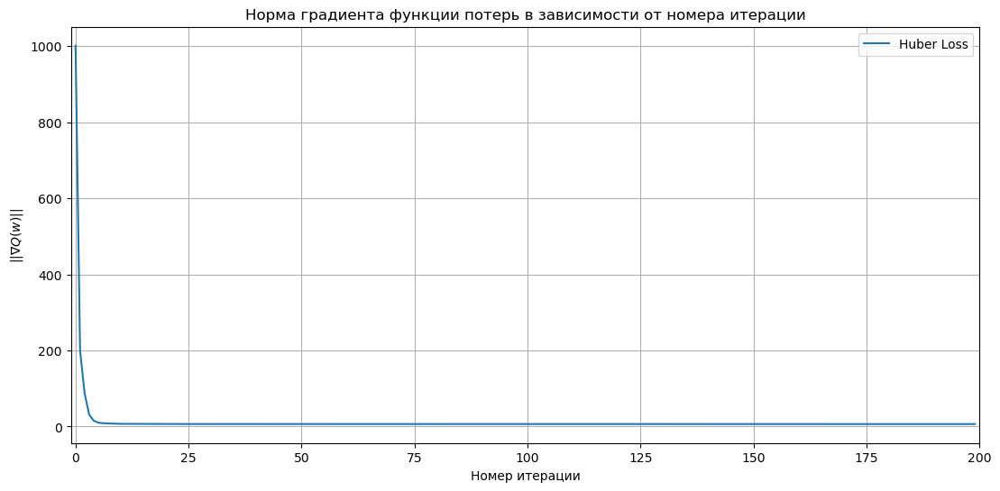

In [255]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

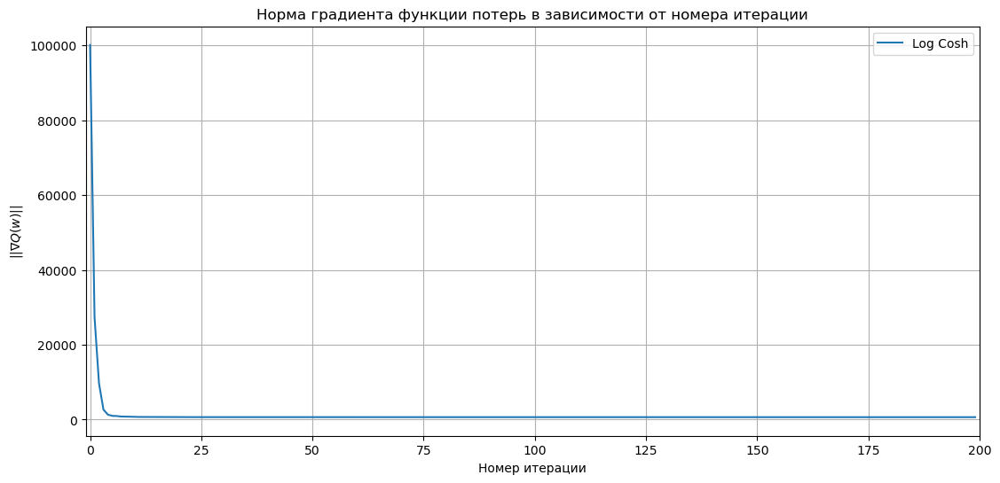

In [256]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

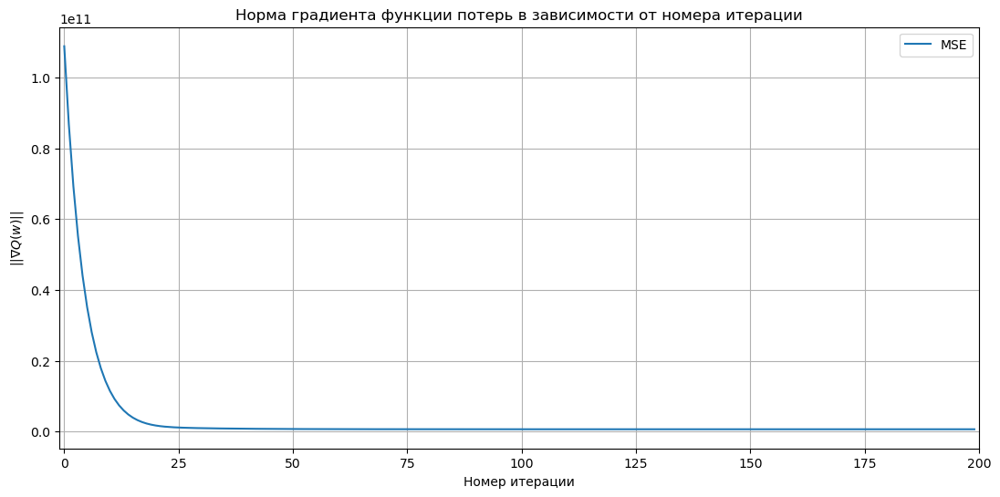

In [257]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [258]:
num_steps = 100000
grad_mse = np.array(lr_mse.grad_list)[:num_steps]
grad_hub = np.array(lr_hub.grad_list)[:num_steps]
grad_cos = np.array(lr_cos.grad_list)[:num_steps]

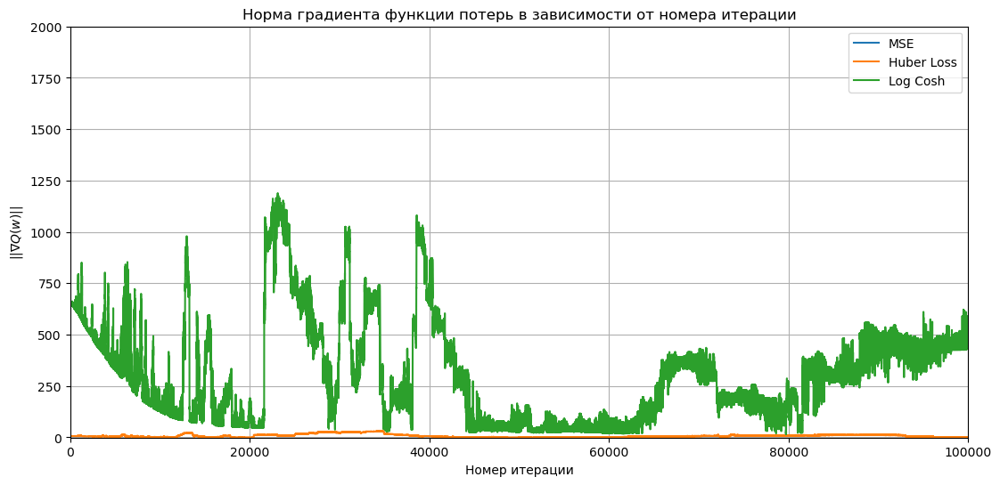

In [259]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

скачки возникают из-за выбросов, т.к модель переобучается и подгоняется под них
Huber Loss более устойчива к выбросам(не d ), log-cosh менее устойчива, но дважды d 
При уменьшении кол-ва шагов в GD, ошибка возрастает, т.к данные с большим кол-вом выбросов, следовательно нужно двигаться с очень маленьким шагом, а для этого нужно сильно больше операций 

### Проверил для 60к шагов

In [281]:
lr_cos_t = LinearRegressionStats(LogCosh(), lr=3.79e-05, method='GD', n_iterations=60000)
lr_cos_t.fit(X_train, y_train)
np.array(lr_cos_t.w)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


array([ 8.58651260e-02,  1.09005321e+02,  1.25395698e-01,  1.48985903e-02,
        2.66320712e-01,  1.42106014e-01,  4.49573057e+01,  6.40479360e+01,
       -1.17340672e+01,  3.75539813e+01,  1.97415341e-01,  9.13298928e+01,
       -6.40904578e-01, -2.84115925e-01, -1.72554100e-01, -3.05650803e-01,
       -4.92929671e-02, -1.02712649e-01,  1.83180096e-02, -6.86210340e-01,
        2.04176484e-04,  3.39979774e+01, -1.64971145e-04])

In [284]:
print(f"Train: {mean_squared_error(y_train, lr_mse_t.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_t.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos_t.predict(X_train)), r2_score(y_test, lr_cos_t.predict(X_test)))

Train: 256838.516417429
Test: 278586.99817207834
0.4732668320414304 0.46605766547078087


Результат незначительно хуже, чем при 100к итерациях, можно принять их равными

In [367]:
num_steps = 10000
grad_mse = np.array(lr_mse.grad_list)[:num_steps]
grad_hub = np.array(lr_hub.grad_list)[:num_steps]
grad_cos = np.array(lr_cos.grad_list)[:num_steps]

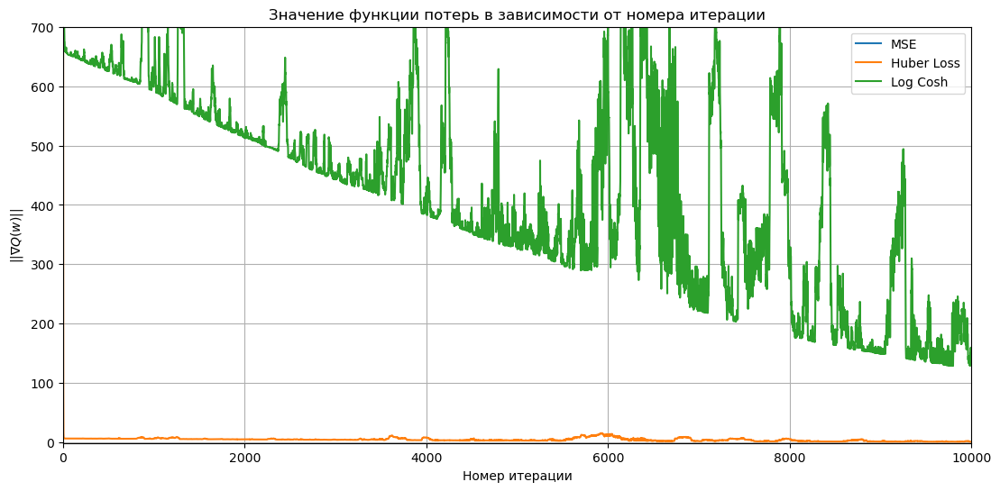

In [368]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 700))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [262]:
num_steps = 200
grad_mse = np.array(lr_mse.grad_list)[:num_steps]
grad_hub = np.array(lr_hub.grad_list)[:num_steps]
grad_cos = np.array(lr_cos.grad_list)[:num_steps]

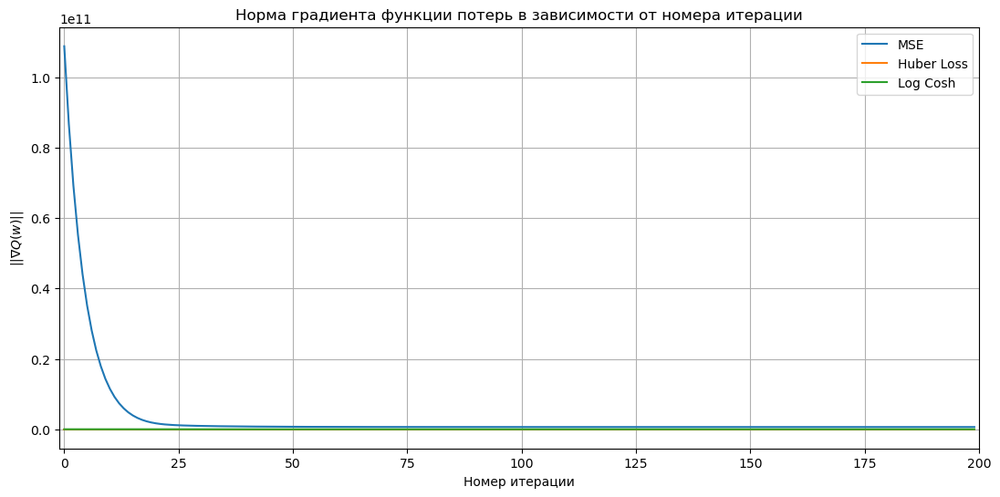

In [263]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

## SGD

In [707]:
lr_mse_sgd = LinearRegressionStats(MSELoss(), lr=1e-10, method='SGD', batch_size=64, n_iterations=500000)
lr_mse_sgd.fit(X_train, y_train)
print(lr_mse_sgd.iteration)
np.array(lr_mse_sgd.w)

500000


array([ 8.27839634e-02,  1.37616397e+02,  1.25287609e-01,  1.48901946e-02,
        1.50495737e-01,  4.54385021e-02,  8.54612777e+01,  5.21550398e+01,
       -2.98622709e+00,  2.59757493e+01, -6.93140561e-01,  8.32076747e+01,
       -8.36779149e-01, -5.97281492e-02, -5.26010985e-02, -4.76759662e-02,
       -1.42167000e-02, -4.64768483e-03,  3.96658482e-03,  1.02895697e-01,
        4.60508204e-04,  1.53437855e+01, -4.72510152e-05])

In [715]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sgd.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sgd.predict(X_test))**0.5}")
print(r2_score(y_train, lr_mse_sgd.predict(X_train)), r2_score(y_test, lr_mse_sgd.predict(X_test)))

Train: 253237.71637050982
Test: 272808.6721788525
0.5000855994691741 0.5036107577707174


In [708]:
lr_cos_sgd = LinearRegressionStats(LogCosh(), lr=7e-5, method='SGD', batch_size=64, n_iterations=500000)
lr_cos_sgd.fit(X_train, y_train)
np.array(lr_cos_sgd.w)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


array([ 7.24265195e-02,  1.03250889e+02,  9.22523907e-02,  5.17588315e-03,
        9.87605194e-02,  4.30168942e-02,  6.18096971e+01,  4.14411120e+01,
       -3.30646983e+00,  1.73774514e+01,  1.97069824e-01,  7.83019131e+01,
       -5.36804875e-01, -7.41618215e-02, -5.79295804e-02, -9.49993151e-02,
       -2.74090615e-02,  1.89365070e-02,  5.46574022e-03,  4.06048386e-02,
        2.91961029e-04,  1.49266031e+01, -5.32471076e-05])

In [716]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sgd.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sgd.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos_sgd.predict(X_train)), r2_score(y_test, lr_cos_sgd.predict(X_test)))

Train: 263106.32813565596
Test: 286594.3355762132
0.46036332513655265 0.4521757885088309


In [709]:
lr_hub_sgd = LinearRegressionStats(HuberLoss(0.01), lr=0.05, method='SGD', batch_size=64, n_iterations=500000)
lr_hub_sgd.fit(X_train, y_train)
np.array(lr_hub_sgd.w)

array([ 1.04725749e-01,  1.07037507e+02,  3.15306260e-01,  3.52838591e-02,
        5.95601732e-01,  3.44214800e-01,  3.77277376e+01,  6.93096900e+01,
       -2.86260021e+01,  5.18187124e+01,  2.50317936e-01,  9.84647007e+01,
       -5.29385438e-01, -7.15508353e-01, -4.48685630e-01, -6.46646893e-01,
       -1.11913859e-01, -3.13095543e-01,  4.71716185e-02, -2.28361205e+00,
       -7.74111269e-05,  7.37170677e+01, -3.99494535e-04])

In [717]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sgd.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sgd.predict(X_test))**0.5}")
print(r2_score(y_train, lr_hub_sgd.predict(X_train)), r2_score(y_test, lr_hub_sgd.predict(X_test)))

Train: 261959.17445711966
Test: 284589.4470778258
0.465058739864457 0.45981365583111855


#### Результаты примерно равны стандартному GD

### Оценка SGD

### Функционал потерь от величины ошибки

In [769]:
errors_mse = np.array(lr_mse_sgd.deviation_list)[1::50] ** 0.5
errors_huber = np.array(lr_hub_sgd.deviation_list)[1::50]  
errors_logcosh = np.array(lr_cos_sgd.deviation_list)[1::50]

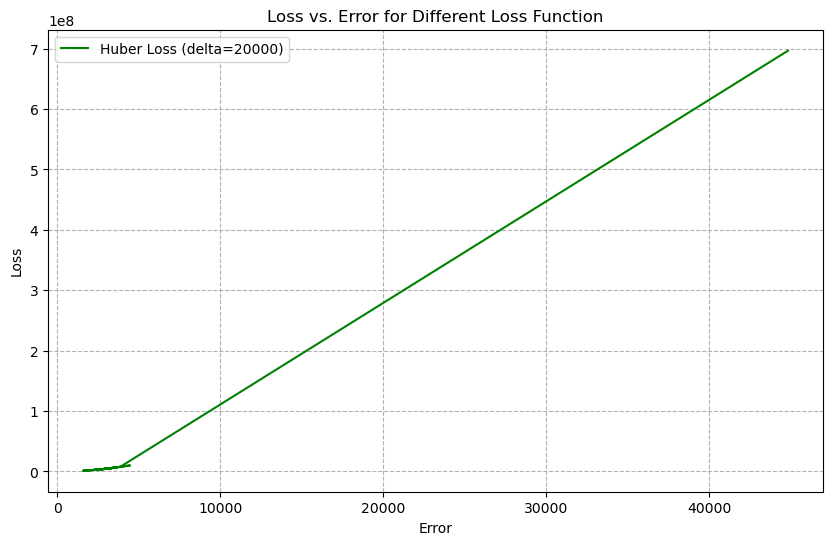

In [489]:
delta = 20000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

plt.figure(figsize=(10, 6))
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

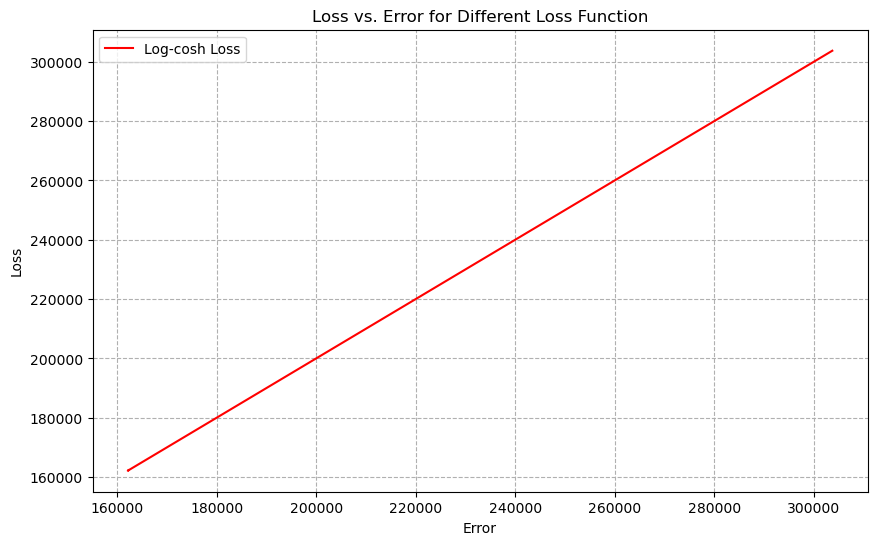

In [485]:
logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

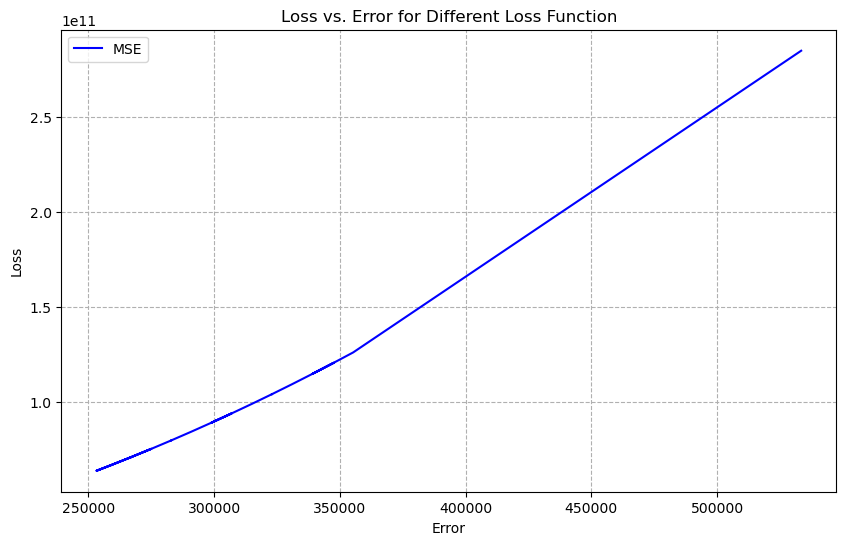

In [486]:
mse_loss = errors_mse ** 2

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

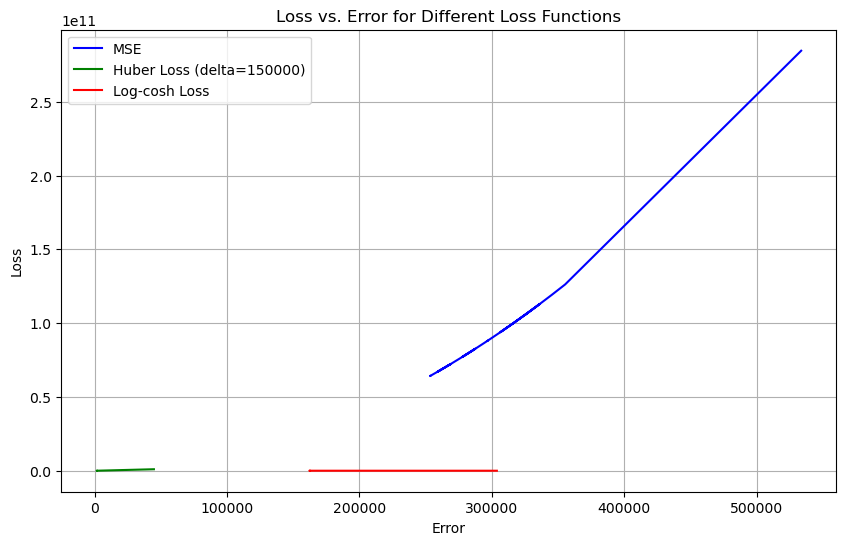

In [771]:
mse_loss = errors_mse ** 2

delta = 150000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

In [772]:
errors_mse = np.array(lr_mse_sgd.rmse_list)[1::50]
errors_huber = np.array(lr_hub_sgd.rmse_list)[1::50]  
errors_logcosh = np.array(lr_cos_sgd.rmse_list)[1::50]

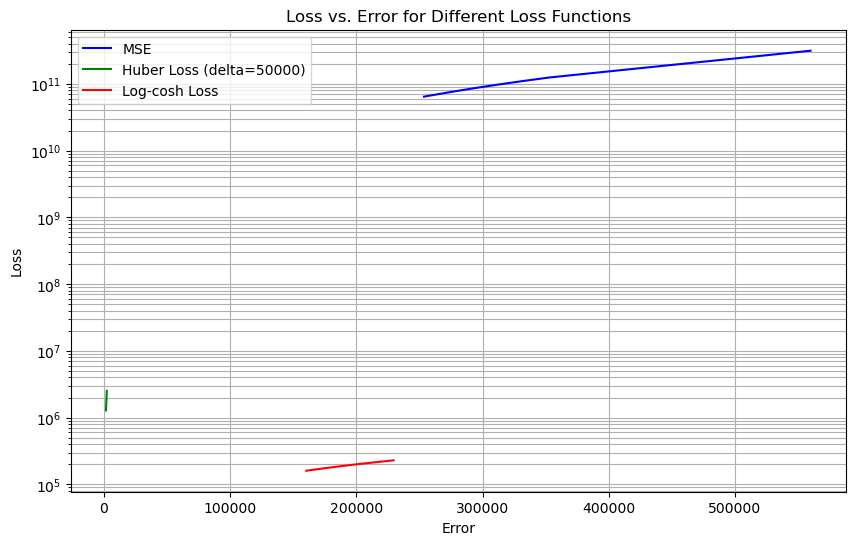

In [824]:
mse_loss = errors_mse ** 2

delta = 50000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

### Функции потерь от итерации

In [624]:
num_steps = 200
errors_mse = np.array(lr_mse_sgd.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sgd.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd.deviation_list)[:num_steps]

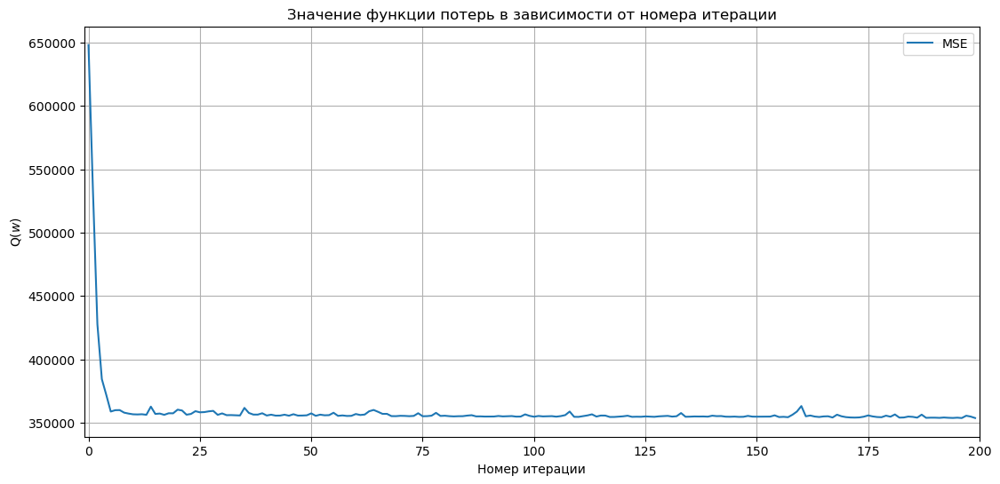

In [625]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

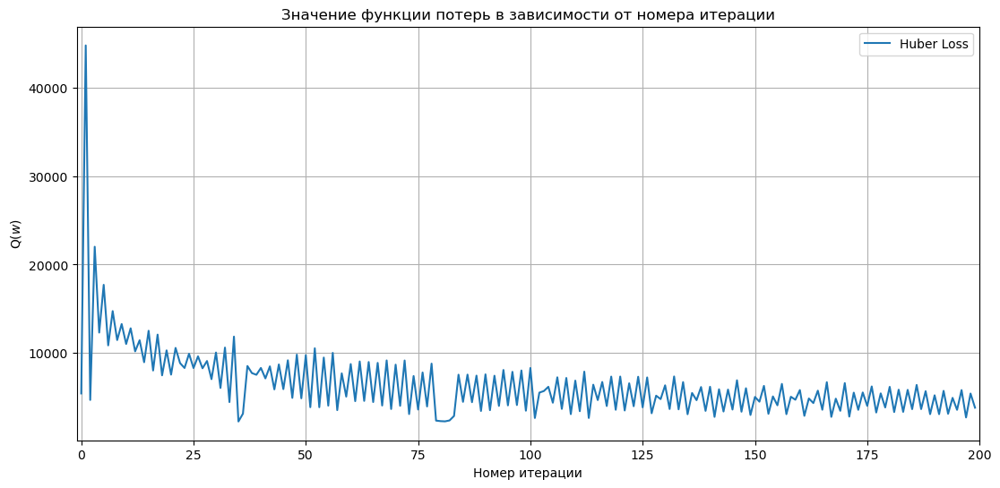

In [626]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber, label="Huber Loss")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

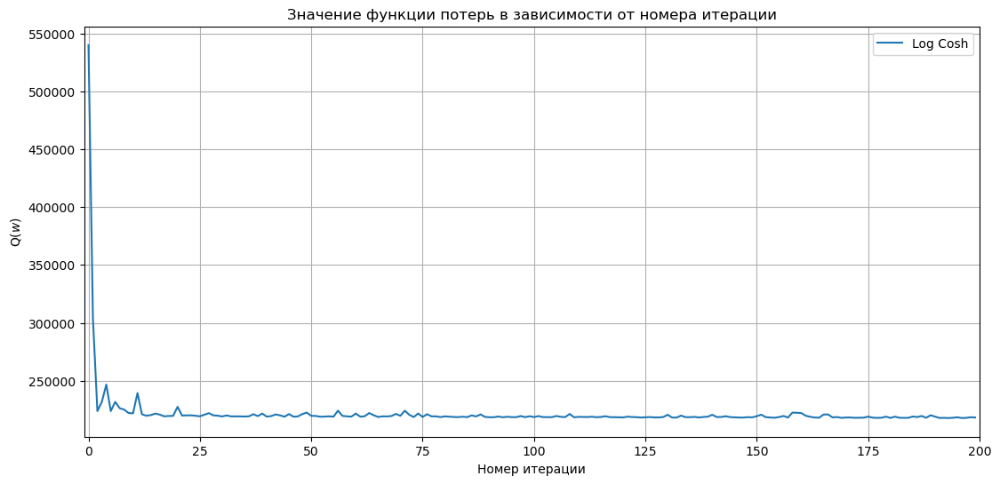

In [627]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [628]:
num_steps = 500000
errors_mse = np.array(lr_mse_sgd.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sgd.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd.deviation_list)[:num_steps]

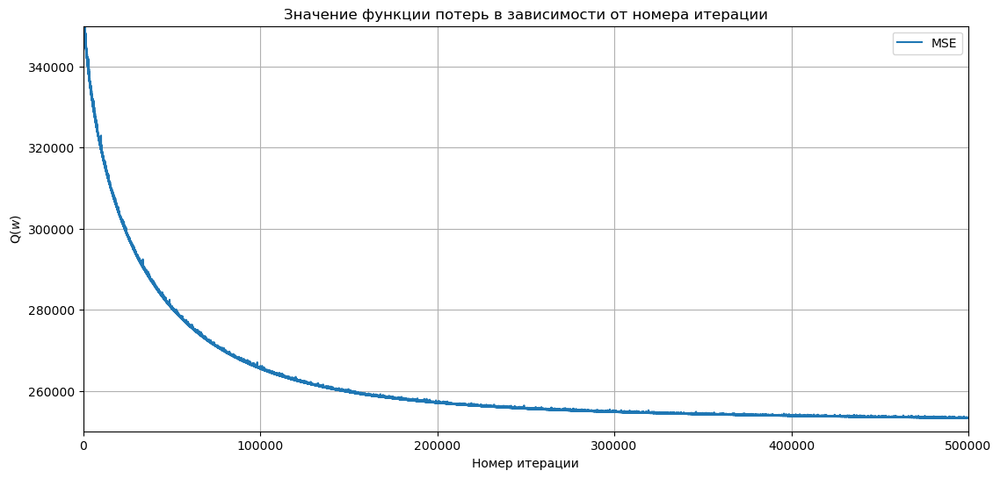

In [629]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((250000, 350000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

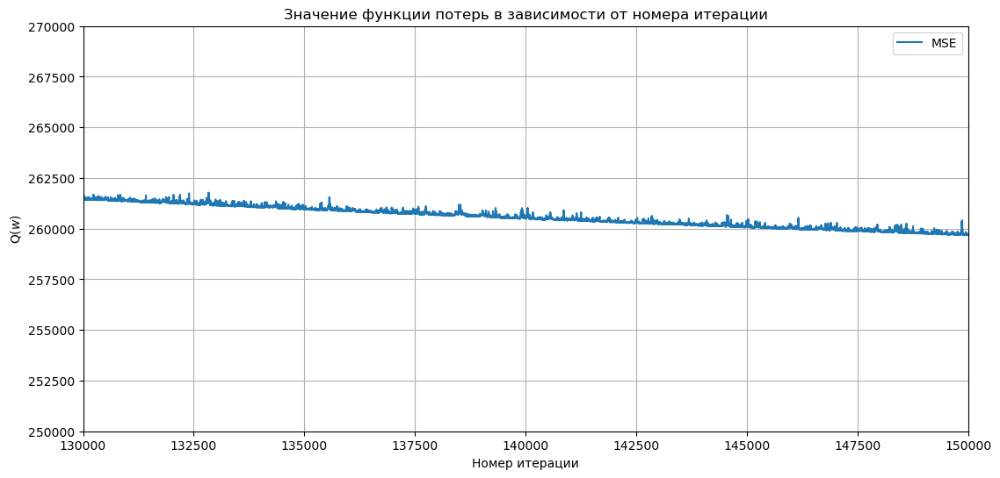

In [630]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((130000, 150000))
plt.ylim((250000, 270000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

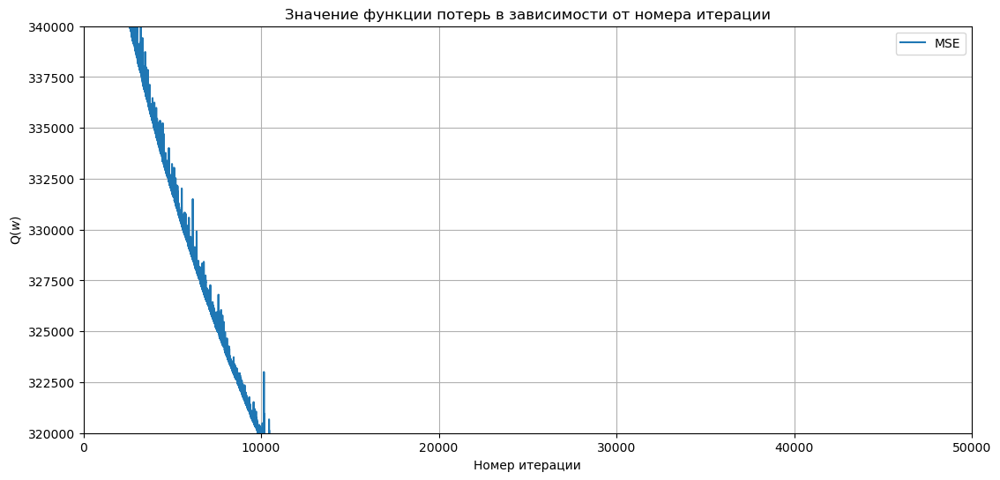

In [631]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 50000))
plt.ylim((320000, 340000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

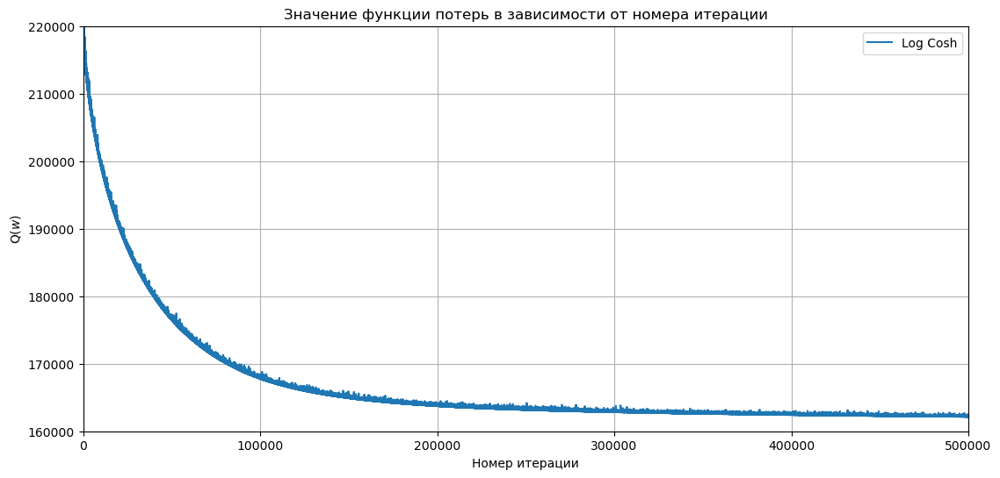

In [632]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((160000, 220000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

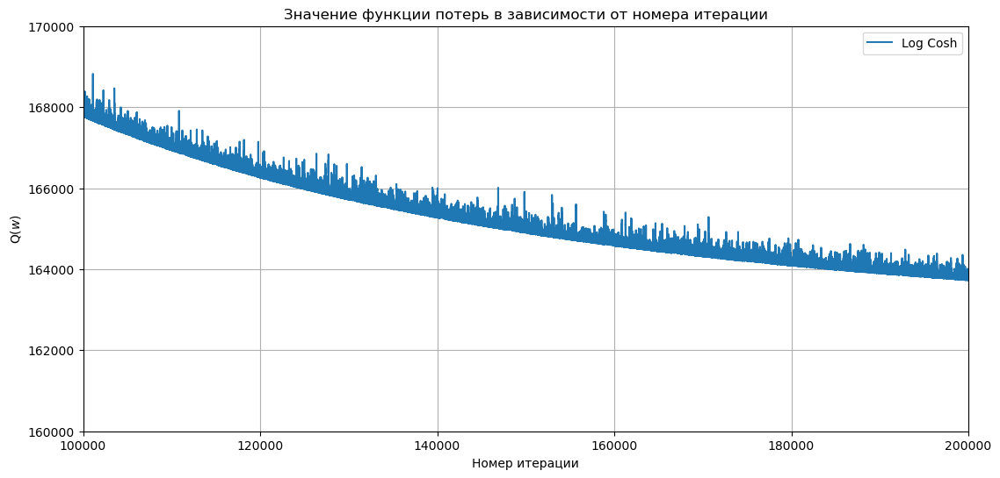

In [633]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((100000, 200000))
plt.ylim((160000, 170000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

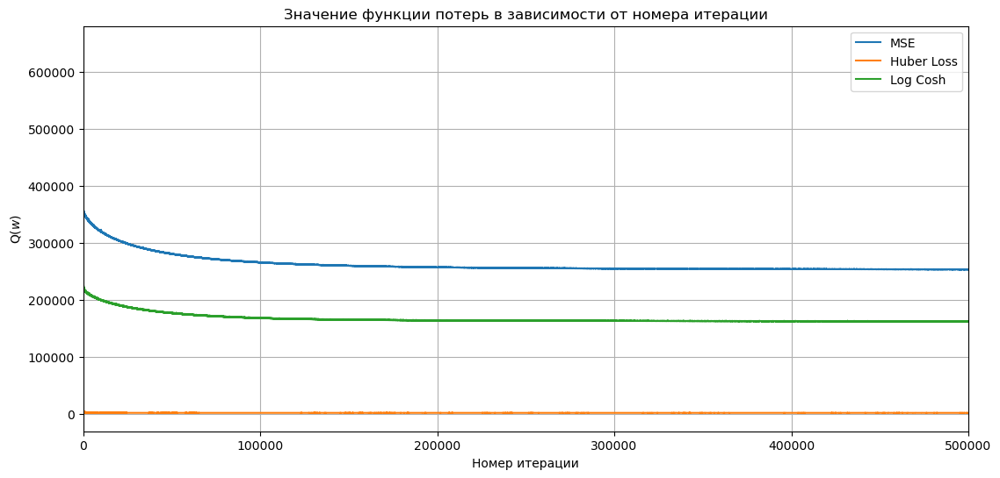

In [634]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [774]:
num_steps = 500000
errors_mse = np.array(lr_mse_sgd.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_sgd.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd.rmse_list)[:num_steps]

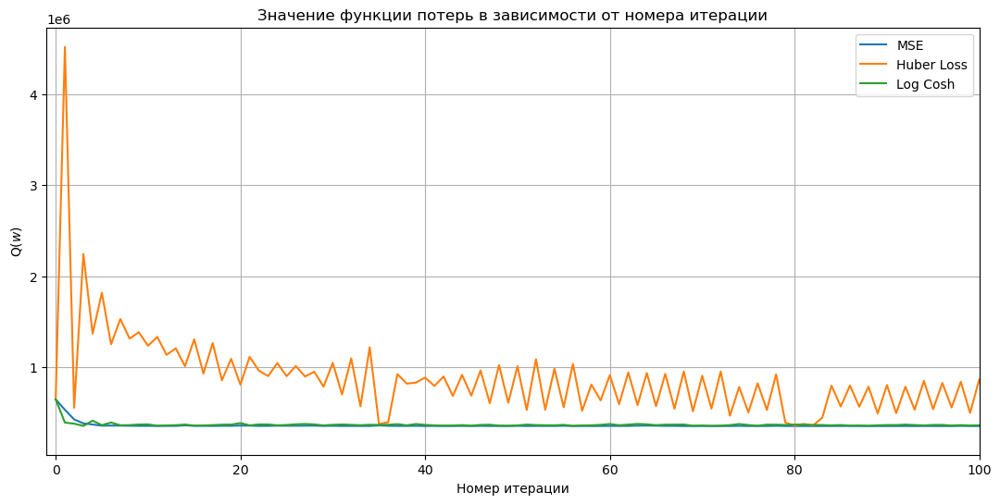

In [776]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 100))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

При больших значениях ведет себя как MAE -> град зависит только от знака -> большие перепады

### Норма градиента функции потерь в зависимости от номера итерации

In [540]:
num_steps = 200
grad_mse = np.array(lr_mse_sgd.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sgd.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sgd.grad_list)[:num_steps]

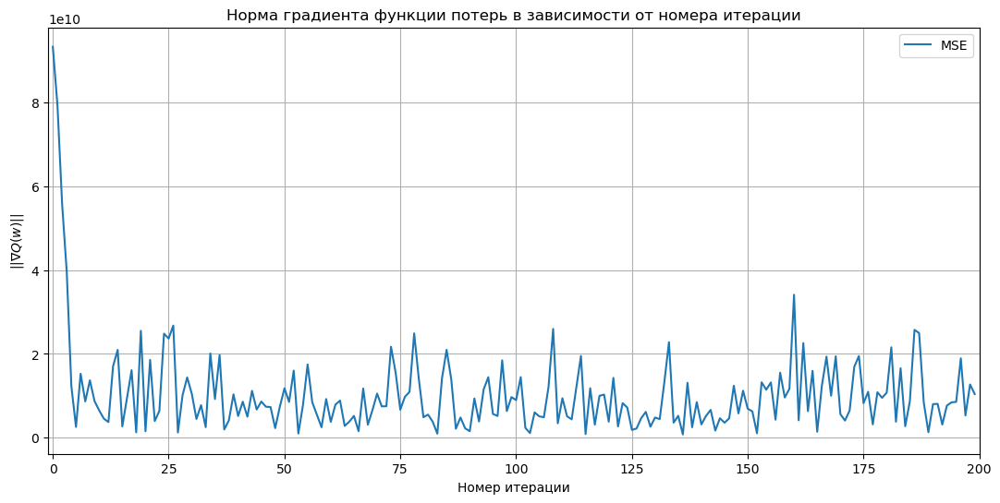

In [541]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

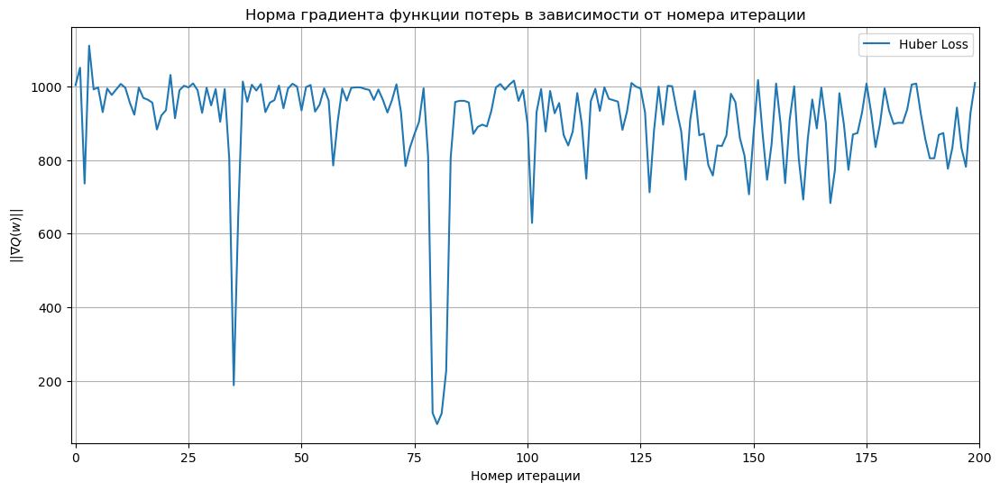

In [542]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

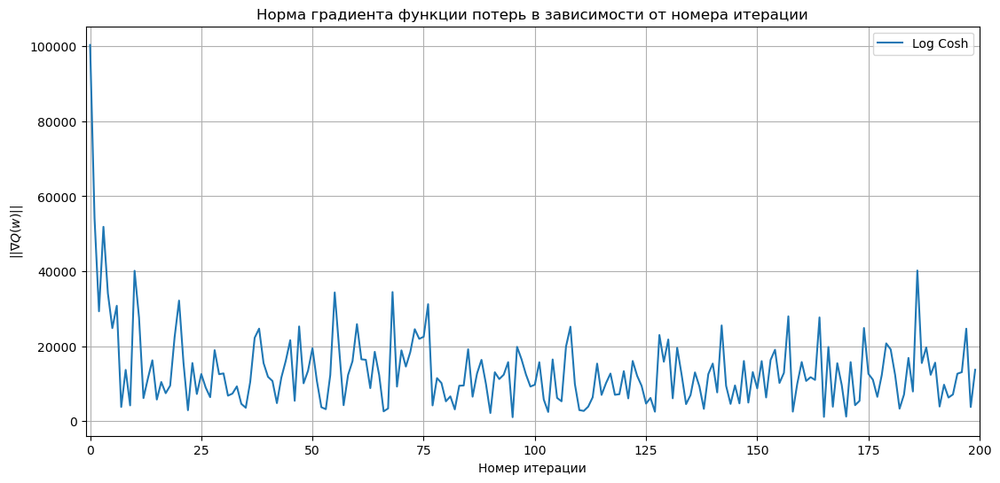

In [543]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [544]:
num_steps = 500000
grad_mse = np.array(lr_mse_sgd.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sgd.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sgd.grad_list)[:num_steps]

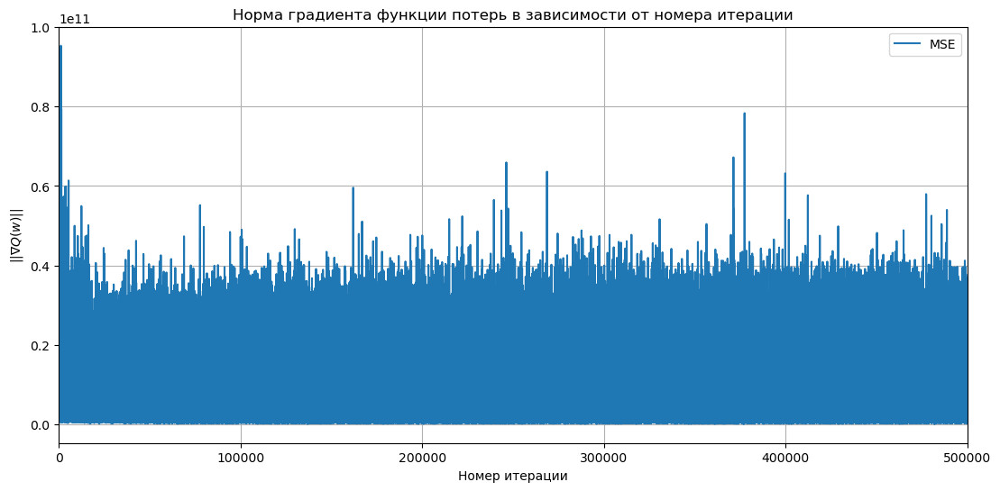

In [547]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

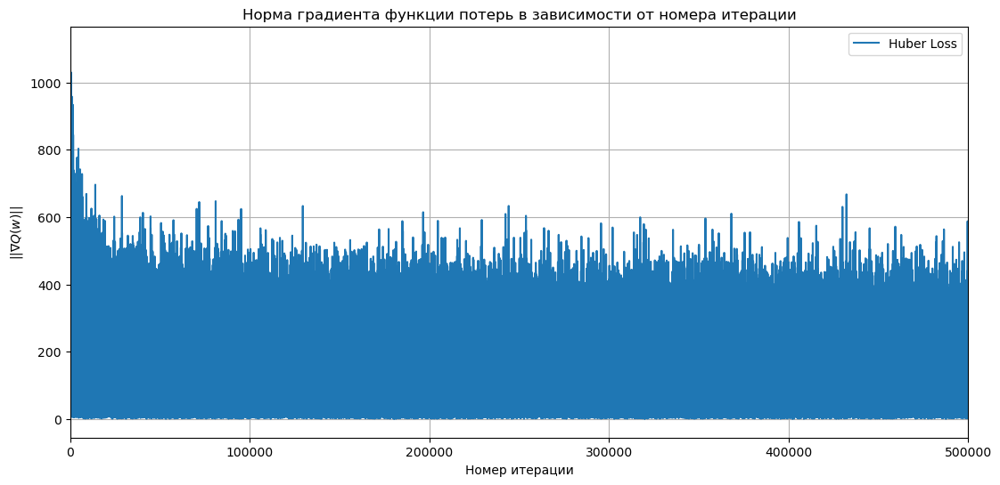

In [548]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

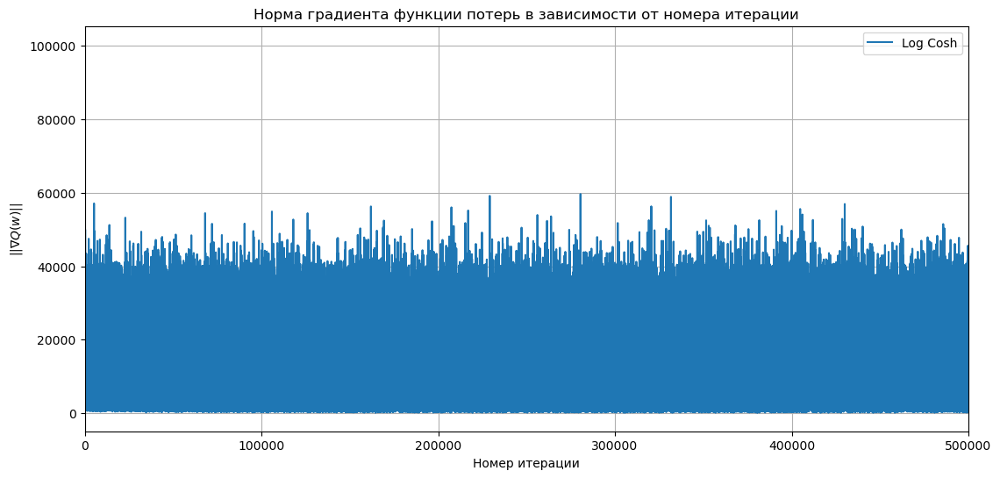

In [549]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

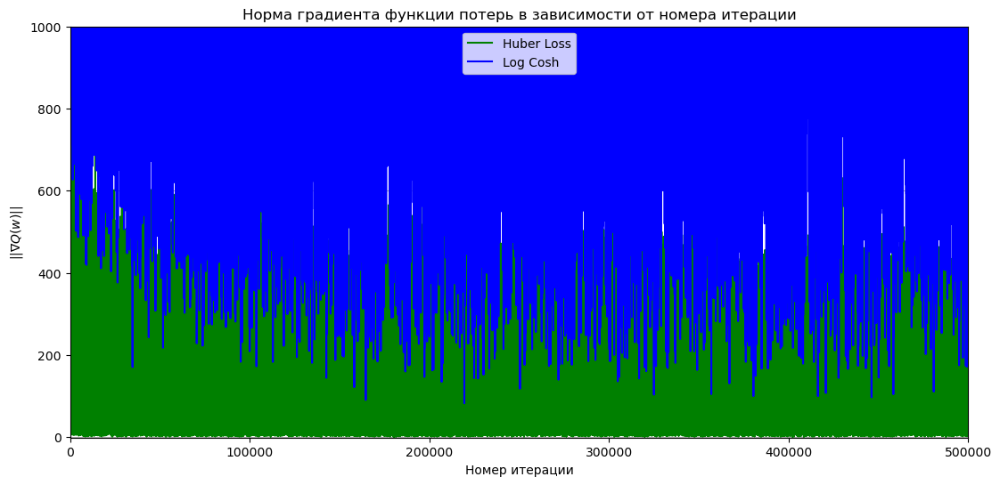

In [555]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss", color='green')
plt.plot(range(num_steps), grad_cos, label="Log Cosh", color='blue')

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 1000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

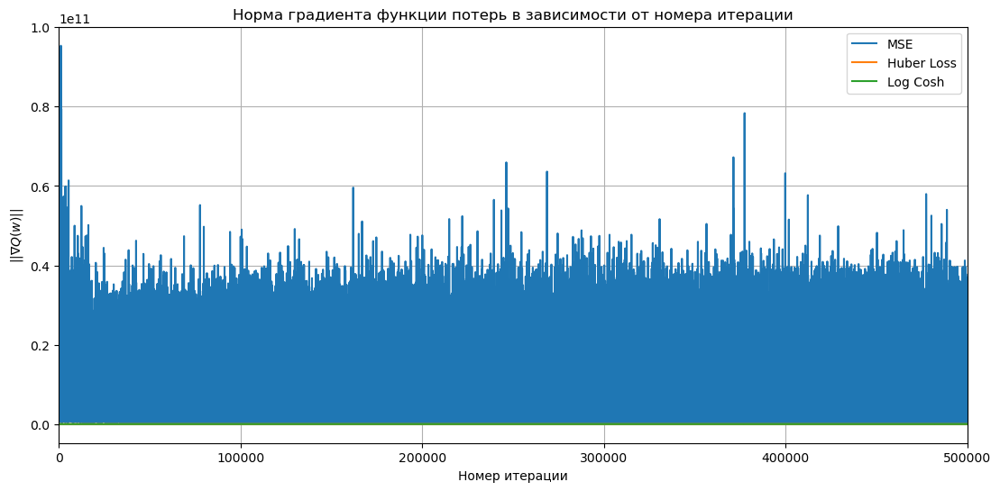

In [546]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

## SAG

In [710]:
lr_mse_sag = LinearRegressionStats(MSELoss(), lr=1e-11, method='SAG', n_iterations=500000)
lr_mse_sag.fit(X_train, y_train)
print(lr_mse_sag.iteration)
np.array(lr_mse_sag.w)

500000


array([ 7.82006681e-02,  1.53846882e+02,  1.39851219e-01,  6.16897743e-02,
        5.42026566e-01,  2.16501418e-01,  6.40055549e+01,  8.98412474e+01,
       -1.68160967e+01,  6.49786417e+01, -6.53514633e-01,  8.73524283e+01,
       -8.43502454e-01, -2.99276833e-01, -2.46199797e-01, -1.87643742e-01,
        1.41225746e-02, -3.60489147e-01,  1.89968234e-02, -1.06891171e+00,
        1.22177847e-04,  4.24991083e+01, -1.83910138e-04])

In [903]:
lr_mse_sag_t = LinearRegressionStats(MSELoss(), lr=1e-11, method='SAG', n_iterations=100000)
lr_mse_sag_t.fit(X_train, y_train)

In [904]:
print(r2_score(y_train, lr_mse_sag_t.predict(X_train)), r2_score(y_test, lr_mse_sag_t.predict(X_test)))

0.4987788032674282 0.5015775687754409


При уменьшении кол-ва итераций результат на тесте стал чуть хуже:)

In [719]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sag.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sag.predict(X_test))**0.5}")
print(r2_score(y_train, lr_mse_sag.predict(X_train)), r2_score(y_test, lr_mse_sag.predict(X_test)))

Train: 250287.48104303202
Test: 268485.9802016424
0.5116658175380182 0.5192168454995707


In [711]:
lr_cos_sag = LinearRegressionStats(LogCosh(), lr=20e-6, method='SAG', n_iterations=500000)
lr_cos_sag.fit(X_train, y_train)
np.array(lr_cos_sag.w)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


array([ 1.41349260e-01,  1.05329321e+02,  1.44391702e-01,  6.35527697e-02,
        1.06185055e+00,  6.36024871e-01,  3.66757048e+01,  6.86535367e+01,
       -5.20022887e+01,  5.36284894e+01,  9.16188293e-01,  9.84848496e+01,
       -6.43649906e-01, -1.30488467e+00, -8.03965405e-01, -1.32313740e+00,
       -2.18231794e-01, -5.53850098e-01,  8.87297018e-02, -4.50510419e+00,
       -5.19830194e-04,  1.30271480e+02, -7.17903969e-04])

In [908]:
lr_cos_sag_t = LinearRegressionStats(LogCosh(), lr=20e-6, method='SAG', n_iterations=100000)
lr_cos_sag_t.fit(X_train, y_train)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


In [909]:
print(r2_score(y_train, lr_cos_sag_t.predict(X_train)), r2_score(y_test, lr_cos_sag_t.predict(X_test)))

0.4723852207144613 0.46508786349935394


In [907]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sag.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sag.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos_sag.predict(X_train)), r2_score(y_test, lr_cos_sag.predict(X_test)))

Train: 257967.31571040506
Test: 280788.15166718676
0.48123790026525026 0.47414794745153344


In [712]:
lr_hub_sag = LinearRegressionStats(HuberLoss(0.01), lr=0.001, method='SAG', n_iterations=500000)
lr_hub_sag.fit(X_train, y_train)
np.array(lr_hub_sag.w)

array([ 1.05490089e-01,  1.07069038e+02,  1.34566900e-01,  3.21565342e-02,
        5.51051847e-01,  3.15905353e-01,  3.89633637e+01,  6.81055945e+01,
       -2.61259049e+01,  5.10102479e+01,  4.20391007e-01,  9.81647390e+01,
       -6.28007743e-01, -6.49067204e-01, -3.95138332e-01, -6.79710545e-01,
       -1.07812197e-01, -2.66282967e-01,  4.30750776e-02, -2.05476377e+00,
       -4.20687242e-05,  6.84557692e+01, -3.62023120e-04])

In [910]:
lr_hub_sag_t = LinearRegressionStats(HuberLoss(0.01), lr=0.003, method='SAG', n_iterations=100000)
lr_hub_sag_t.fit(X_train, y_train)

In [911]:
print(r2_score(y_train, lr_hub_sag_t.predict(X_train)), r2_score(y_test, lr_hub_sag_t.predict(X_test)))

0.47471444733586265 0.4675840696422644


In [721]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sag.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sag.predict(X_test))**0.5}")
print(r2_score(y_train, lr_hub_sag.predict(X_train)), r2_score(y_test, lr_hub_sag.predict(X_test)))

Train: 259011.36048605083
Test: 281925.4648524969
0.4770303372900623 0.4698794648479906


Результаты незначительно превосходят SGD и GD

### Оценка SAG

### Функционал потерь от величины ошибки

In [596]:
errors_mse = np.array(lr_mse_sag.deviation_list)[1::50] ** 0.5
errors_huber = np.array(lr_hub_sag.deviation_list)[1::50]  
errors_logcosh = np.array(lr_cos_sag.deviation_list)[1::50]

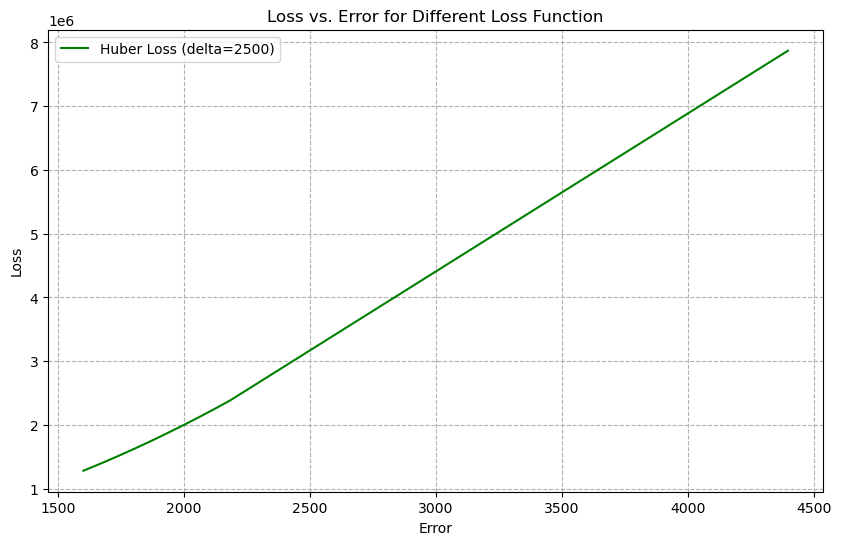

In [601]:
delta = 2500
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

plt.figure(figsize=(10, 6))
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

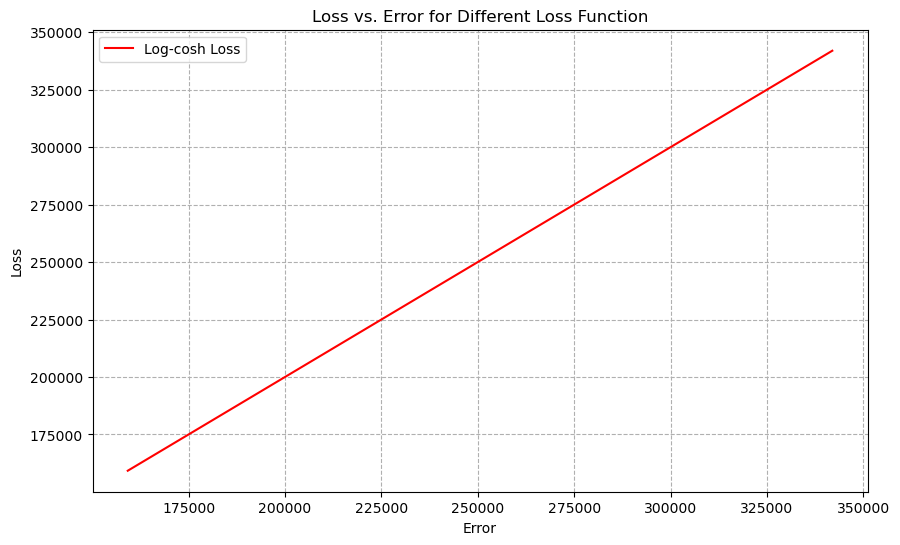

In [602]:
logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

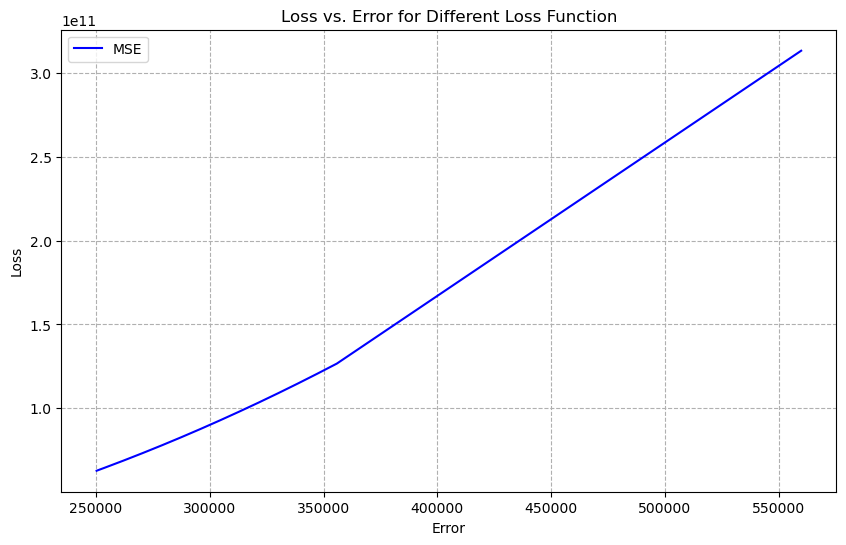

In [603]:
mse_loss = errors_mse ** 2

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Function")
plt.legend()
plt.grid(True, which="both", ls="--")
plt.show()

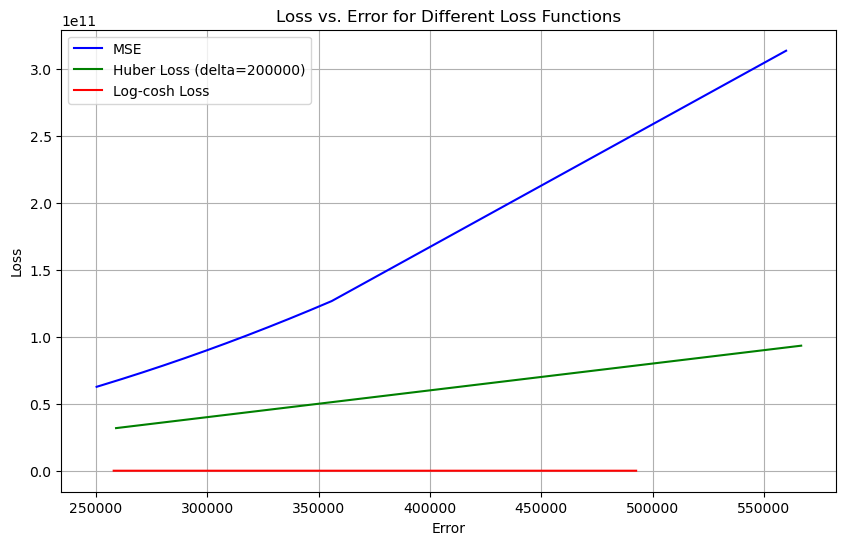

In [756]:
mse_loss = errors_mse ** 2

delta = 200000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

In [751]:
errors_mse = np.array(lr_mse_sag.rmse_list)[1::50]
errors_huber = np.array(lr_hub_sag.rmse_list)[1::50]  
errors_logcosh = np.array(lr_cos_sag.rmse_list)[1::50]

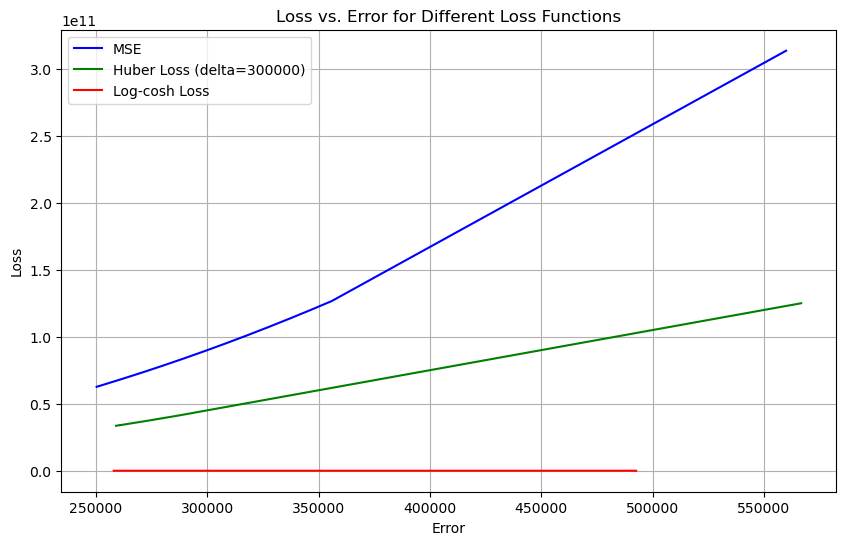

In [754]:
mse_loss = errors_mse ** 2

delta = 300000
huber_loss = np.where(np.abs(errors_huber) <= delta, 
                      0.5 * errors_huber ** 2, 
                      delta * (np.abs(errors_huber) - 0.5 * delta))

logcosh_loss = np.logaddexp(errors_logcosh, -errors_logcosh) - np.log(2)

plt.figure(figsize=(10, 6))
plt.plot(errors_mse, mse_loss, label='MSE', color='blue')
plt.plot(errors_huber, huber_loss, label=f'Huber Loss (delta={delta})', color='green')
plt.plot(errors_logcosh, logcosh_loss, label='Log-cosh Loss', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

### Функции потерь от итерации

In [620]:
num_steps = 200
errors_mse = np.array(lr_mse_sag.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sag.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag.deviation_list)[:num_steps]

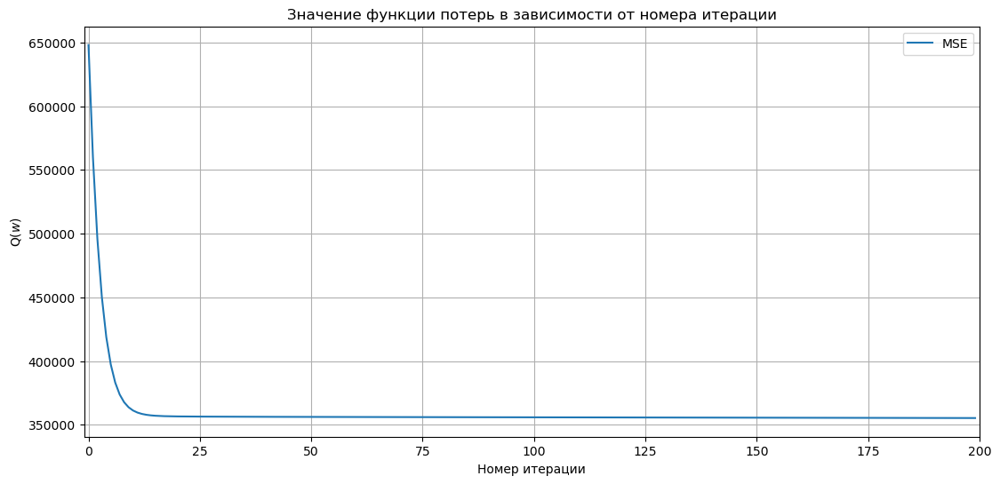

In [621]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

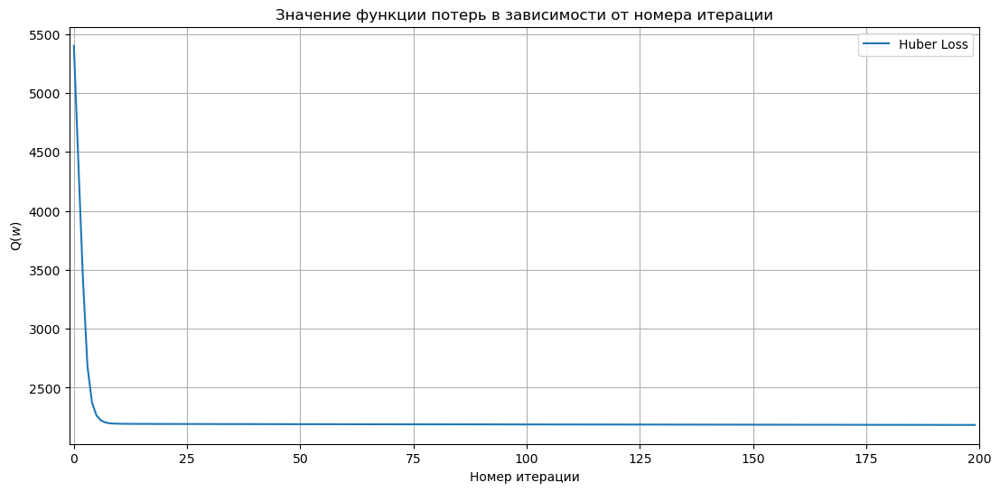

In [622]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber, label="Huber Loss")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

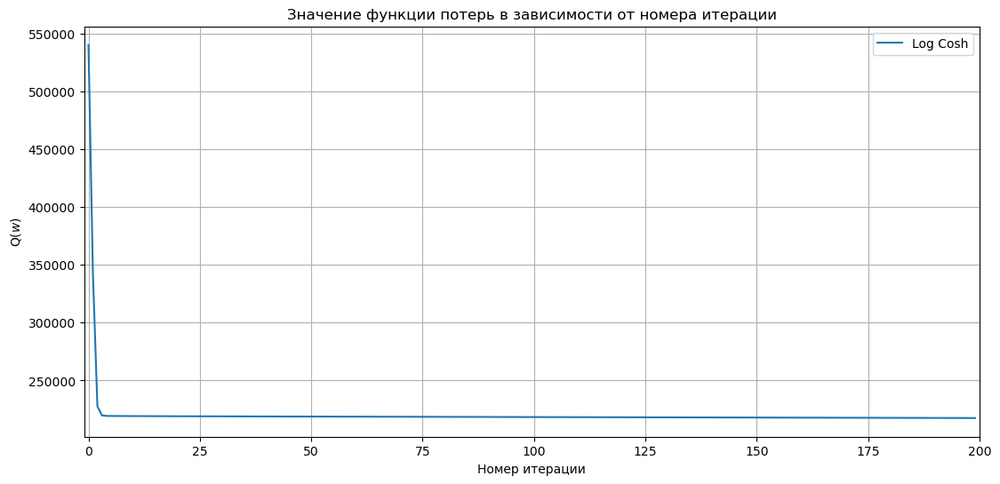

In [623]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [609]:
num_steps = 500000
errors_mse = np.array(lr_mse_sag.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sag.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag.deviation_list)[:num_steps]

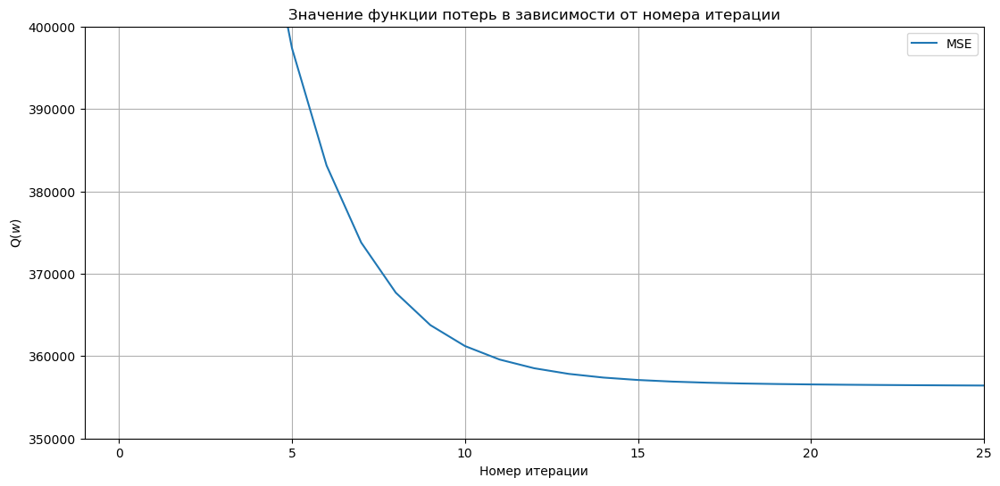

In [619]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 25))
plt.ylim((350000, 400000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

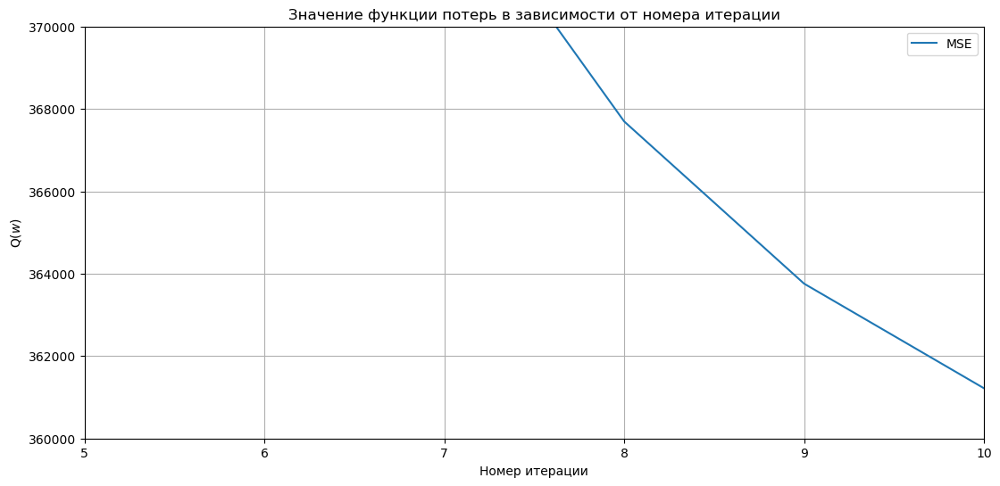

In [618]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((5, 10))
plt.ylim((360000, 370000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

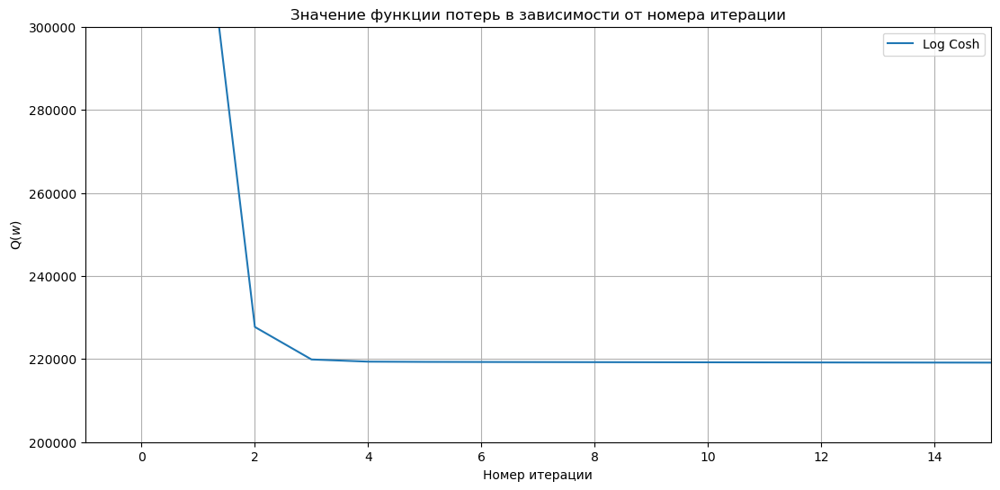

In [617]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 15))
plt.ylim((200000, 300000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

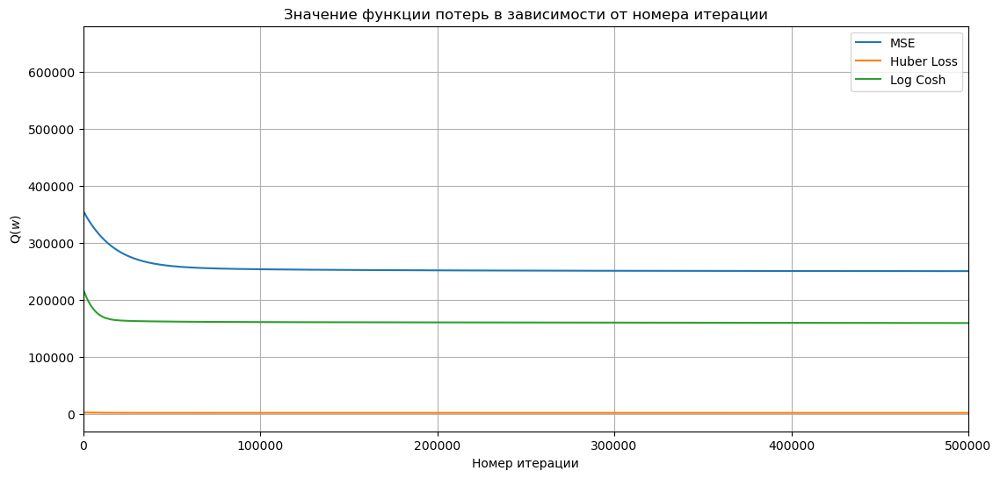

In [616]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [777]:
num_steps = 500000
errors_mse = np.array(lr_mse_sag.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_sag.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag.rmse_list)[:num_steps]

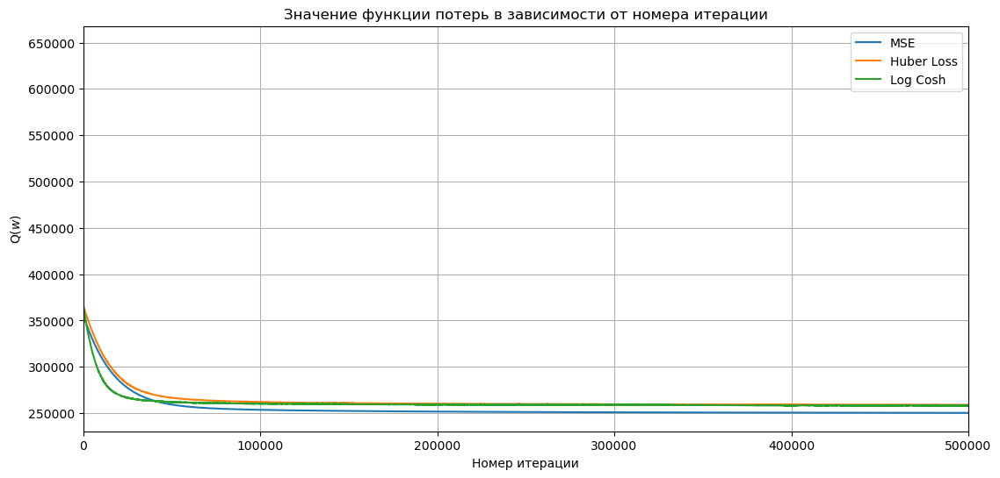

In [778]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [647]:
num_steps = 200
grad_mse = np.array(lr_mse_sag.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sag.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sag.grad_list)[:num_steps]

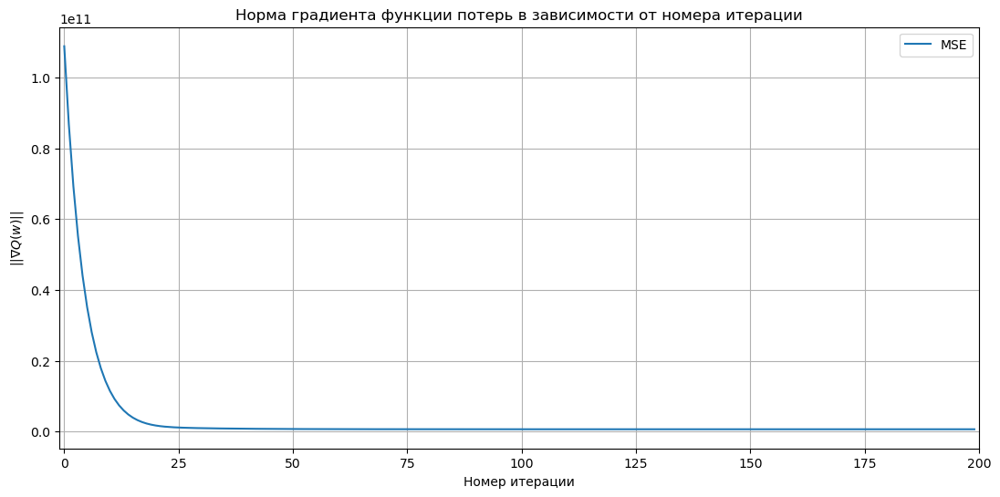

In [648]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

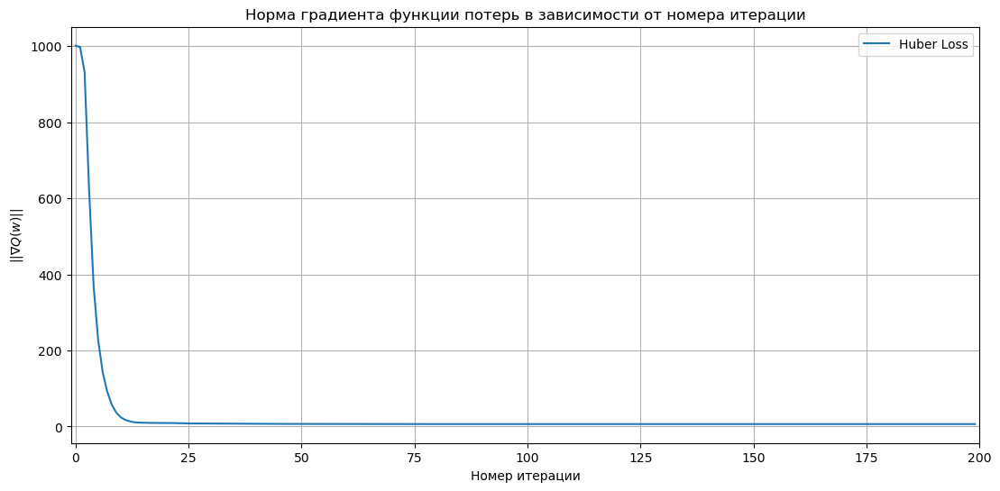

In [649]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

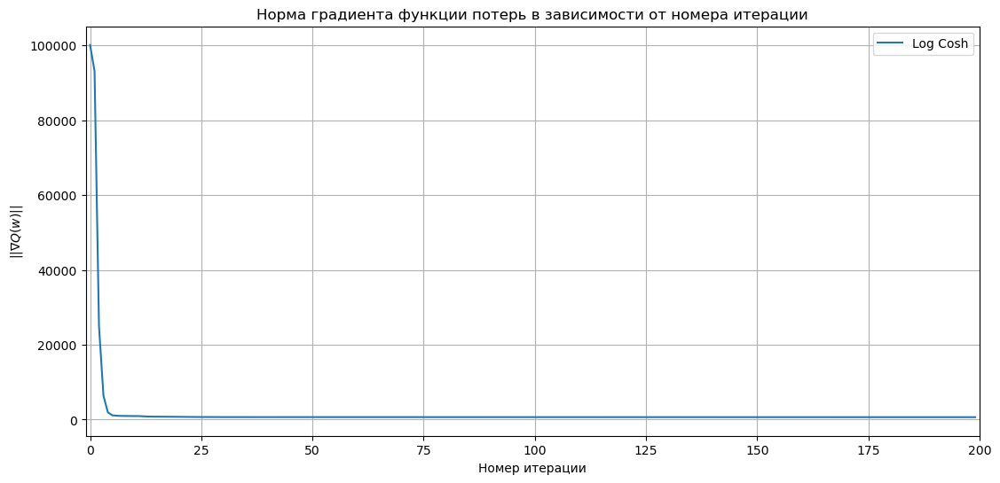

In [650]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [651]:
num_steps = 500000
grad_mse = np.array(lr_mse_sag.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sag.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sag.grad_list)[:num_steps]

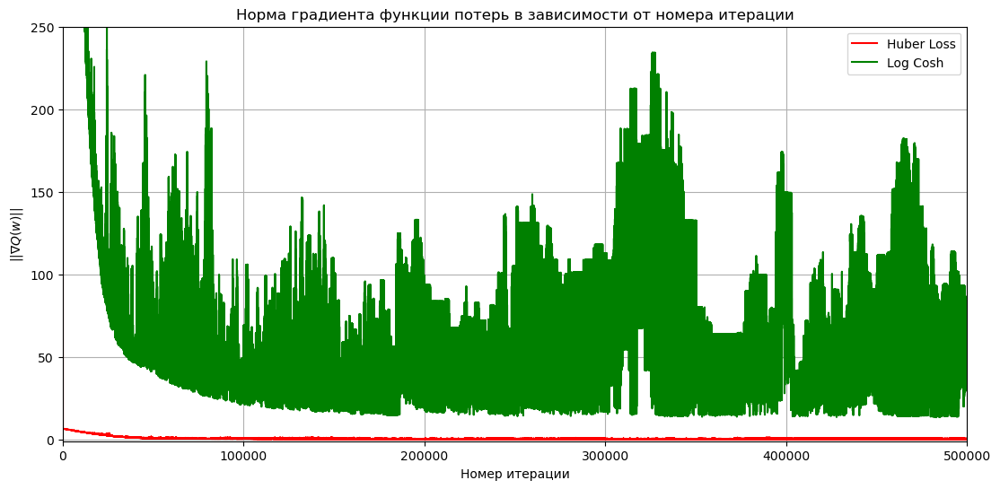

In [657]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss", color='red')
plt.plot(range(num_steps), grad_cos, label="Log Cosh", color='green')

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 250))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

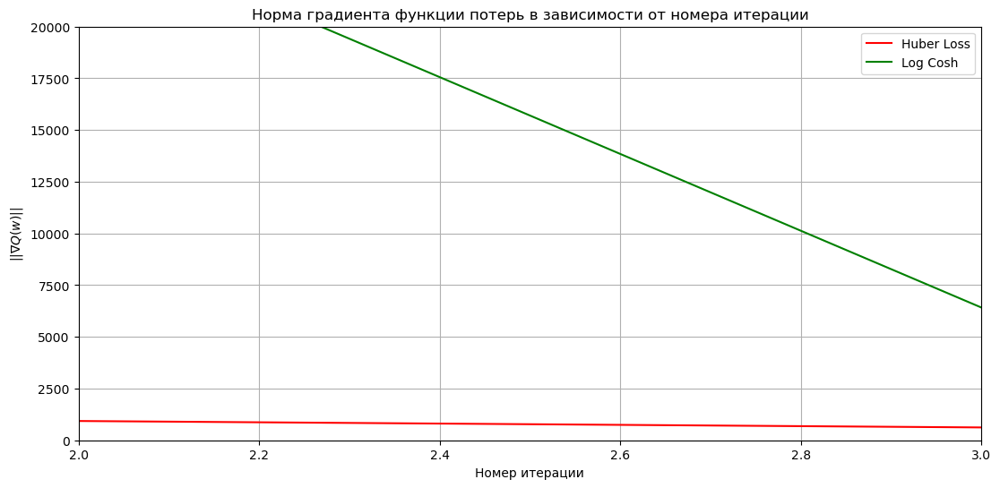

In [662]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss", color='red')
plt.plot(range(num_steps), grad_cos, label="Log Cosh", color='green')

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((2, 3))
plt.ylim((-1, 20000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

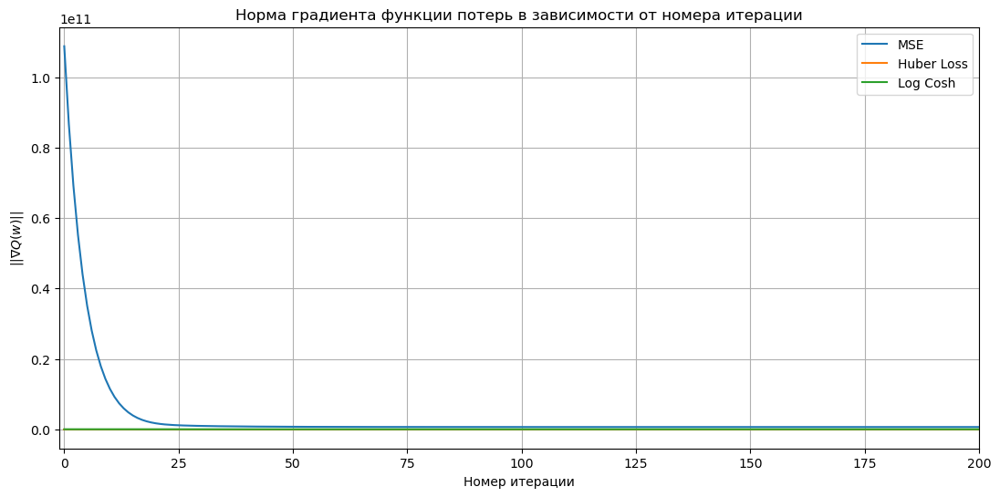

In [666]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, 200))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

### Общая оценка на не масштабированых данных

#### За основу возьмем Huber Loss

### Функционал потерь от величины ошибки

In [783]:
errors_huber_gd = np.array(lr_hub.deviation_list)[1::50]
errors_huber_sgd = np.array(lr_hub_sgd.deviation_list)[1::50][:2000]
errors_huber_sag = np.array(lr_hub_sag.deviation_list)[1::50][:2000]

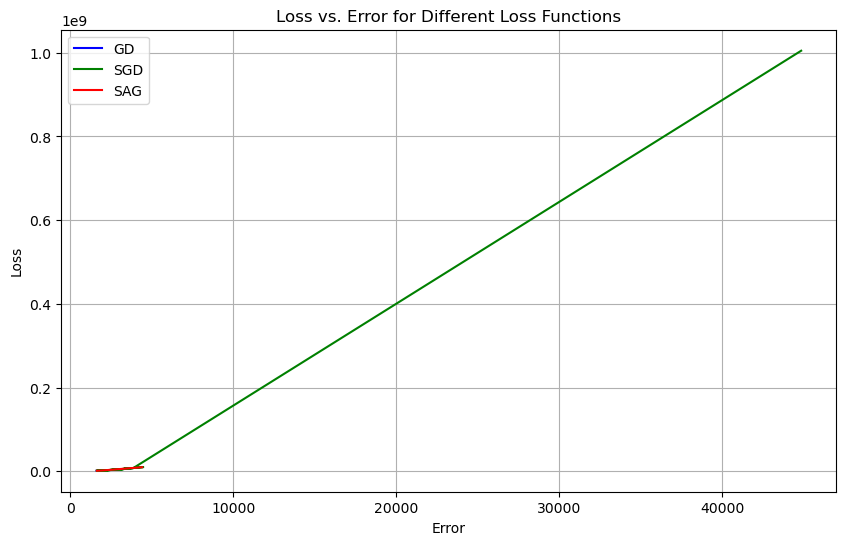

In [785]:
delta = 200000
huber_loss_gd = np.where(np.abs(errors_huber_gd) <= delta, 0.5 * errors_huber_gd ** 2, delta * (np.abs(errors_huber_gd) - 0.5 * delta))
huber_loss_sgd = np.where(np.abs(errors_huber_sgd) <= delta, 0.5 * errors_huber_sgd ** 2, delta * (np.abs(errors_huber_sgd) - 0.5 * delta))
huber_loss_sag = np.where(np.abs(errors_huber_sag) <= delta, 0.5 * errors_huber_sag ** 2, delta * (np.abs(errors_huber_sag) - 0.5 * delta))

plt.figure(figsize=(10, 6))
plt.plot(errors_huber_gd, huber_loss_gd, label='GD', color='blue')
plt.plot(errors_huber_sgd, huber_loss_sgd, label='SGD', color='green')
plt.plot(errors_huber_sag, huber_loss_sag, label='SAG', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

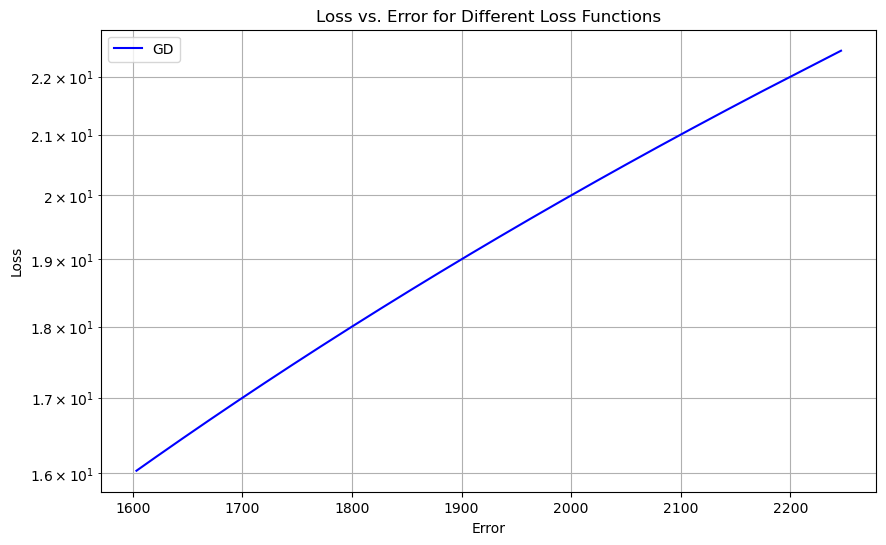

In [688]:
delta = 0.01
huber_loss_gd = np.where(np.abs(errors_huber_gd) <= delta, 0.5 * errors_huber_gd ** 2, delta * (np.abs(errors_huber_gd) - 0.5 * delta))
huber_loss_sgd = np.where(np.abs(errors_huber_sgd) <= delta, 0.5 * errors_huber_sgd ** 2, delta * (np.abs(errors_huber_sgd) - 0.5 * delta))
huber_loss_sag = np.where(np.abs(errors_huber_sag) <= delta, 0.5 * errors_huber_sag ** 2, delta * (np.abs(errors_huber_sag) - 0.5 * delta))

plt.figure(figsize=(10, 6))
plt.plot(errors_huber_gd, huber_loss_gd, label='GD', color='blue')
#plt.plot(errors_huber_sgd, huber_loss_sgd, label='SGD', color='green')
#plt.plot(errors_huber_sag, huber_loss_sag, label='SAG', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

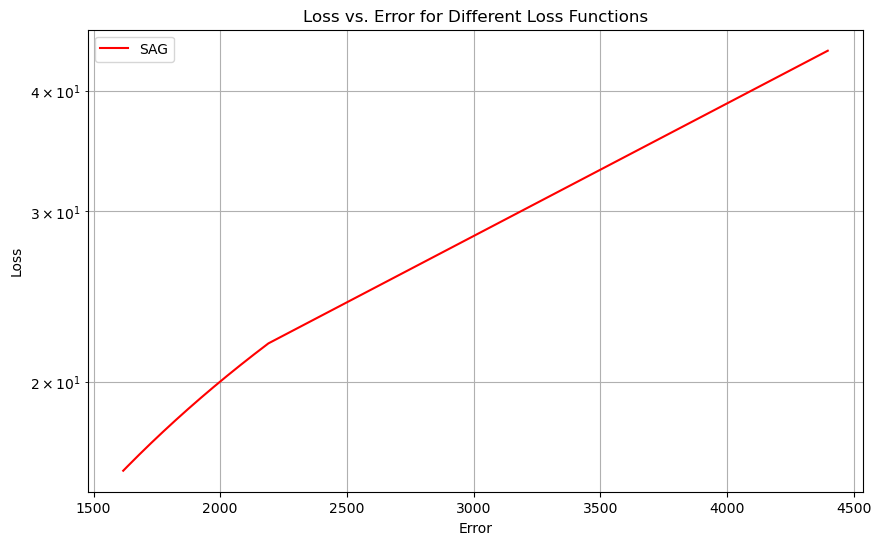

In [689]:
delta = 0.01
huber_loss_gd = np.where(np.abs(errors_huber_gd) <= delta, 0.5 * errors_huber_gd ** 2, delta * (np.abs(errors_huber_gd) - 0.5 * delta))
huber_loss_sgd = np.where(np.abs(errors_huber_sgd) <= delta, 0.5 * errors_huber_sgd ** 2, delta * (np.abs(errors_huber_sgd) - 0.5 * delta))
huber_loss_sag = np.where(np.abs(errors_huber_sag) <= delta, 0.5 * errors_huber_sag ** 2, delta * (np.abs(errors_huber_sag) - 0.5 * delta))

plt.figure(figsize=(10, 6))
#plt.plot(errors_huber_gd, huber_loss_gd, label='GD', color='blue')
#plt.plot(errors_huber_sgd, huber_loss_sgd, label='SGD', color='green')
plt.plot(errors_huber_sag, huber_loss_sag, label='SAG', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

In [787]:
errors_huber_gd = np.array(lr_hub.rmse_list)[1::50]
errors_huber_sgd = np.array(lr_hub_sgd.rmse_list)[1::50][:2000]
errors_huber_sag = np.array(lr_hub_sag.rmse_list)[1::50][:2000]

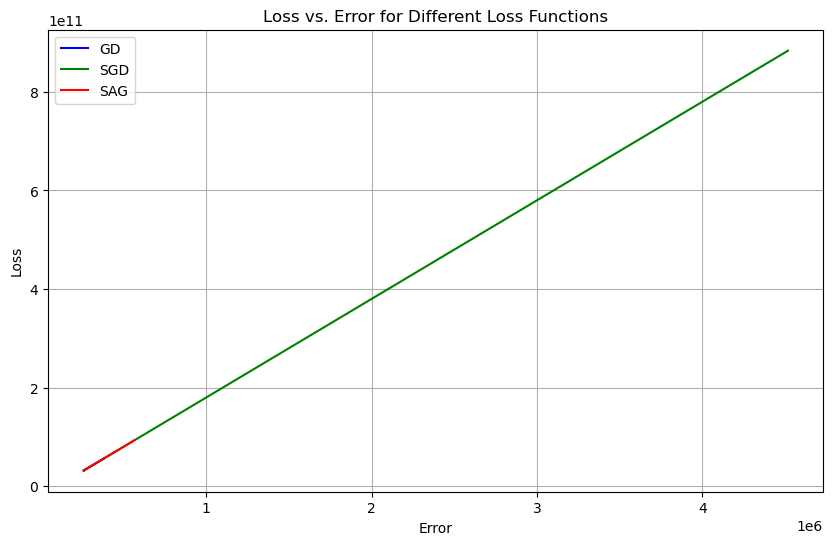

In [788]:
delta = 200000
huber_loss_gd = np.where(np.abs(errors_huber_gd) <= delta, 0.5 * errors_huber_gd ** 2, delta * (np.abs(errors_huber_gd) - 0.5 * delta))
huber_loss_sgd = np.where(np.abs(errors_huber_sgd) <= delta, 0.5 * errors_huber_sgd ** 2, delta * (np.abs(errors_huber_sgd) - 0.5 * delta))
huber_loss_sag = np.where(np.abs(errors_huber_sag) <= delta, 0.5 * errors_huber_sag ** 2, delta * (np.abs(errors_huber_sag) - 0.5 * delta))

plt.figure(figsize=(10, 6))
plt.plot(errors_huber_gd, huber_loss_gd, label='GD', color='blue')
plt.plot(errors_huber_sgd, huber_loss_sgd, label='SGD', color='green')
plt.plot(errors_huber_sag, huber_loss_sag, label='SAG', color='red')
plt.xlabel("Error")
plt.ylabel("Loss")
#plt.yscale('log') 
plt.title("Loss vs. Error for Different Loss Functions")
plt.legend()
plt.grid(True, which="both")
plt.show()

### Функции потерь от итерации

In [789]:
num_steps = 200
errors_huber_m = np.array(lr_hub.deviation_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd.deviation_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag.deviation_list)[:num_steps]

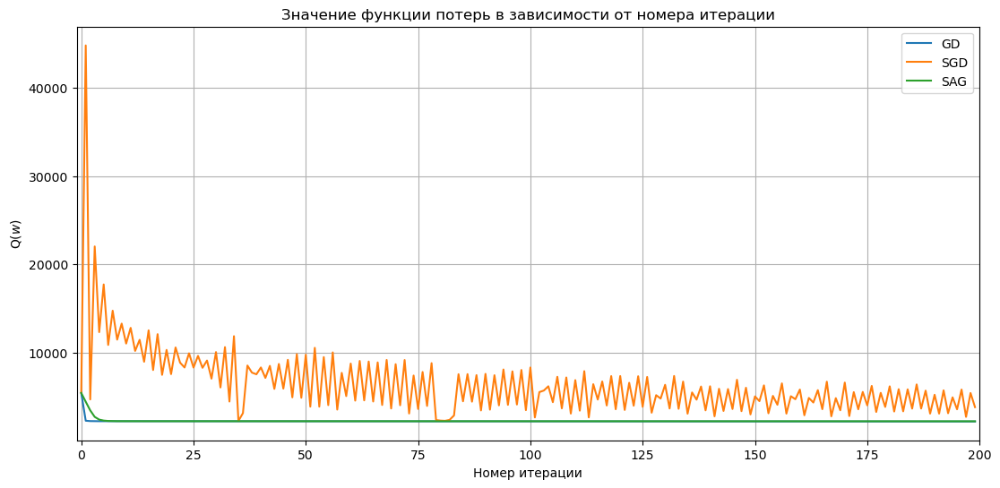

In [790]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

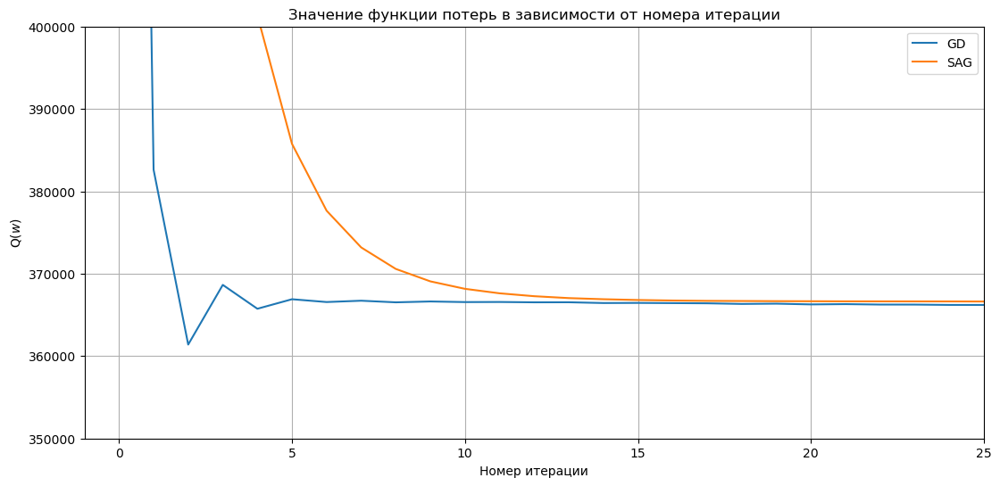

In [795]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 25))
plt.ylim((350000, 400000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [792]:
num_steps = 200
errors_huber_m = np.array(lr_hub.rmse_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd.rmse_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag.rmse_list)[:num_steps]

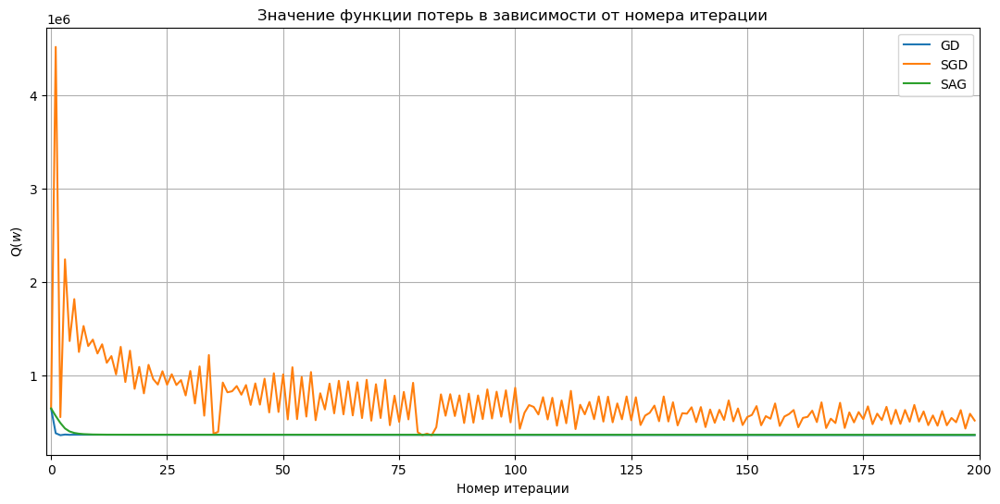

In [793]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [798]:
num_steps = 200
grad_hub_m = np.array(lr_hub.grad_list)[:num_steps]
grad_hub_sgd = np.array(lr_hub_sgd.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag.grad_list)[:num_steps]

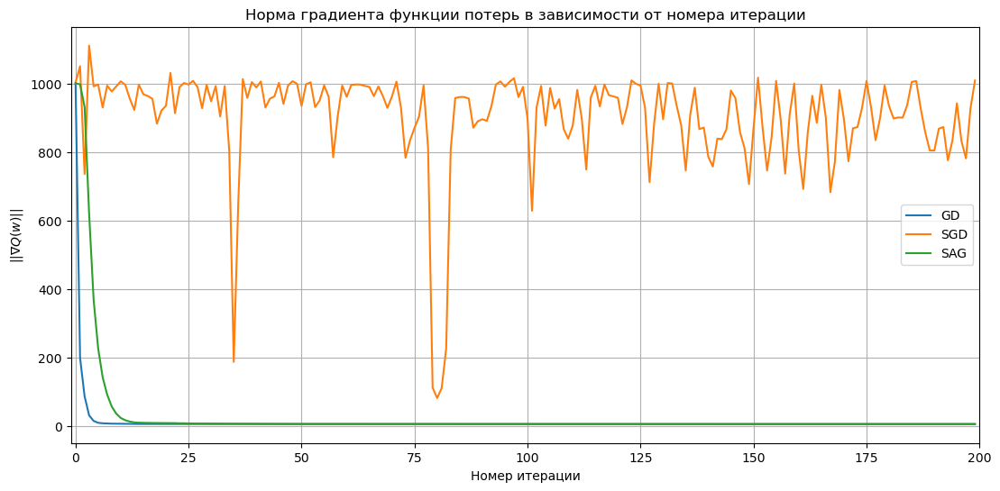

In [799]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, 200))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [802]:
num_steps = 100000
grad_hub_m = np.array(lr_hub.grad_list)[:num_steps]
grad_hub_sgd = np.array(lr_hub_sgd.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag.grad_list)[:num_steps]

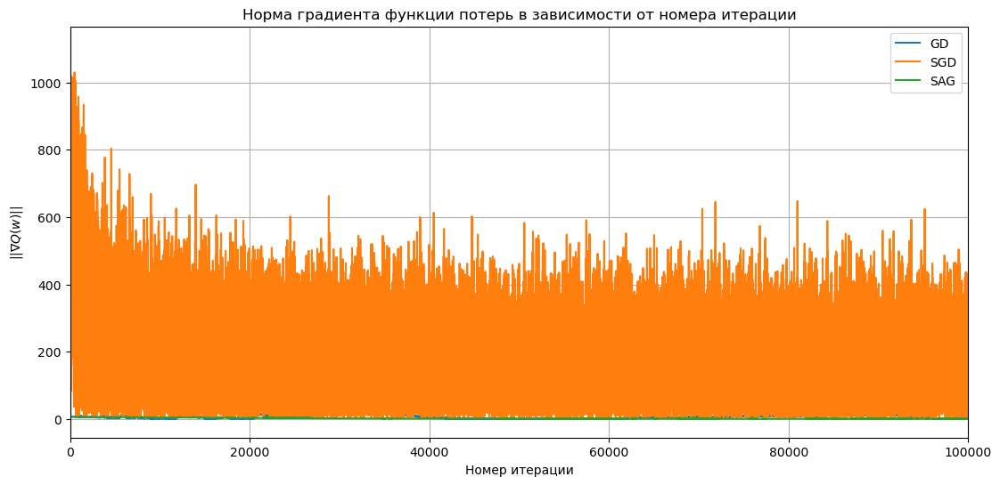

In [804]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

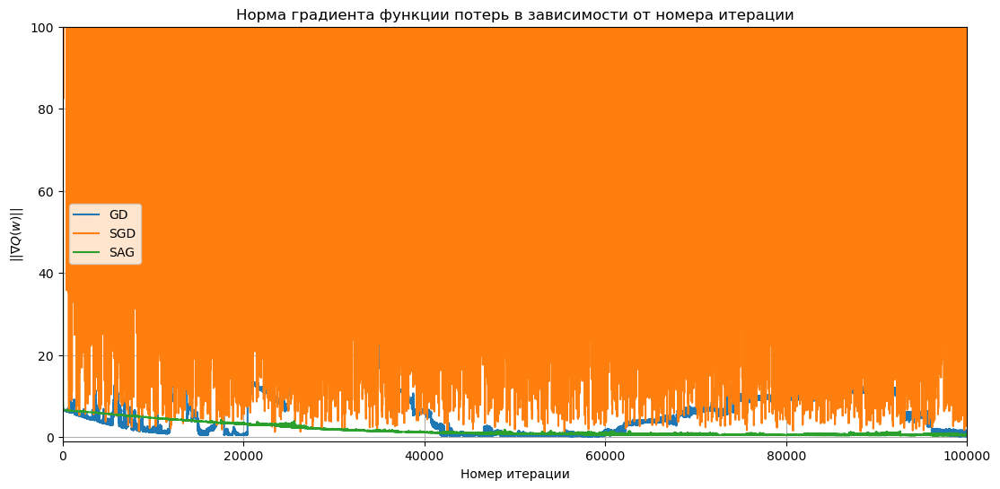

In [805]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 100))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

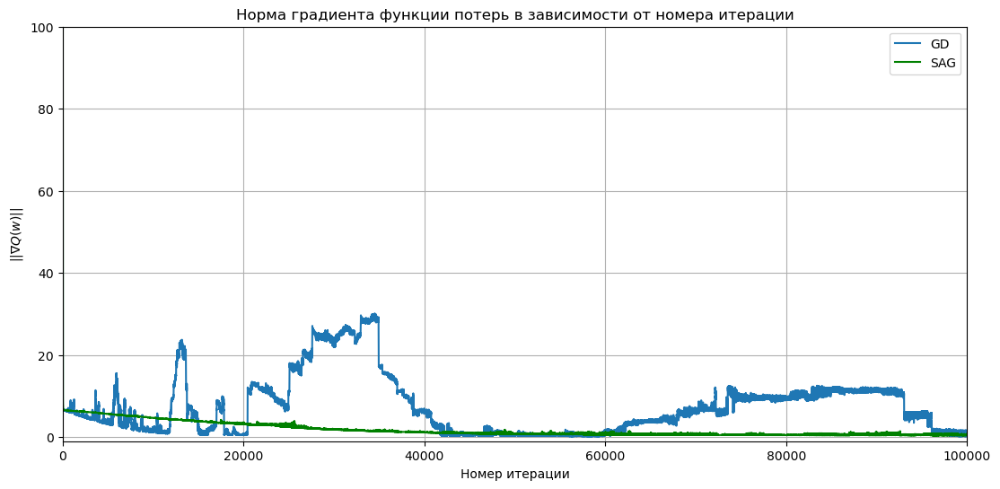

In [809]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
#plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG", color='green')

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.ylim((-1, 100))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

### Оценка времени работы 

#### За основу возьмем Huber Loss

In [889]:
lr_hub_time_sag = LinearRegression(HuberLoss(0.01), lr=0.003, method='SAG', n_iterations=20000)
lr_hub_time_sag.fit(X_train, y_train)

In [2348]:
import time

lr_hub_time_m = LinearRegression(HuberLoss(0.01), lr=0.004, method='GD', n_iterations=18000)
lr_hub_time_sgd = LinearRegression(HuberLoss(0.01), lr=0.09, method='SGD', batch_size=64, n_iterations=30000)
lr_hub_time_sag = LinearRegression(HuberLoss(0.01), lr=0.003, method='SAG', n_iterations=23000)

train_times = {}

# Замеряем время для метода GD
start_time = time.time()
lr_hub_time_m.fit(X_train, y_train)
train_times['GD'] = time.time() - start_time

# Замеряем время для метода SGD
start_time = time.time()
lr_hub_time_sgd.fit(X_train, y_train)
train_times['SGD'] = time.time() - start_time

# Замеряем время для метода SAG
start_time = time.time()
lr_hub_time_sag.fit(X_train, y_train)
train_times['SAG'] = time.time() - start_time

for method, t in train_times.items():
    print(f"Время обучения для {method}: {t:.2f} секунд")

Время обучения для GD: 12.85 секунд
Время обучения для SGD: 6.64 секунд
Время обучения для SAG: 16.06 секунд


In [2350]:
print(r2_score(y_test, lr_hub_time_m.predict(X_test)))
print(r2_score(y_test, lr_hub_time_sgd.predict(X_test)))
print(r2_score(y_test, lr_hub_time_sag.predict(X_test)))

0.44993920519407193
0.46818850592695715
0.4488885906228659


In [2351]:
print(f"Test: {mean_squared_error(y_test, lr_hub_time_sgd.predict(X_test))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_time_sag.predict(X_test))**0.5}")

Test: 282374.7445859887
Test: 287452.8986439716


## Подведем итоги первого этапа

###  Блок GD

#### MSE

In [810]:
print(f"Train: {mean_squared_error(y_train, lr_mse.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse.predict(X_test))**0.5}")
print(r2_score(y_train, lr_mse.predict(X_train)), r2_score(y_test, lr_mse.predict(X_test)))

Train: 253568.48710008833
Test: 273366.8075345785
0.4987788032674282 0.5015775687754409


#### Huber Loss

In [811]:
print(f"Train: {mean_squared_error(y_train, lr_hub.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub.predict(X_test))**0.5}")
print(r2_score(y_train, lr_hub.predict(X_train)), r2_score(y_test, lr_hub.predict(X_test)))

Train: 259222.37405146216
Test: 282139.80072555057
0.47617787549176005 0.4690731025035261


#### Log Cosh

In [812]:
print(f"Train: {mean_squared_error(y_train, lr_cos.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos.predict(X_train)), r2_score(y_test, lr_cos.predict(X_test)))

Train: 259429.3249552644
Test: 282347.01845872565
0.47534115192268844 0.46829293700335106


### Блок SGD

#### MSE

In [813]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sgd.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sgd.predict(X_test))**0.5}")
print(r2_score(y_train, lr_mse_sgd.predict(X_train)), r2_score(y_test, lr_mse_sgd.predict(X_test)))

Train: 253237.71637050982
Test: 272808.6721788525
0.5000855994691741 0.5036107577707174


#### Huber Loss

In [814]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sgd.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sgd.predict(X_test))**0.5}")
print(r2_score(y_train, lr_hub_sgd.predict(X_train)), r2_score(y_test, lr_hub_sgd.predict(X_test)))

Train: 261959.17445711966
Test: 284589.4470778258
0.465058739864457 0.45981365583111855


#### Log Cosh

In [820]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sgd.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sgd.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos_sgd.predict(X_train)), r2_score(y_test, lr_cos_sgd.predict(X_test)))

Train: 263106.32813565596
Test: 286594.3355762132
0.46036332513655265 0.4521757885088309


### Блок SAG

#### MSE

In [821]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sag.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sag.predict(X_test))**0.5}")
print(r2_score(y_train, lr_mse_sag.predict(X_train)), r2_score(y_test, lr_mse_sag.predict(X_test)))

Train: 250287.48104303202
Test: 268485.9802016424
0.5116658175380182 0.5192168454995707


#### Huber Loss

In [822]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sag.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sag.predict(X_test))**0.5}")
print(r2_score(y_train, lr_hub_sag.predict(X_train)), r2_score(y_test, lr_hub_sag.predict(X_test)))

Train: 259011.36048605083
Test: 281925.4648524969
0.4770303372900623 0.4698794648479906


#### Log Cosh

In [823]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sag.predict(X_train))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sag.predict(X_test))**0.5}")
print(r2_score(y_train, lr_cos_sag.predict(X_train)), r2_score(y_test, lr_cos_sag.predict(X_test)))

Train: 257967.31571040506
Test: 280788.15166718676
0.48123790026525026 0.47414794745153344


## Этап 2 
### Данные масштабированы

In [914]:
from sklearn.preprocessing import StandardScaler

In [1715]:
normalizer = StandardScaler()
X_train_n = normalizer.fit_transform(X_train)
X_test_n = normalizer.transform(X_test)

### GD

In [1631]:
lr_mse_gd = LinearRegressionStats(MSELoss(), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd.fit(X_train_n, y_train)
print(lr_mse_gd.iteration)
lr_mse_gd.w

1000


array([ 33575.17833721,  59692.19288893,   1956.52070142,  52694.72361511,
        27574.53452072,  15222.36009474,  47882.43006762,  33635.83723562,
       -99145.56415226,   6333.96678472,  -2607.99375086,  23050.4165873 ,
       -14873.52877029,  14153.14329388,   1700.91405805,  -2475.56220736,
       -11174.2900372 ,  -5739.0699701 ,  20288.72097815, -21321.44433145,
       -11358.32654578, 159453.28059129, 539978.56666004])

In [1632]:
print(f"Train: {mean_squared_error(y_train, lr_mse_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_gd.predict(X_train_n)), r2_score(y_test, lr_mse_gd.predict(X_test_n)))

Train: 205512.2078443588
Test: 220789.15586788414
0.6707588423137019 0.6748666674735103


достиг оптимума на 1000

In [2284]:
lr_hub_gd = LinearRegressionStats(HuberLoss(0.9), lr=2250, method='GD', n_iterations=1000)
lr_hub_gd.fit(X_train_n, y_train)
print(lr_hub_gd.iteration)
lr_hub_gd.w

1000


array([ 24374.37839251,  40359.86164751,   4035.68778511,  33011.42533447,
        27172.62012654,  15764.89786868,  28227.41341928,  30551.16666067,
       -81003.62449643,   4759.44513983,   5826.68275982,  42265.98754341,
        -8331.65700801,   6907.132365  ,  -2520.54720077,  -1239.69358179,
       -20585.83823865,  -1577.32620754,  20495.98207237, -18061.12083563,
        -9551.77408663, 127072.24024278, 517272.49761414])

In [2285]:
print(f"Train: {mean_squared_error(y_train, lr_hub_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_gd.predict(X_train_n)), r2_score(y_test, lr_hub_gd.predict(X_test_n)))

Train: 214134.3631054448
Test: 233917.85872888754
0.6425530445336936 0.6350504967014413


достиг оптимума на 1379

In [1976]:
lr_cos_gd = LinearRegressionStats(LogCosh(), lr=2500, method='GD', n_iterations=1000)
lr_cos_gd.fit(X_train_n, y_train)
print(lr_cos_gd.iteration)
np.array(lr_cos_gd.w)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


1000


array([ 26326.57546819,  38622.89850861,   4550.69230399,  35489.52152825,
        26142.69626051,  15347.9650569 ,  26500.94015101,  30199.67910856,
       -84353.33906431,   3584.16337146,   4311.30755812,  39560.21943474,
        -8321.15071351,   7407.59804219,  -2262.87952831,  -1029.74876584,
       -22019.61030005,  -2229.00518305,  20186.62364332, -17687.17521147,
       -10100.48732692, 132988.47649532, 517915.86187655])

In [1977]:
print(f"Train: {mean_squared_error(y_train, lr_cos_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_gd.predict(X_train_n)), r2_score(y_test, lr_cos_gd.predict(X_test_n)))

Train: 213500.3285864978
Test: 233270.5784101454
0.6446666537941768 0.637067425211109


достиг оптимума на 1151

In [1218]:
from sklearn.model_selection import KFold
from tqdm import tqdm

learning_rates = np.arange(0, 5000, 50)

kf = KFold(n_splits=3, shuffle=True, random_state=42)
best_lr = None
best_score = float('inf')

for lr in tqdm(learning_rates):
    scores = []
    for train_index, val_index in kf.split(X_train_n):
        X_tr, X_val = X_train_n[train_index], X_train_n[val_index]
        y_tr, y_val = y_train[train_index], y_train[val_index]
        
        model = LinearRegression(LogCosh(), lr=lr, method='GD', n_iterations=1000)
        model.fit(X_tr, y_tr)
        
        y_pred = model.predict(X_val)
        score = mean_squared_error(y_val, y_pred) ** 0.5 
        scores.append(score)
    
    mean_score = np.mean(scores)
    if mean_score < best_score:
        best_score = mean_score
        best_lr = lr

print(f"Лучший шаг обучения (learning rate): {best_lr}, с RMSE: {best_score}")

100%|█████████████████████████████████████████| 100/100 [02:02<00:00,  1.22s/it]

Лучший шаг обучения (learning rate): 4850, с RMSE: 213150.4694662709


## Оценка GD

### Функции потерь от итерации

In [1219]:
num_steps = 200
errors_mse = np.array(lr_mse_gd.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_gd.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_gd.deviation_list)[:num_steps]

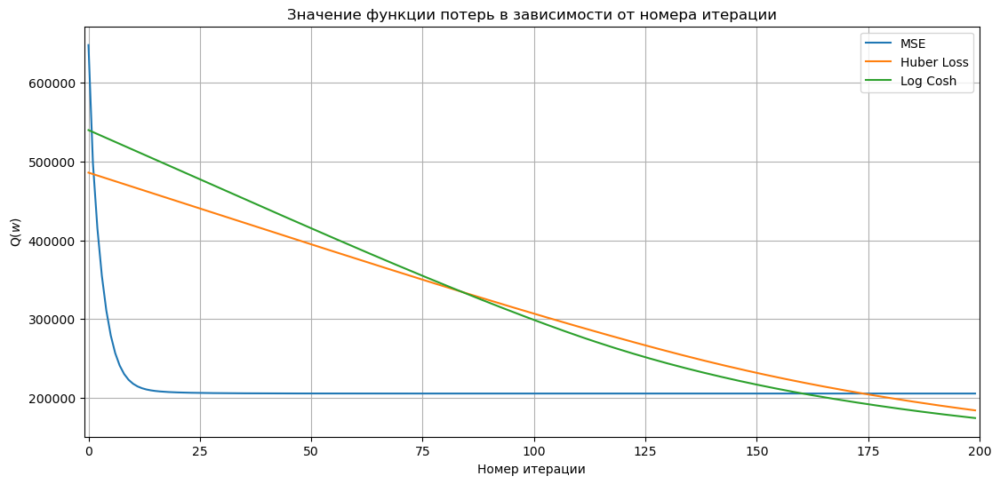

In [1221]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1222]:
num_steps = 1000
errors_mse = np.array(lr_mse_gd.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_gd.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_gd.deviation_list)[:num_steps]

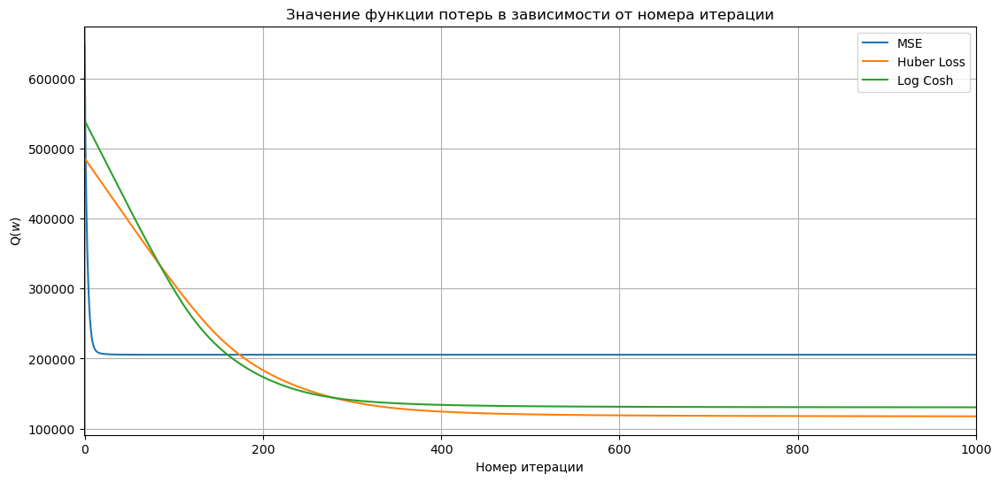

In [1223]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1226]:
num_steps = 200
errors_mse = np.array(lr_mse_gd.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_gd.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_gd.rmse_list)[:num_steps]

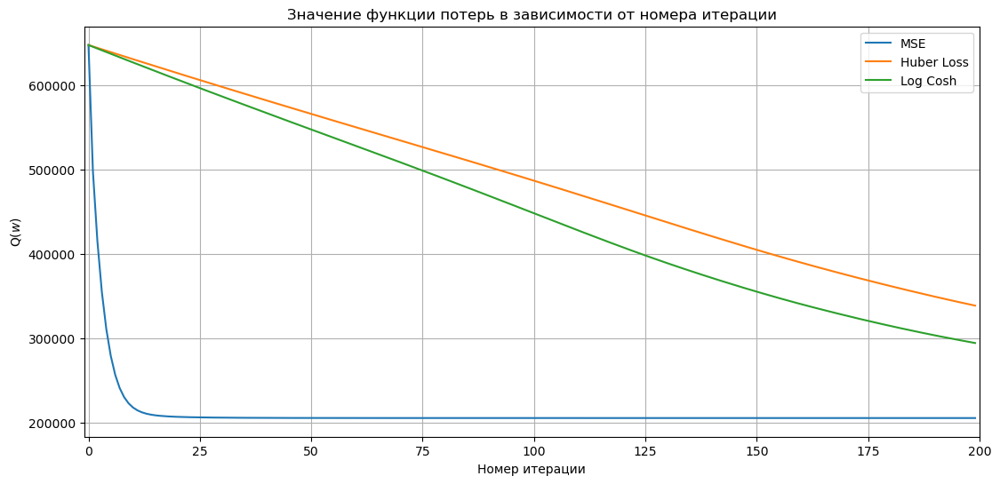

In [1227]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1224]:
num_steps = 1000
errors_mse = np.array(lr_mse_gd.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_gd.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_gd.rmse_list)[:num_steps]

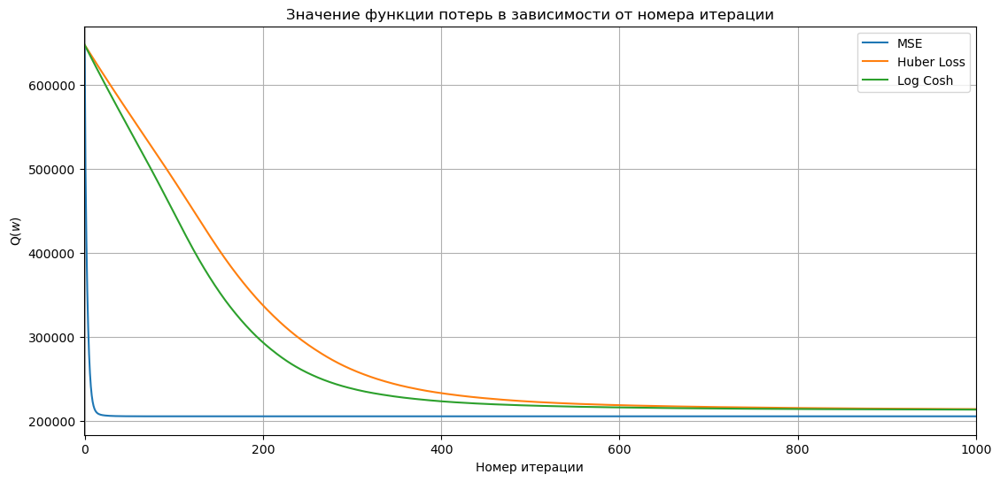

In [1225]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [1231]:
num_steps = 200
grad_mse = np.array(lr_mse_gd.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_gd.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_gd.grad_list)[:num_steps]

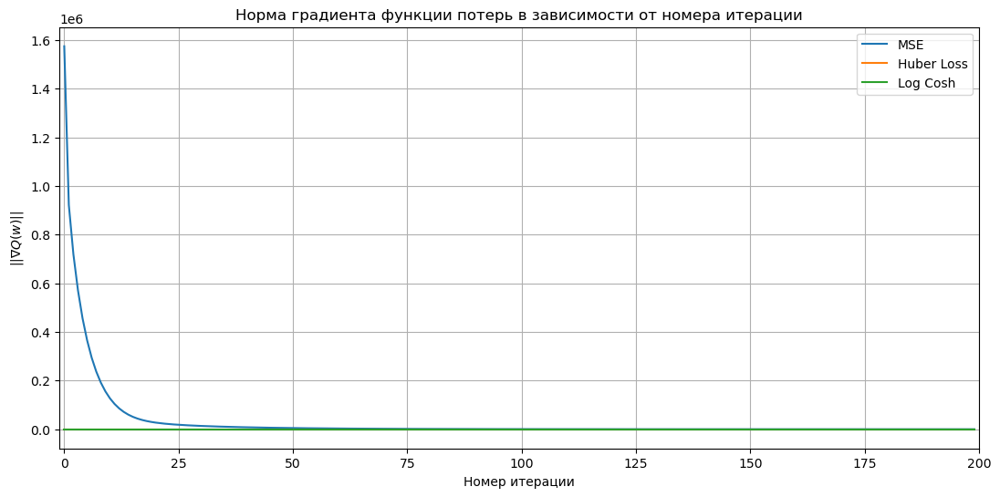

In [1232]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

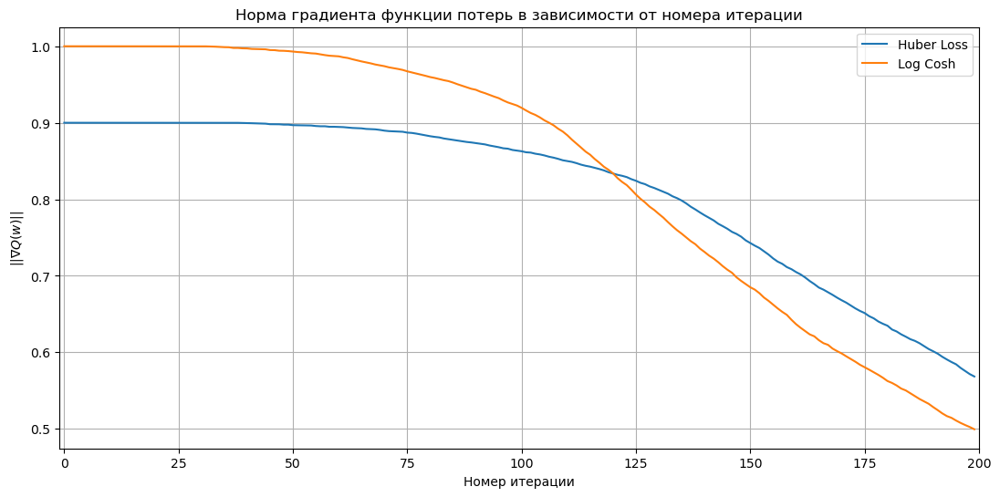

In [1236]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [1237]:
num_steps = 1000
grad_mse = np.array(lr_mse_gd.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_gd.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_gd.grad_list)[:num_steps]

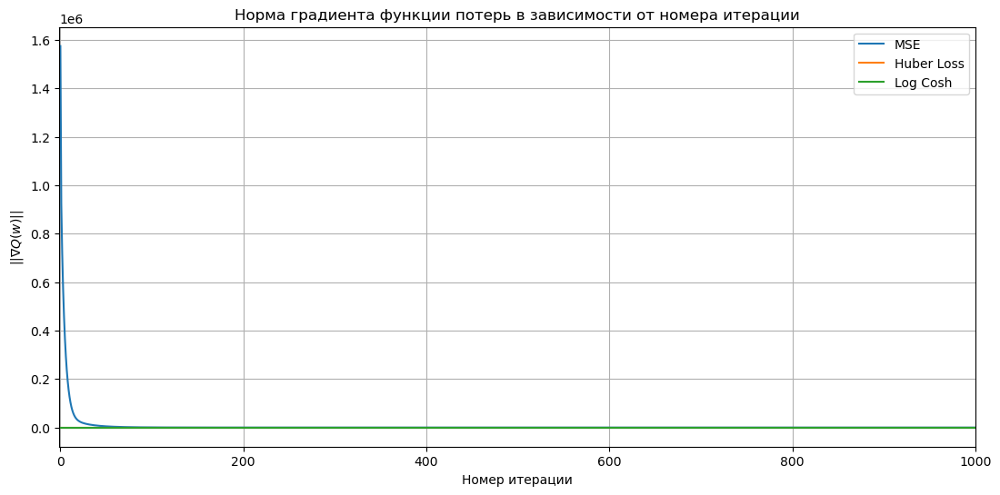

In [1238]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

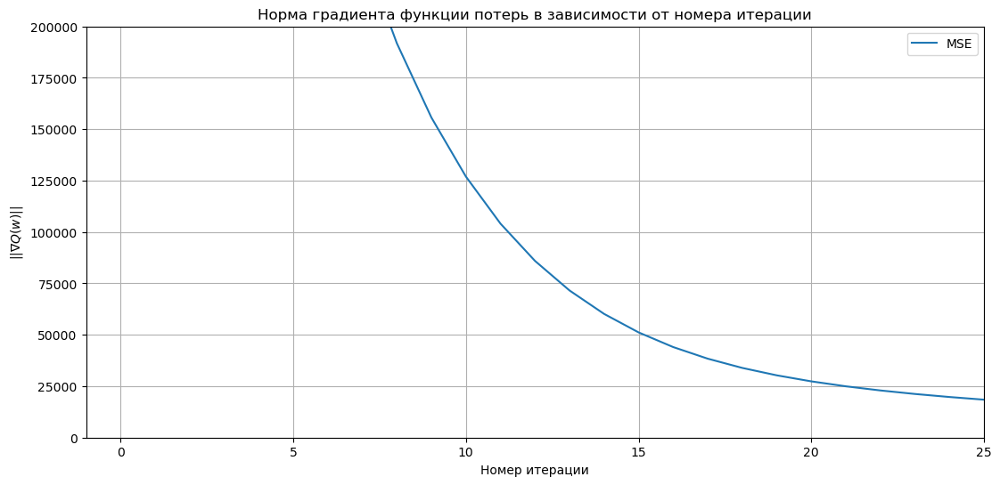

In [1243]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, 25))
plt.ylim((0e6, 0.2e6))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

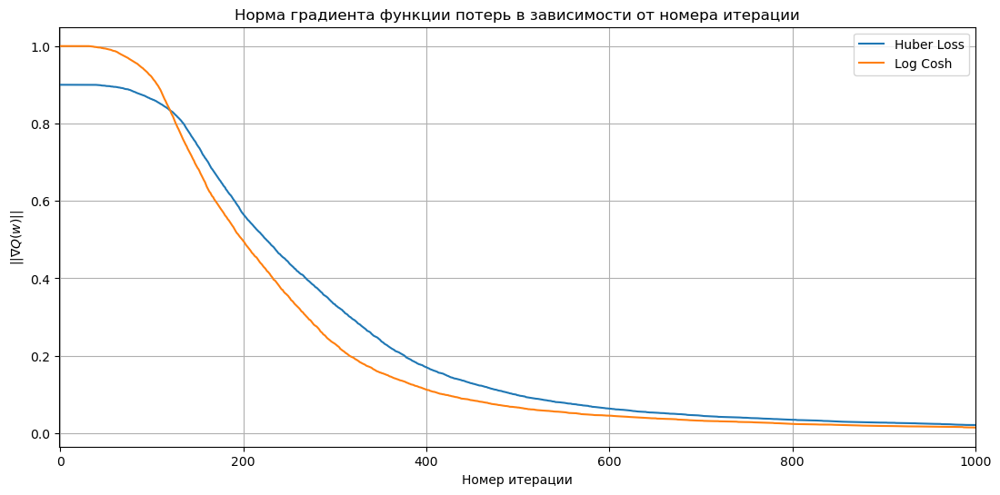

In [1239]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

## SGD

In [1429]:
lr_mse_sgd_n = LinearRegressionStats(MSELoss(), lr=0.01, method='SGD', batch_size=64, n_iterations=3000)
lr_mse_sgd_n.fit(X_train_n, y_train)
print(lr_mse_sgd_n.iteration)
lr_mse_sgd_n.w

3000


array([ 2.91715597e+04,  6.50171166e+04,  9.68896322e+02,  5.45466270e+04,
        3.22084950e+04,  1.63855639e+04,  5.45398797e+04,  3.21439496e+04,
       -8.92246638e+04,  9.46422624e+03,  2.15311764e+03,  3.22156432e+04,
       -1.40896910e+04,  1.12107179e+04,  1.06632023e+02, -4.32703457e+03,
       -9.58903091e+03, -5.13623096e+03,  2.07388078e+04, -2.12909051e+04,
       -1.31173105e+04,  1.44230312e+05,  5.40104664e+05])

In [1430]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_sgd_n.predict(X_train_n)), r2_score(y_test, lr_mse_sgd_n.predict(X_test_n)))

Train: 205992.324937857
Test: 221190.81340253013
0.6692187006769139 0.6736826325207721


In [1350]:
lr_hub_sgd_n = LinearRegressionStats(HuberLoss(0.9), lr=5500, method='SGD', batch_size=64, n_iterations=3000)
lr_hub_sgd_n.fit(X_train_n, y_train)
print(lr_hub_sgd_n.iteration)
lr_hub_sgd_n.w

3000


array([ 21981.54684442,  43053.44342249,   3280.27882698,  31724.27674439,
        29375.39399739,  16121.91067261,  31478.2560837 ,  30016.39529523,
       -77194.71387587,   6466.73264272,   8706.22792884,  44721.67744135,
        -8043.10604744,   5348.23524219,  -2816.76463835,  -2214.00634359,
       -18931.48326149,  -1191.37972157,  20419.69487871, -19018.65487839,
        -8857.32836983, 121240.83726351, 516427.06120607])

In [1353]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_sgd_n.predict(X_train_n)), r2_score(y_test, lr_hub_sgd_n.predict(X_test_n)))

Train: 214458.21876531304
Test: 234064.59146293602
0.6414710252232609 0.6345924997428642


In [1349]:
lr_cos_sgd_n = LinearRegressionStats(LogCosh(), lr=5000, method='SGD', batch_size=64, n_iterations=3000)
lr_cos_sgd_n.fit(X_train_n, y_train)
print(lr_cos_sgd_n.iteration)
np.array(lr_cos_sgd_n.w)

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


3000


array([ 22106.18586845,  42975.96872161,   3205.60320109,  32044.4954882 ,
        29369.78543482,  16035.18202276,  31386.51188035,  30028.46524592,
       -77497.15325526,   6376.0332148 ,   8544.65385075,  44556.77350629,
        -8042.54950947,   5381.26450711,  -2711.23667459,  -2265.28227383,
       -19007.00110868,  -1196.96707885,  20388.27058315, -19011.3472726 ,
        -8900.09380889, 121668.81336138, 516517.81841063])

In [1355]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_sgd_n.predict(X_train_n)), r2_score(y_test, lr_cos_sgd_n.predict(X_test_n)))

Train: 214355.68969880277
Test: 233952.64776816318
0.6418137572874568 0.6349419356297342


## Оценка SGD

### Функции потерь от итерации

In [1356]:
num_steps = 200
errors_mse = np.array(lr_mse_sgd_n.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sgd_n.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd_n.deviation_list)[:num_steps]

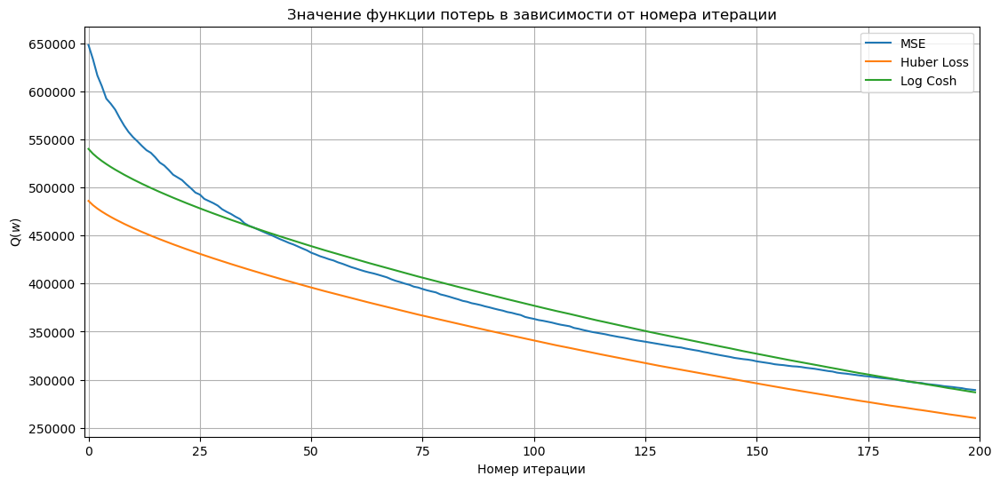

In [1357]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1358]:
num_steps = 3000
errors_mse = np.array(lr_mse_sgd_n.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sgd_n.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd_n.deviation_list)[:num_steps]

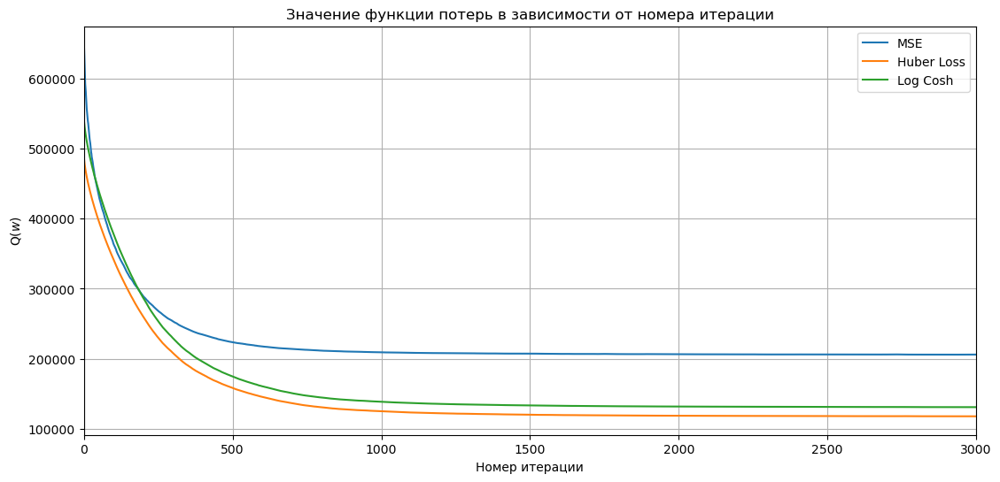

In [1359]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1360]:
num_steps = 200
errors_mse = np.array(lr_mse_sgd_n.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_sgd_n.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd_n.rmse_list)[:num_steps]

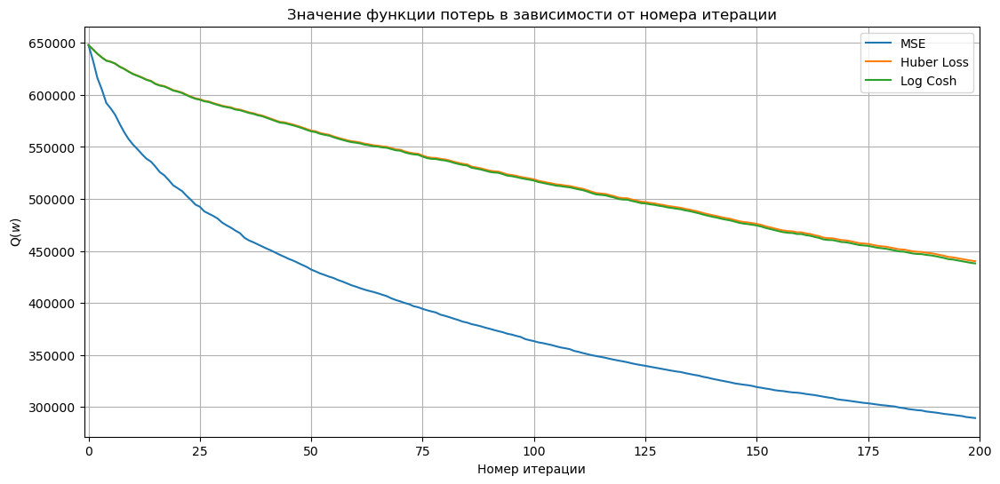

In [1361]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

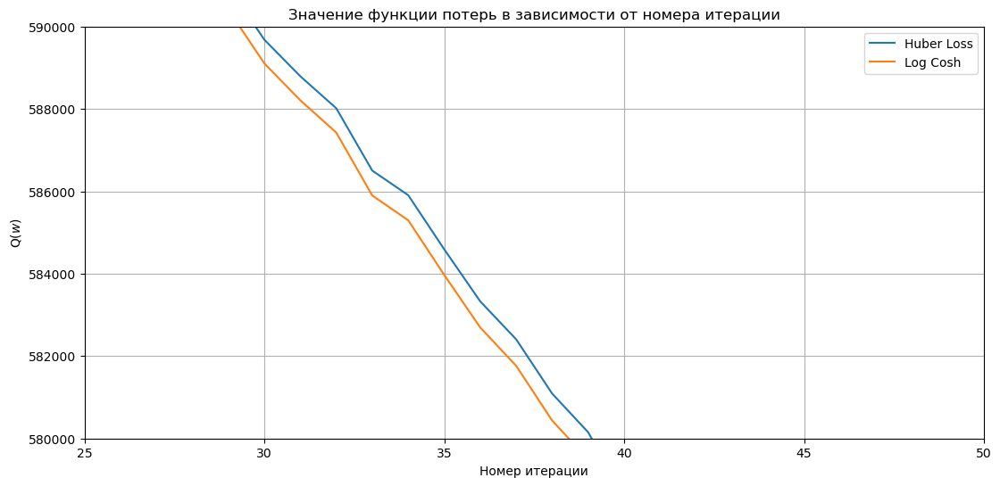

In [1371]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((25, 50))
plt.ylim((580000, 590000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

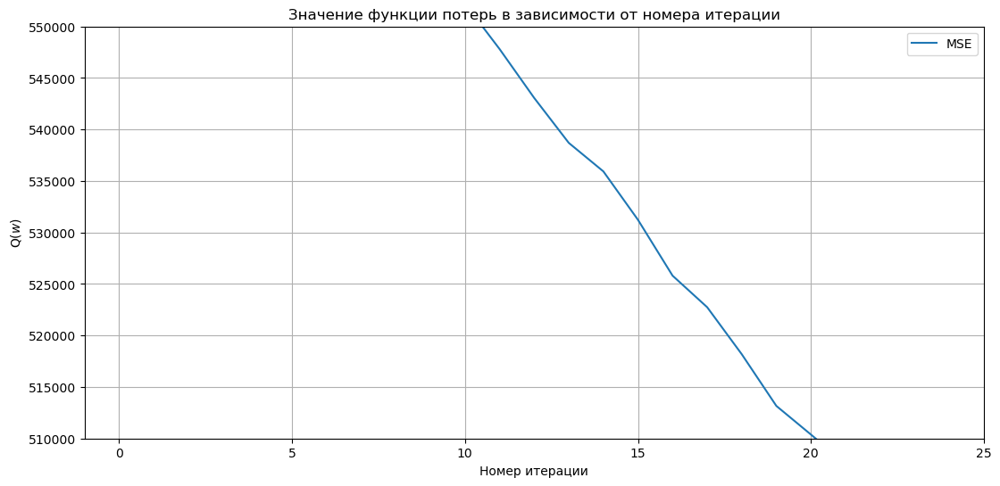

In [1369]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, 25))
plt.ylim((510000, 550000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1380]:
num_steps = 3000
errors_mse = np.array(lr_mse_sgd_n.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_sgd_n.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sgd_n.rmse_list)[:num_steps]

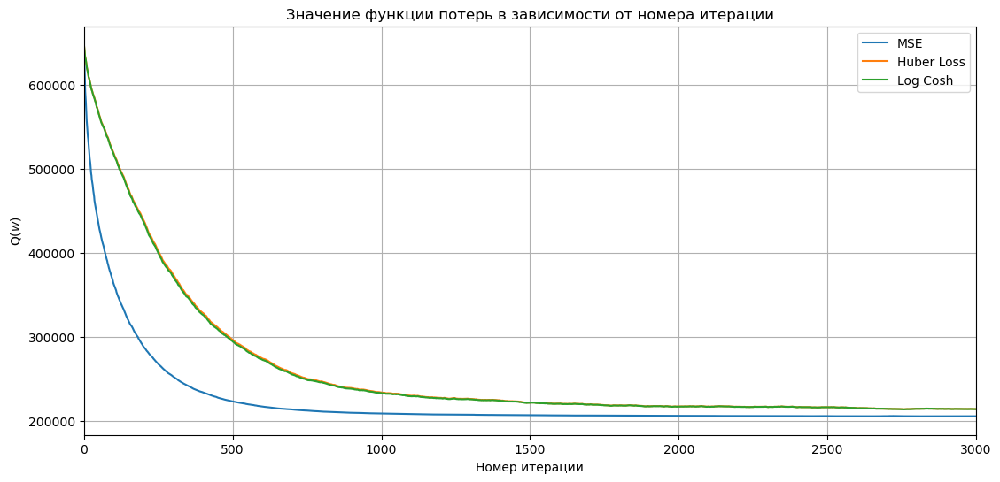

In [1373]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

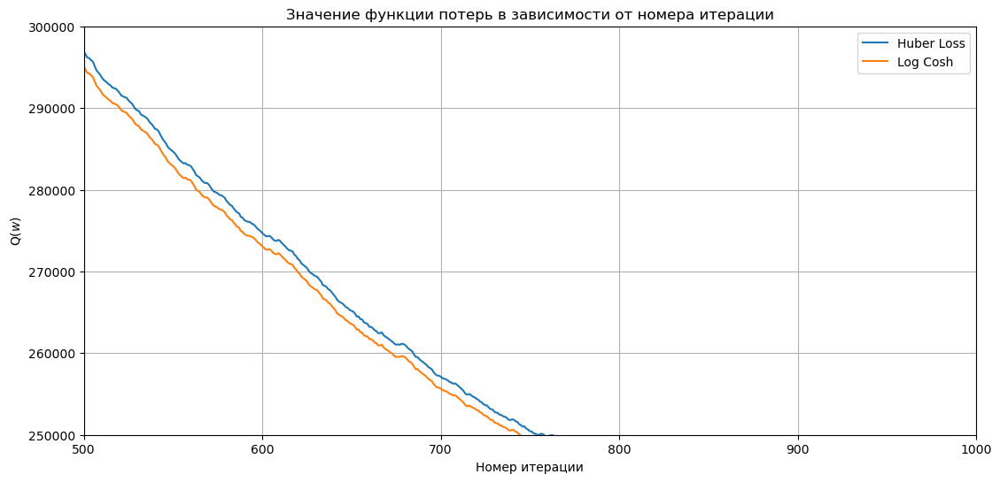

In [1383]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((500, 1000))
plt.ylim((250000, 300000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [1374]:
num_steps = 200
grad_mse = np.array(lr_mse_sgd_n.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sgd_n.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sgd_n.grad_list)[:num_steps]

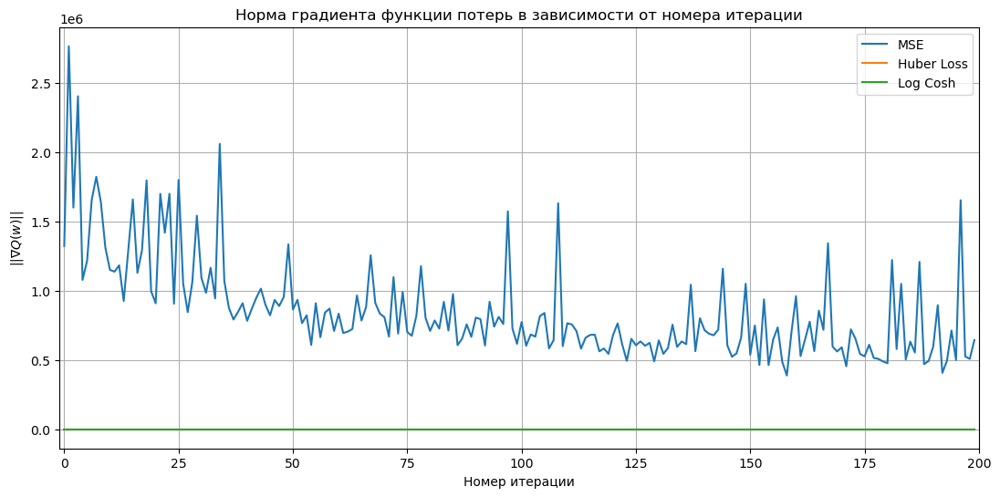

In [1375]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

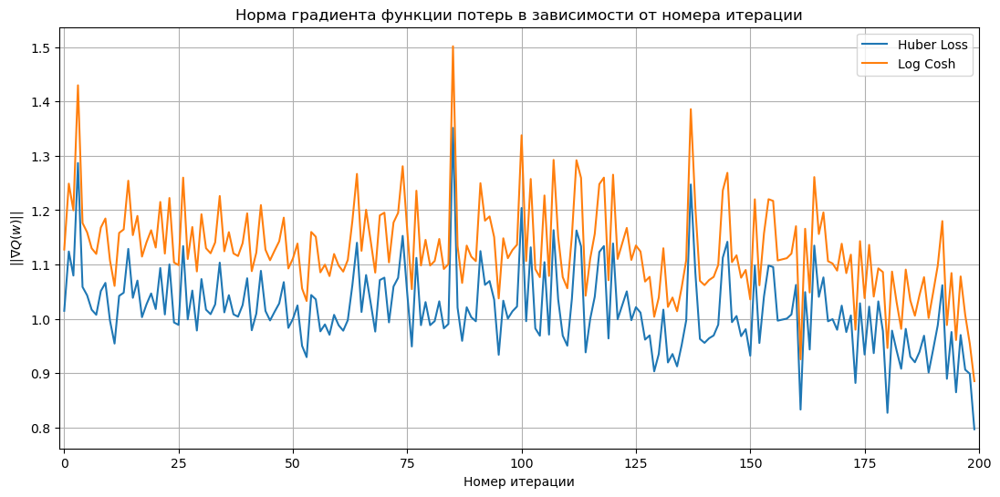

In [1376]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [1384]:
num_steps = 3000
grad_mse = np.array(lr_mse_sgd_n.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sgd_n.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sgd_n.grad_list)[:num_steps]

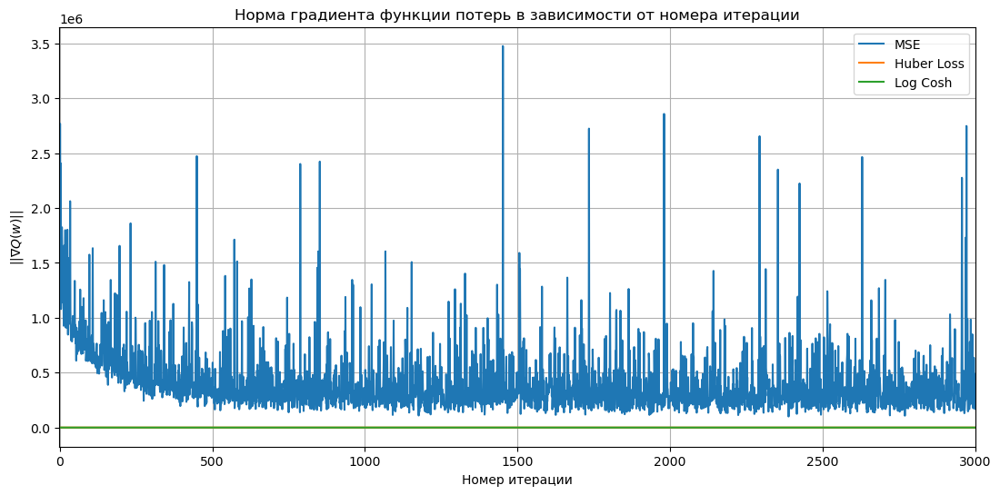

In [1385]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

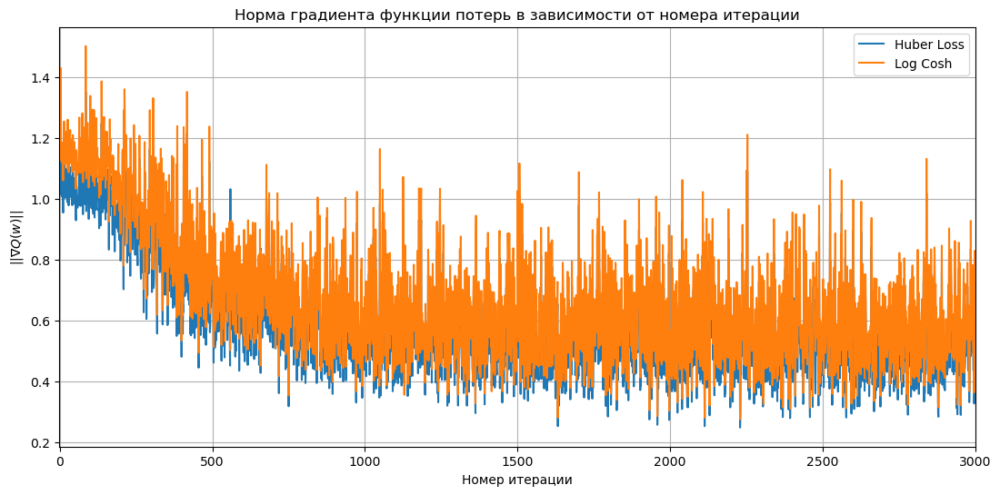

In [1386]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

## SAG

In [1427]:
lr_mse_sag_n = LinearRegressionStats(MSELoss(), lr=0.1, method='SAG', n_iterations=1000)
lr_mse_sag_n.fit(X_train_n, y_train)
print(lr_mse_sag_n.iteration)
lr_mse_sag_n.w

1000


array([ 33575.17833721,  59692.19288893,   1956.52070142,  52694.72361511,
        27574.53452072,  15222.36009474,  47882.43006762,  33635.83723562,
       -99145.56415226,   6333.96678472,  -2607.99375086,  23050.4165873 ,
       -14873.52877029,  14153.14329388,   1700.91405805,  -2475.56220736,
       -11174.2900372 ,  -5739.0699701 ,  20288.72097815, -21321.44433145,
       -11358.32654578, 159453.28059129, 539978.56666004])

In [1399]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_sag_n.predict(X_train_n)), r2_score(y_test, lr_mse_sag_n.predict(X_test_n)))

Train: 205512.20968127516
Test: 220789.13560098805
0.6707588364280324 0.674866727163427


достиг оптимума на 2253

In [1444]:
lr_hub_sag_n = LinearRegressionStats(HuberLoss(0.9), lr=2250, method='SAG', n_iterations=1000)
lr_hub_sag_n.fit(X_train_n, y_train)
print(lr_hub_sag_n.iteration)
lr_hub_sag_n.w

1000


array([ 24374.37839251,  40359.86164751,   4035.68778511,  33011.42533447,
        27172.62012654,  15764.89786868,  28227.41341928,  30551.16666067,
       -81003.62449643,   4759.44513983,   5826.68275982,  42265.98754341,
        -8331.65700801,   6907.132365  ,  -2520.54720077,  -1239.69358179,
       -20585.83823865,  -1577.32620754,  20495.98207237, -18061.12083563,
        -9551.77408663, 127072.24024278, 517272.49761414])

In [1445]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_sag_n.predict(X_train_n)), r2_score(y_test, lr_hub_sag_n.predict(X_test_n)))

Train: 214134.3631054448
Test: 233917.85872888754
0.6425530445336936 0.6350504967014413


достиг оптимума на 1379

In [1450]:
lr_cos_sag_n = LinearRegressionStats(LogCosh(), lr=2500, method='SAG', n_iterations=1000)
lr_cos_sag_n.fit(X_train_n, y_train)
print(lr_cos_sag_n.iteration)
lr_cos_sag_n.w

/tmp/ipykernel_3573/157803420.py:4: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


1000


array([ 26326.57546819,  38622.89850861,   4550.69230399,  35489.52152825,
        26142.69626051,  15347.9650569 ,  26500.94015101,  30199.67910856,
       -84353.33906431,   3584.16337146,   4311.30755812,  39560.21943474,
        -8321.15071351,   7407.59804219,  -2262.87952831,  -1029.74876584,
       -22019.61030005,  -2229.00518305,  20186.62364332, -17687.17521147,
       -10100.48732692, 132988.47649532, 517915.86187655])

In [1451]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_sag_n.predict(X_train_n)), r2_score(y_test, lr_cos_sag_n.predict(X_test_n)))

Train: 213500.3285864978
Test: 233270.5784101454
0.6446666537941768 0.637067425211109


достиг оптимума на 1151

## Оценка SAG

### Функции потерь от итерации

In [1455]:
num_steps = 200
errors_mse = np.array(lr_mse_sag_n.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sag_n.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag_n.deviation_list)[:num_steps]

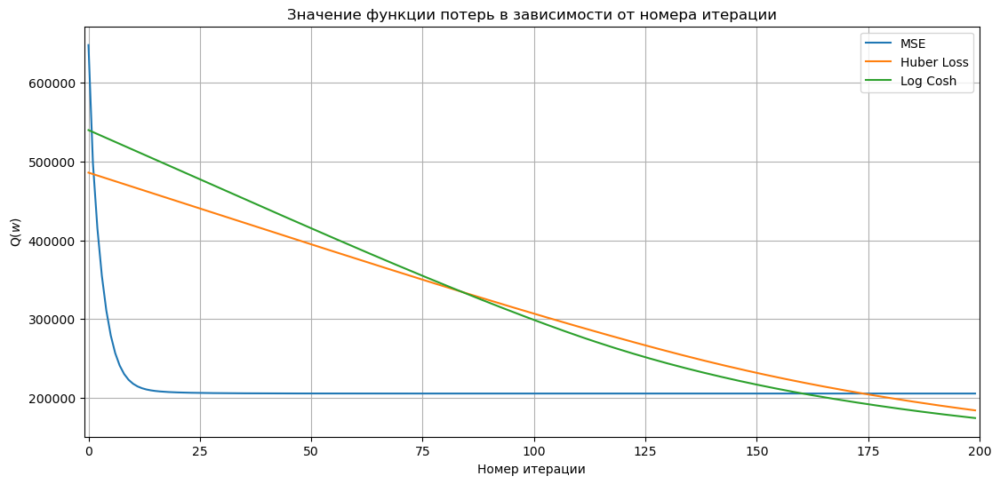

In [1456]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1457]:
num_steps = 1000
errors_mse = np.array(lr_mse_sag_n.deviation_list)[:num_steps] ** 0.5
errors_huber = np.array(lr_hub_sag_n.deviation_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag_n.deviation_list)[:num_steps]

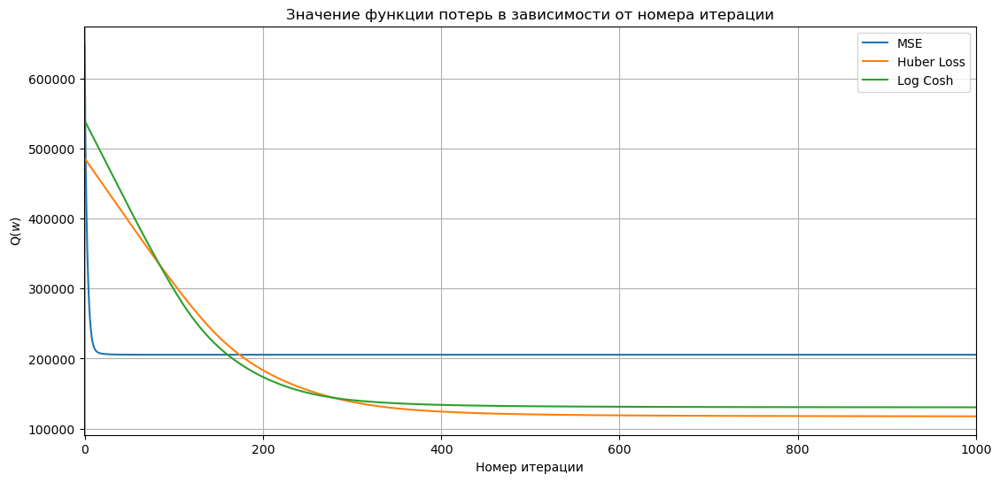

In [1458]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1459]:
num_steps = 200
errors_mse = np.array(lr_mse_sag_n.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_sag_n.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag_n.rmse_list)[:num_steps]

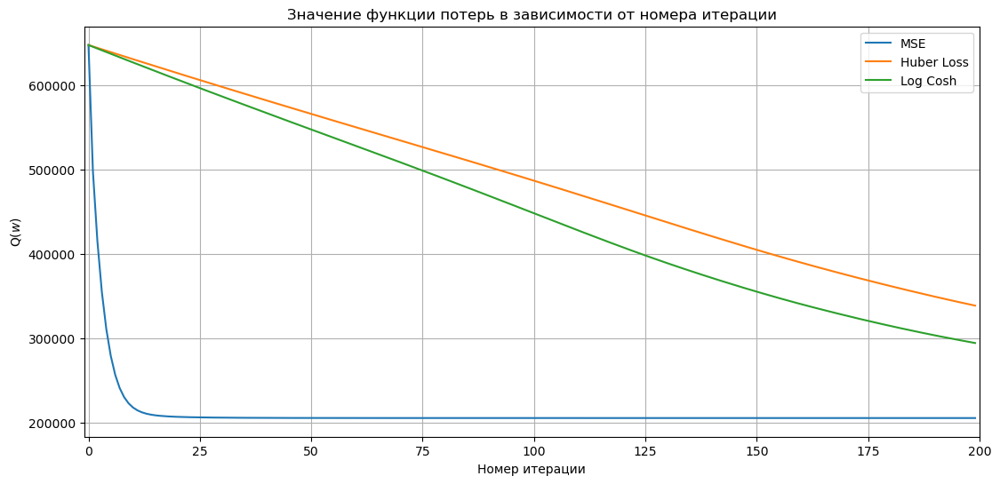

In [1460]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1461]:
num_steps = 1000
errors_mse = np.array(lr_mse_sag_n.rmse_list)[:num_steps]
errors_huber = np.array(lr_hub_sag_n.rmse_list)[:num_steps]  
errors_logcosh = np.array(lr_cos_sag_n.rmse_list)[:num_steps]

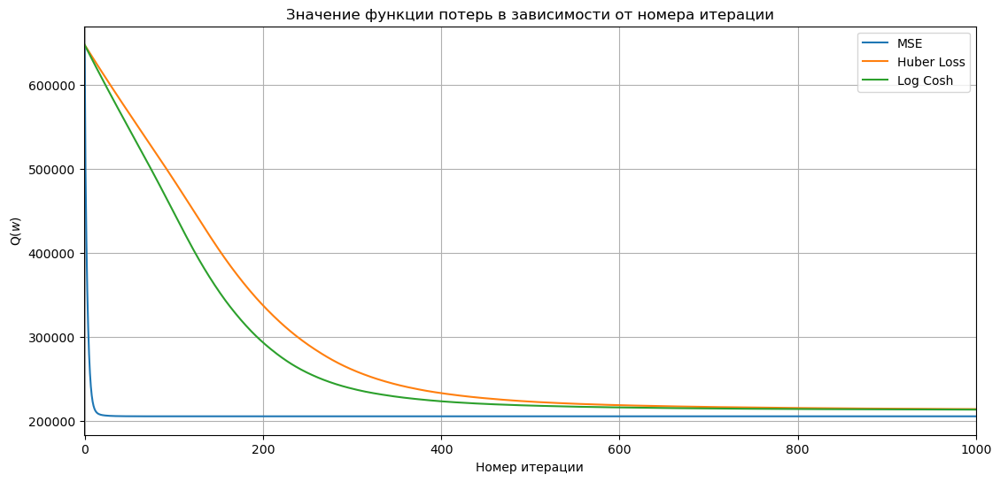

In [1462]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_mse, label="MSE")
plt.plot(range(num_steps), errors_huber, label="Huber Loss")
plt.plot(range(num_steps), errors_logcosh, label="Log Cosh")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [1463]:
num_steps = 200
grad_mse = np.array(lr_mse_sag_n.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sag_n.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sag_n.grad_list)[:num_steps]

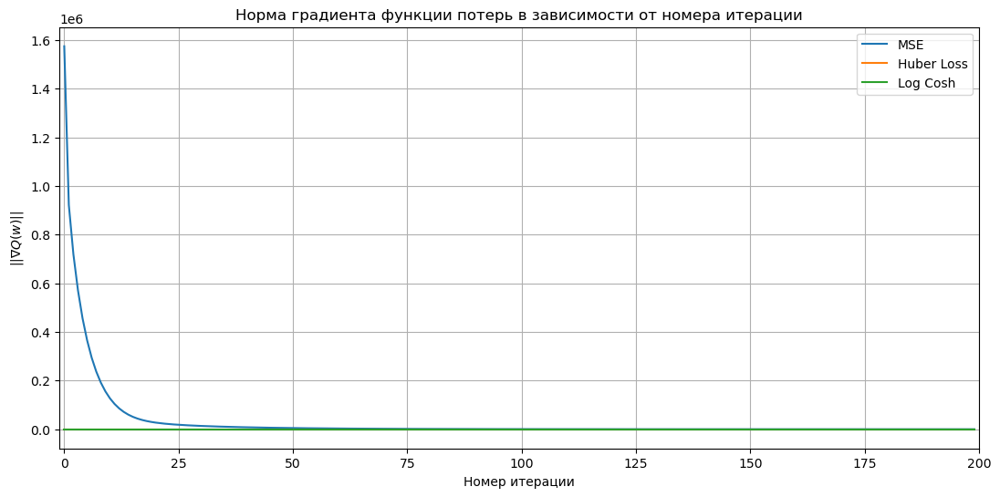

In [1464]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

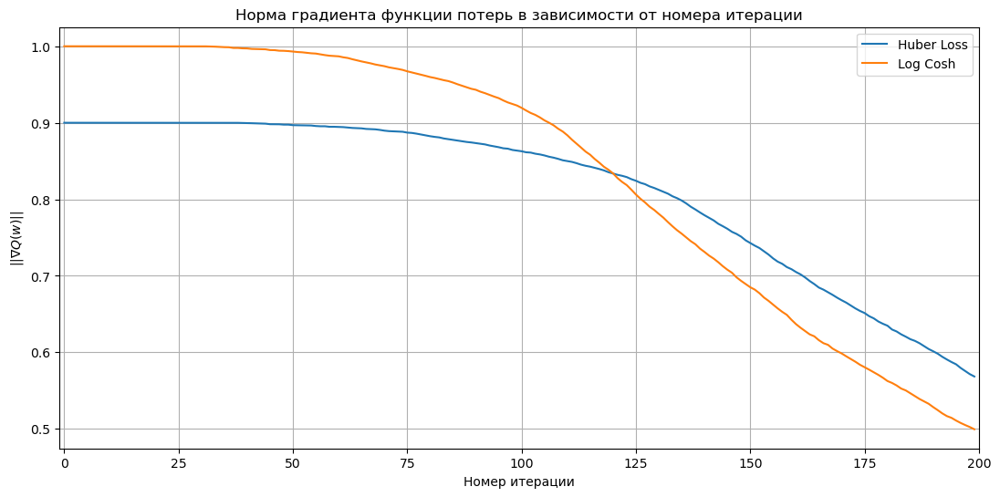

In [1465]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [1466]:
num_steps = 1000
grad_mse = np.array(lr_mse_sag_n.grad_list)[:num_steps]
grad_hub = np.array(lr_hub_sag_n.grad_list)[:num_steps]
grad_cos = np.array(lr_cos_sag_n.grad_list)[:num_steps]

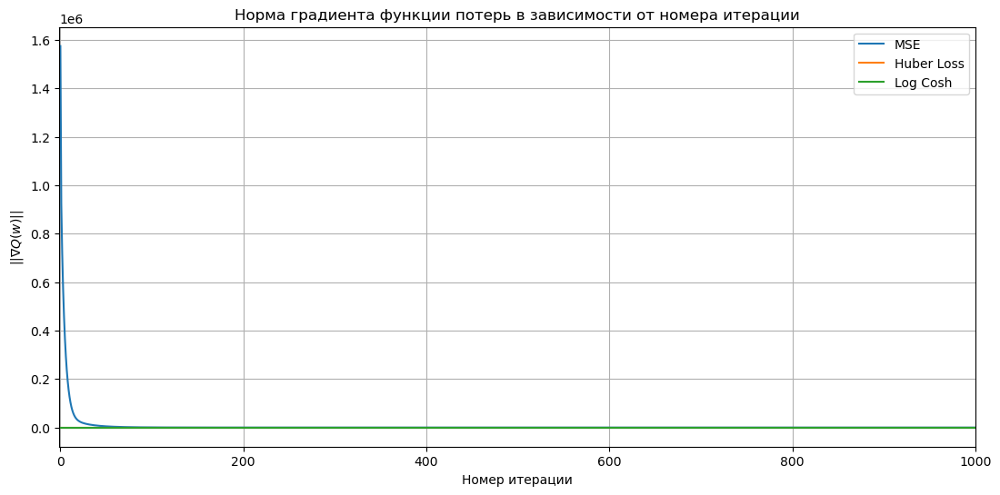

In [1467]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_mse, label="MSE")
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

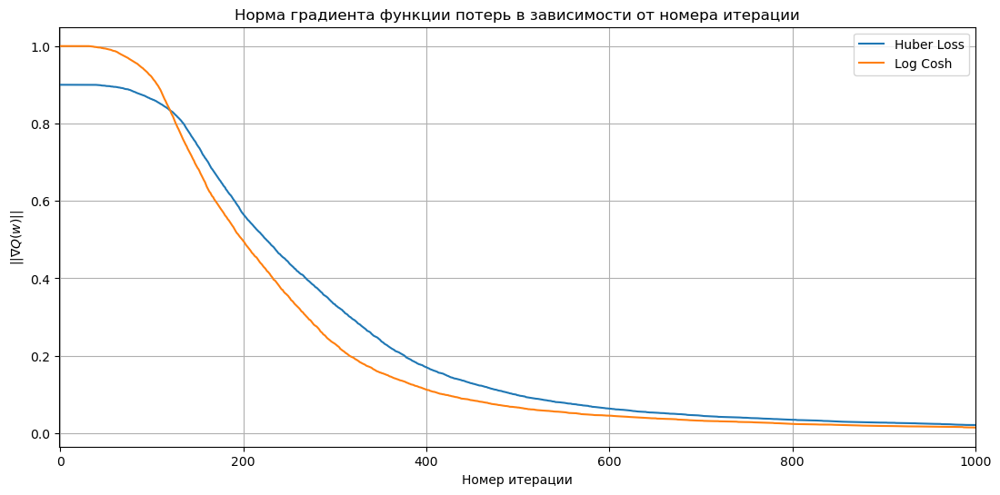

In [1468]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub, label="Huber Loss")
plt.plot(range(num_steps), grad_cos, label="Log Cosh")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

### Общая оценка на масштабированых данных

#### За основу возьмем Huber Loss

### Функции потерь от итерации

In [1469]:
num_steps = 200
errors_huber_m = np.array(lr_hub_gd.deviation_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd_n.deviation_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag_n.deviation_list)[:num_steps]

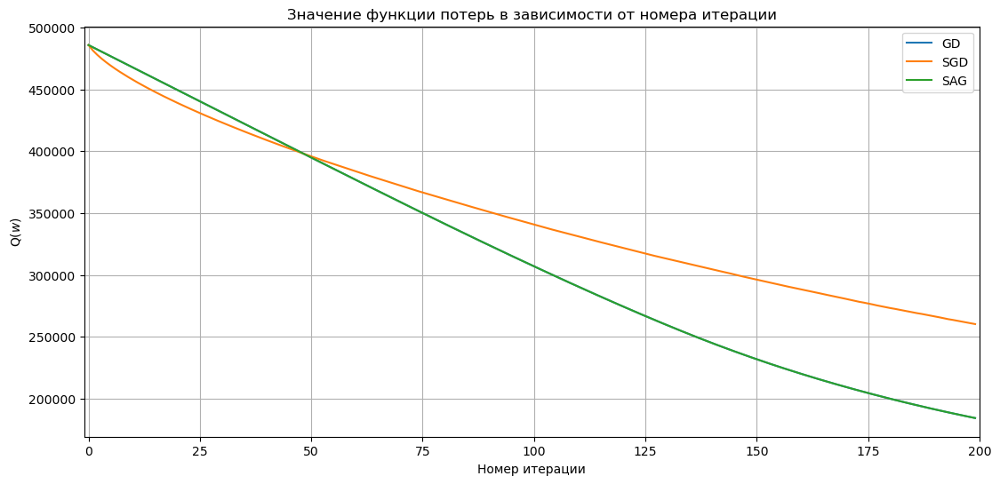

In [1472]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

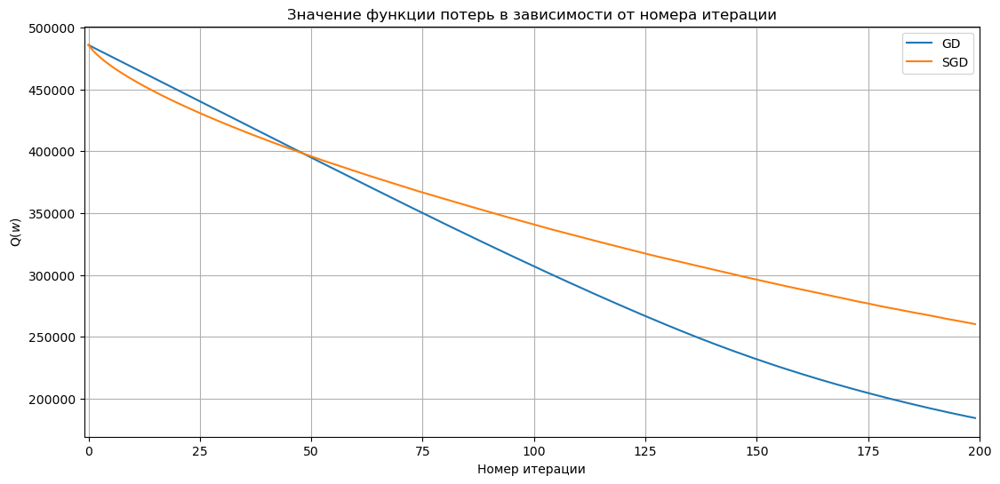

In [1473]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1475]:
num_steps = 200
errors_huber_m = np.array(lr_hub_gd.rmse_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd_n.rmse_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag_n.rmse_list)[:num_steps]

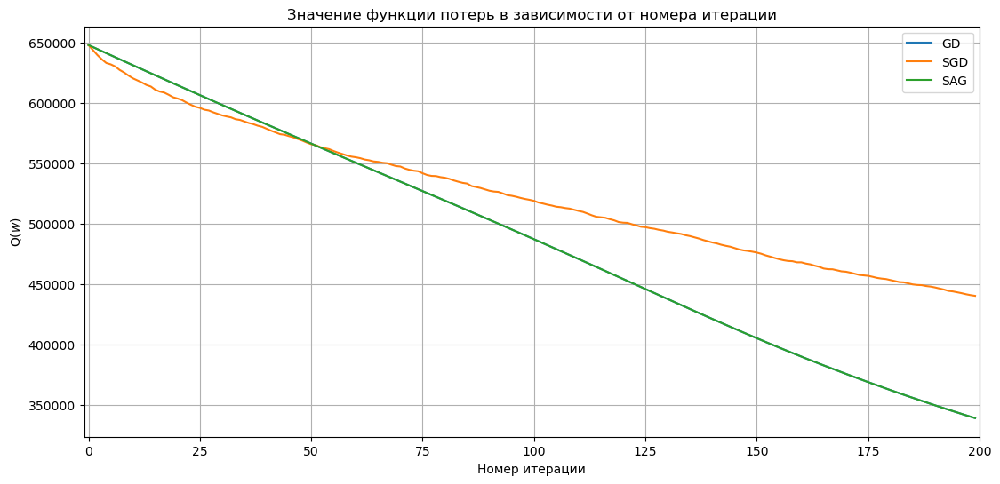

In [1476]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [1480]:
num_steps = 1000
errors_huber_m = np.array(lr_hub_gd.rmse_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd_n.rmse_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag_n.rmse_list)[:num_steps]

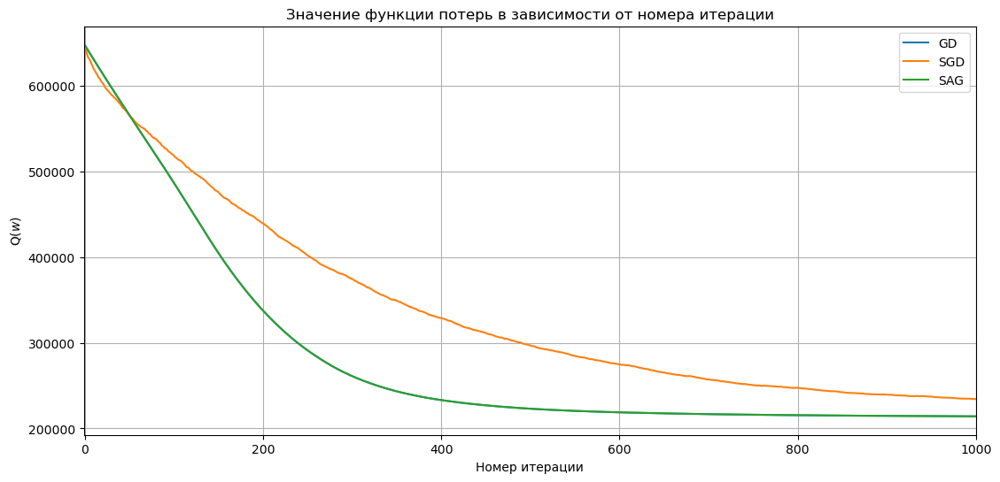

In [1481]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [1477]:
num_steps = 200
grad_hub_m = np.array(lr_hub_gd.grad_list)[:num_steps]
grad_hub_sgd = np.array(lr_hub_sgd_n.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag_n.grad_list)[:num_steps]

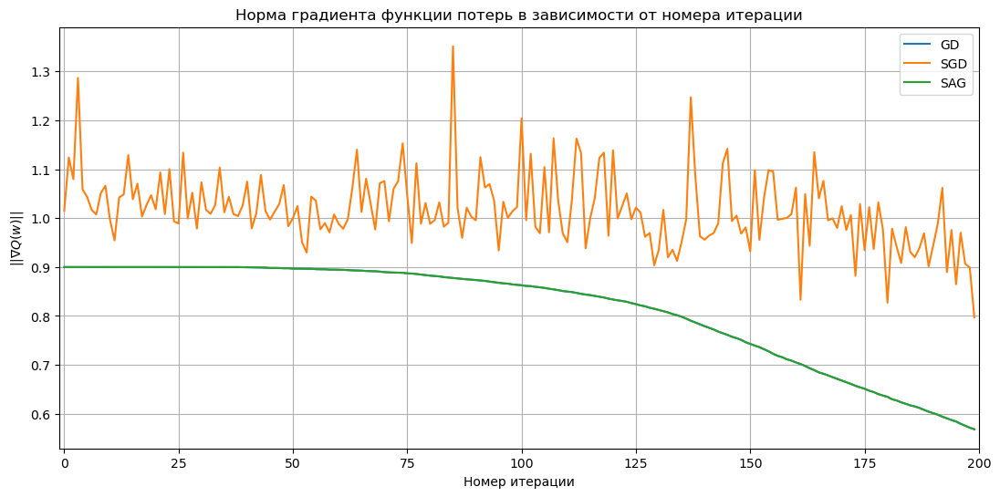

In [1478]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, 200))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [1493]:
num_steps = 1000
grad_hub_m = np.array(lr_hub_gd.grad_list)[:num_steps]
grad_hub_sgd = np.array(lr_hub_sgd_n.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag_n.grad_list)[:num_steps]

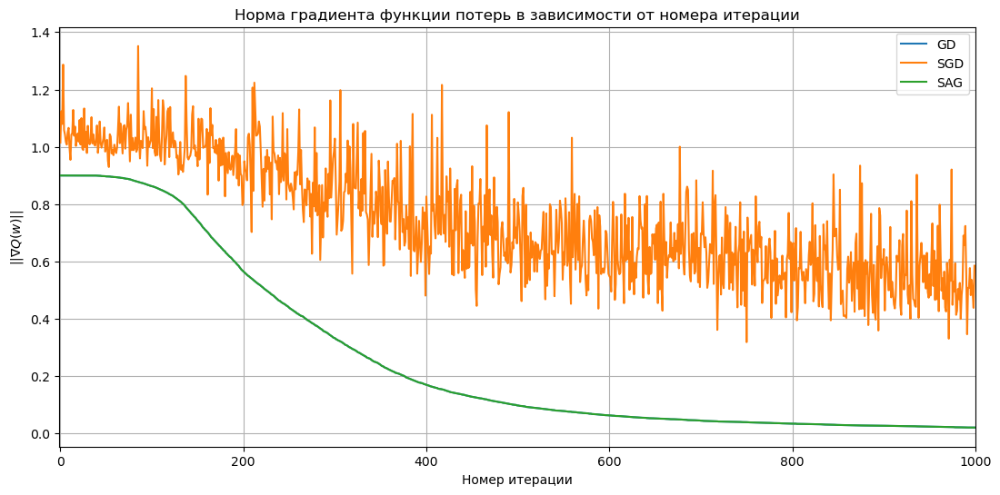

In [1494]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

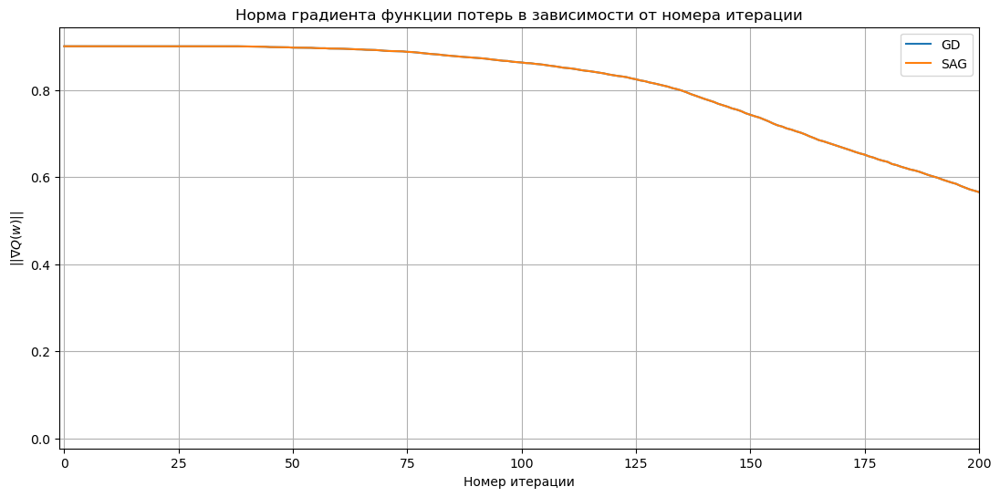

In [1490]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, 200))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

### Оценка времени работы 

#### За основу возьмем Huber Loss

In [2354]:
import time

lr_hub_time_m = LinearRegression(HuberLoss(0.9), lr=2250, method='GD', n_iterations=1000)
lr_hub_time_sgd = LinearRegression(HuberLoss(0.9), lr=5500, method='SGD', batch_size=64, n_iterations=3000)
lr_hub_time_sag = LinearRegression(HuberLoss(0.9), lr=2250, method='SAG', n_iterations=1000)

train_times = {}

# Замеряем время для метода GD
start_time = time.time()
lr_hub_time_m.fit(X_train_n, y_train)
train_times['GD'] = time.time() - start_time

# Замеряем время для метода SGD
start_time = time.time()
lr_hub_time_sgd.fit(X_train_n, y_train)
train_times['SGD'] = time.time() - start_time

# Замеряем время для метода SAG
start_time = time.time()
lr_hub_time_sag.fit(X_train_n, y_train)
train_times['SAG'] = time.time() - start_time

for method, t in train_times.items():
    print(f"Время обучения для {method}: {t:.2f} секунд")

Время обучения для GD: 0.72 секунд
Время обучения для SGD: 0.66 секунд
Время обучения для SAG: 0.67 секунд


In [2355]:
print(r2_score(y_test, lr_hub_time_m.predict(X_test_n)))
print(r2_score(y_test, lr_hub_time_sgd.predict(X_test_n)))
print(r2_score(y_test, lr_hub_time_sag.predict(X_test_n)))

0.6350504967014413
0.6345924997428642
0.6350504967014413


In [2356]:
print(f"Test: {mean_squared_error(y_test, lr_hub_time_sgd.predict(X_test_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_time_sag.predict(X_test_n))**0.5}")

Test: 234064.59146293602
Test: 233917.85872888754


## Подведем итоги второго этапа

### Блок GD

#### MSE

In [1499]:
print(f"Train: {mean_squared_error(y_train, lr_mse_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_gd.predict(X_train_n)), r2_score(y_test, lr_mse_gd.predict(X_test_n)))

Train: 205512.2078443588
Test: 220789.15586788414
0.6707588423137019 0.6748666674735103


#### Huber Loss

In [1500]:
print(f"Train: {mean_squared_error(y_train, lr_hub_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_gd.predict(X_train_n)), r2_score(y_test, lr_hub_gd.predict(X_test_n)))

Train: 214134.3631054448
Test: 233917.85872888754
0.6425530445336936 0.6350504967014413


#### Log Cosh

In [1501]:
print(f"Train: {mean_squared_error(y_train, lr_cos_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_gd.predict(X_train_n)), r2_score(y_test, lr_cos_gd.predict(X_test_n)))

Train: 213500.3285864978
Test: 233270.5784101454
0.6446666537941768 0.637067425211109


### Блок SGD

#### MSE

In [1502]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_sgd_n.predict(X_train_n)), r2_score(y_test, lr_mse_sgd_n.predict(X_test_n)))

Train: 205992.324937857
Test: 221190.81340253013
0.6692187006769139 0.6736826325207721


#### Huber Loss

In [1503]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_sgd_n.predict(X_train_n)), r2_score(y_test, lr_hub_sgd_n.predict(X_test_n)))

Train: 214458.21876531304
Test: 234064.59146293602
0.6414710252232609 0.6345924997428642


#### Log Cosh

In [1504]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_sgd_n.predict(X_train_n)), r2_score(y_test, lr_cos_sgd_n.predict(X_test_n)))

Train: 214355.68969880277
Test: 233952.64776816318
0.6418137572874568 0.6349419356297342


### Блок SAG

#### MSE

In [1505]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_sag_n.predict(X_train_n)), r2_score(y_test, lr_mse_sag_n.predict(X_test_n)))

Train: 205512.2078443588
Test: 220789.15586788414
0.6707588423137019 0.6748666674735103


#### Huber Loss

In [1507]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_sag_n.predict(X_train_n)), r2_score(y_test, lr_hub_sag_n.predict(X_test_n)))

Train: 214134.3631054448
Test: 233917.85872888754
0.6425530445336936 0.6350504967014413


#### Log Cosh

In [1508]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_sag_n.predict(X_train_n)), r2_score(y_test, lr_cos_sag_n.predict(X_test_n)))

Train: 213500.3285864978
Test: 233270.5784101454
0.6446666537941768 0.637067425211109


## Этап 3 
### Регуляризация

Формула функции потерь для MSE с L1 регуляризацией:
$$
Q(w, X, y) = \frac{1}{\ell} \sum\limits_{i=1}^\ell (\langle x_i, w \rangle - y_i)^2 + \lambda \| w \|_1
$$

Матричный вид:

$$
Q(w, X, y) = (Xw - y)^T (Xw - y) + \lambda \| w \|_1
$$

Где $\lambda$ — коэффициент регуляризации

Градиент:

$$
\nabla_w Q(w, X, y) = \frac{2}{\ell} X^T (Xw - y) + \lambda \cdot \text{sign}(w)
$$

In [1514]:
class MSEL1Loss(BaseLoss):
    def __init__(self, coef: float = 1.0) -> None:
        self.coef = coef

    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        mse_loss = np.square(X.dot(w) - y).mean()
        l1 = self.coef * np.sum(np.abs(w[:-1]))
        return mse_loss + l1

    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        grad_w = 2 * X.T @ (X.dot(w) - y) / y.shape[0]
        grad_w[:-1] += self.coef * np.sign(w[:-1])
        return grad_w

    def calc_grad_sag(self, X: np.ndarray, y: float , w: np.ndarray) -> np.ndarray:
        grad_w =  2 * X * (X.dot(w) - y)
        grad_w[:-1] += self.coef * np.sign(w[:-1])
        return grad_w

Формула функции потерь для MSE с L2 регуляризацией:
$$
Q(w, X, y) = \frac{1}{\ell} \sum\limits_{i=1}^\ell (\langle x_i, w \rangle - y_i)^2 + \lambda ||w||^2
$$

Мматричный вид:

$$
Q(w, X, y) = (Xw - y)^T (Xw - y) + \lambda w^T w
$$

Где $\lambda$ — коэффициент регуляризации

Градиент:

$$
\nabla_w Q(w, X, y) = \frac{2}{\ell} X^T(Xw-y) + 2 \lambda w
$$

In [1513]:
class MSEL2Loss(BaseLoss):
    def __init__(self, coef: float = 1.0) -> None:
        self.coef = coef

    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        mse_loss = np.square(X.dot(w) - y).mean()
        l2 = self.coef * np.sum(w[:-1] ** 2)
        return mse_loss + l2

    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        grad_w = 2 * X.T @ (X.dot(w) - y) / y.shape[0]
        grad_w[:-1] += 2 * self.coef * w[:-1]
        return grad_w

    def calc_grad_sag(self, X: np.ndarray, y: float , w: np.ndarray) -> np.ndarray:
        grad_w =  2 * X * (X.dot(w) - y)
        grad_w[:-1] += 2 * self.coef * w[:-1]
        return grad_w

Формула функции потерь для Huber Loss с L1 регуляризацией:
$$ 
L_{\delta}(r) = 
\begin{cases} 
\frac{1}{2}r^2 & \text{если } |r| < \delta, \\
\delta(|r| - \frac{1}{2}\delta) & \text{если } |r| \geq \delta,
\end{cases}
$$

$$
Q_{\delta}(a, X) = \frac{1}{l} \sum_{i=1}^{l} L_{\delta}(y_i - a(x_i)) + \lambda \| w \|_1
$$
Где $\lambda$ — коэффициент регуляризации

Градиент:

$$
\nabla_w Q_{\delta}(w,X,y) = \frac{1}{l}
\begin{cases} 
X^T (Xw - y) + \lambda \cdot \text{sign}(w) & \text{если } |y_i - <xi,w>| < \delta, \\
X^T \cdot \delta \cdot \text{sign}(Xw - y) + \lambda \cdot \text{sign}(w) & \text{если } |y_i - <x_i,w>| \geq \delta
\end{cases}
$$

In [1518]:
class HuberL1Loss(BaseLoss):
    def __init__(self, eps: float, coef: float = 1.0) -> None:
        self.eps = eps
        self.coef = coef

    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        diff = X.dot(w) - y
        result = np.zeros_like(y)
        mask = (diff < self.eps) & (diff > -self.eps)
        result[mask] = diff[mask] ** 2 / 2
        result[~mask] = self.eps * (np.abs(diff[~mask]) - 1 / 2 * self.eps)
        hub_loss = result.mean()
        l1 = self.coef * np.sum(np.abs(w[:-1]))
        return hub_loss + l1
        
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        diff = X.dot(w) - y
        mask = np.abs(diff) < self.eps
        grad_mse = X.T @ (diff * mask)
        grad_mae = X.T @ (self.eps * np.sign(diff) * ~mask)
        grad_w = (grad_mse + grad_mae) / y.shape[0]
        grad_w[:-1] += self.coef * np.sign(w[:-1])
        return grad_w
        
    def calc_grad_sag(self, X: np.ndarray, y: float, w: np.ndarray) -> np.ndarray:
        diff = X.dot(w) - y
        mask = np.abs(diff) < self.eps  
        grad_mse = X * diff * mask
        grad_mae = X * self.eps * np.sign(diff) * ~mask
        grad_w = grad_mse + grad_mae
        grad_w[:-1] += self.coef * np.sign(w[:-1])
        return grad_w

Формула функции потерь для Huber Loss с L2 регуляризацией:
$$ 
L_{\delta}(r) = 
\begin{cases} 
\frac{1}{2}r^2 & \text{если } |r| < \delta, \\
\delta(|r| - \frac{1}{2}\delta) & \text{если } |r| \geq \delta,
\end{cases}
$$

$$
Q_{\delta}(a, X) = \frac{1}{l} \sum_{i=1}^{l} L_{\delta}(y_i - a(x_i)) + \lambda ||w||^2
$$
Где $\lambda$ — коэффициент регуляризации

Градиент:

$$
\nabla_w Q_{\delta}(w,X,y) = \frac{1}{l}
\begin{cases} 
X^T (Xw - y) + 2 \lambda w & \text{если } |y_i - <xi,w>| < \delta, \\
X^T \cdot \delta \cdot \text{sign}(Xw - y) + 2 \lambda w & \text{если } |y_i - <x_i,w>| \geq \delta
\end{cases}
$$

In [1520]:
class HuberL2Loss(BaseLoss):
    def __init__(self, eps: float, coef: float = 1.0) -> None:
        self.eps = eps
        self.coef = coef

    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        diff = X.dot(w) - y
        result = np.zeros_like(y)
        mask = (diff < self.eps) & (diff > -self.eps)
        result[mask] = diff[mask] ** 2 / 2
        result[~mask] = self.eps * (np.abs(diff[~mask]) - 1 / 2 * self.eps)
        hub_loss = result.mean()
        l2 = self.coef * np.sum(w[:-1] ** 2)
        return hub_loss + l2
        
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        diff = X.dot(w) - y
        mask = np.abs(diff) < self.eps
        grad_mse = X.T @ (diff * mask)
        grad_mae = X.T @ (self.eps * np.sign(diff) * ~mask)
        grad_w = (grad_mse + grad_mae) / y.shape[0]
        grad_w[:-1] += 2 * self.coef * w[:-1]
        return grad_w
        
    def calc_grad_sag(self, X: np.ndarray, y: float, w: np.ndarray) -> np.ndarray:
        diff = X.dot(w) - y
        mask = np.abs(diff) < self.eps  
        grad_mse = X * diff * mask
        grad_mae = X * self.eps * np.sign(diff) * ~mask
        grad_w = grad_mse + grad_mae
        grad_w[:-1] += 2 * self.coef * w[:-1]
        return grad_w

Формула функции потерь для Log-Cosh с L1 регуляризацией:
$$
L(y, a) = \log(\cosh(y - a))
$$

$$
Q(w,X,y) = \frac{1}{l} \sum_{i=1}^{l} \log(\cosh(y_i - a(x_i))) + \lambda \| w \|_1
$$
Где $\lambda$ — коэффициент регуляризации

Градиент:

$$
\nabla_w Q(w,X,y) = \frac{1}{l} X^T \tanh(Xw - y) + \lambda \cdot \text{sign}(w)
$$

In [1523]:
class LogCoshL1(BaseLoss):
    def __init__(self, coef: float = 1.0) -> None:
        self.coef = coef
        
    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        errors = X.dot(w) - y
        logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))
        log_loss = logcosh_loss.mean()
        l1 = self.coef * np.sum(np.abs(w[:-1]))
        return log_loss + l1
        
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        grad_w = X.T @ np.tanh(X.dot(w) - y) / y.shape[0]
        grad_w[:-1] += self.coef * np.sign(w[:-1])
        return grad_w

    def calc_grad_sag(self, X: np.ndarray, y: float, w: np.ndarray) -> np.ndarray:
        grad_w = X * np.tanh(X.dot(w) - y) 
        grad_w[:-1] += self.coef * np.sign(w[:-1])
        return grad_w

Формула функции потерь для Log-Cosh с L2 регуляризацией:
$$
L(y, a) = \log(\cosh(y - a))
$$

$$
Q(w,X,y) = \frac{1}{l} \sum_{i=1}^{l} \log(\cosh(y_i - a(x_i))) + \lambda ||w||^2
$$
Где $\lambda$ — коэффициент регуляризации

Градиент:

$$
\nabla_w Q(w,X,y) = \frac{1}{l} X^T \tanh(Xw - y) + 2 \lambda w
$$

In [1526]:
class LogCoshL2(BaseLoss):
    def __init__(self, coef: float = 1.0) -> None:
        self.coef = coef
        
    def calc_loss(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> float:
        errors = X.dot(w) - y
        logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))
        log_loss = logcosh_loss.mean()
        l2 = self.coef * np.sum(w[:-1] ** 2)
        return log_loss + l2
        
    def calc_grad(self, X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
        grad_w = X.T @ np.tanh(X.dot(w) - y) / y.shape[0]
        grad_w[:-1] += 2 * self.coef * w[:-1]
        return grad_w

    def calc_grad_sag(self, X: np.ndarray, y: float, w: np.ndarray) -> np.ndarray:
        grad_w = X * np.tanh(X.dot(w) - y) 
        grad_w[:-1] += 2 * self.coef * w[:-1]
        return grad_w

### Подготовка данных  
Добавим все признаки, которые были удалены ранее

In [1527]:
X_raw_reg = pd.read_csv(
    "kc_house_data.csv",
    na_values=["?"],
)
X_raw_reg.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [1528]:
X_raw_reg = X_raw_reg.drop(columns=['id', 'lat', 'long']) 

In [1529]:
X_raw_reg['date'] = pd.to_datetime(X_raw_reg['date'])
X_raw_reg['year'] = X_raw_reg['date'].dt.year
X_raw_reg['month'] = X_raw_reg['date'].dt.month
X_raw_reg['day'] = X_raw_reg['date'].dt.day
del X_raw_reg['date']

In [1530]:
X_raw_reg.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,year,month,day
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,1340,5650,2014,10,13
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,1690,7639,2014,12,9
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,2720,8062,2015,2,25
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,1360,5000,2014,12,9
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,1800,7503,2015,2,18


In [1531]:
feature = X_raw_reg['bedrooms']
max_point = 5
X_raw_reg['bedrooms_before'] = np.where(feature <= max_point, feature, 0)
X_raw_reg['bedrooms_after'] = np.where(feature > max_point, feature, 0)

In [1532]:
feature = X_raw_reg['floors']
max_point1 = 1.5
max_point2 = 2
X_raw_reg['floors_1'] = np.where(feature <= max_point1, feature, 0)
X_raw_reg['floors_2'] = np.where(((feature > max_point1) & (feature <= max_point2)), feature, 0)
X_raw_reg['floors_3'] = np.where(feature > max_point2, feature, 0)

In [1533]:
X_raw_reg['floors_1_p'] = np.where(X_raw_reg['floors_1'] != 0, 1 / X_raw_reg['floors_1'], X_raw_reg['floors_1'])
X_raw_reg['floors_2_p'] = X_raw_reg['floors_2'] ** 2
X_raw_reg['floors_3_p'] = np.where(X_raw_reg['floors_3'] != 0, 1 / X_raw_reg['floors_3'], X_raw_reg['floors_3'])

X_raw_reg['bedrooms_before_p'] = X_raw_reg['bedrooms_before'] ** 2
X_raw_reg['bedrooms_after_p'] = np.where(X_raw_reg['bedrooms_after'] != 0, 1 / X_raw_reg['bedrooms_after'], X_raw_reg['bedrooms_after'])

X_raw_reg['grade_p'] = np.power(X_raw_reg['grade'], 2.5)

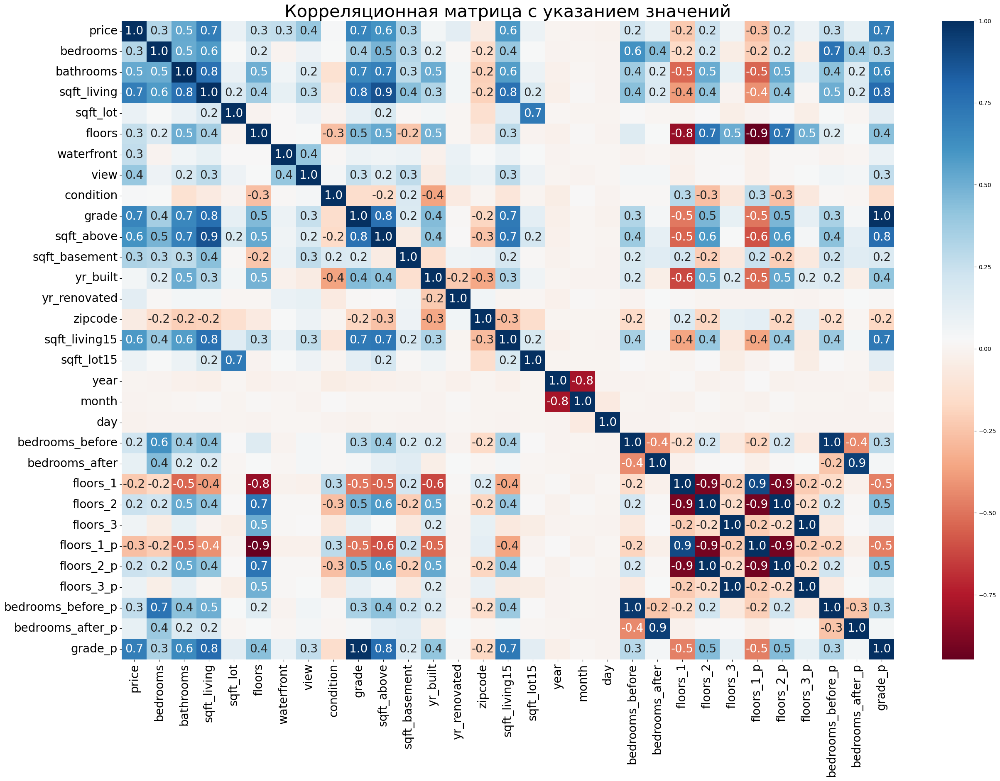

In [1535]:
colormap = plt.cm.RdBu
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.heatmap(X_raw_reg.corr(), ax=ax, annot=True, cmap=colormap, linecolor="white", fmt="0.1f")
ax.set_title('Корреляционная матрица с указанием значений', fontsize=30)
for t in ax.texts:
    if float(t.get_text()) >= 0.2 or float(t.get_text()) <= -0.2:
        t.set_text(t.get_text())
        t.set_fontsize(20)
    else:
        t.set_text("")
plt.xticks(fontsize=20,rotation=90)
plt.yticks(fontsize=20)
plt.show()

In [1537]:
X_raw_reg.corr()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,bedrooms_after,floors_1,floors_2,floors_3,floors_1_p,floors_2_p,floors_3_p,bedrooms_before_p,bedrooms_after_p,grade_p
price,1.000000,0.308350,0.525138,0.702035,0.089661,0.256794,0.266369,0.397293,0.036362,0.667434,...,0.103059,-0.228065,0.232662,0.069216,-0.269912,0.232662,0.083606,0.268495,0.104197,0.701728
bedrooms,0.308350,1.000000,0.515884,0.576671,0.031703,0.175429,-0.006582,0.079532,0.028472,0.356967,...,0.447039,-0.168565,0.219795,-0.048621,-0.216105,0.219795,-0.035682,0.744349,0.385341,0.337480
bathrooms,0.525138,0.515884,1.000000,0.754665,0.087740,0.500653,0.063744,0.187737,-0.124982,0.664983,...,0.168235,-0.533109,0.517683,0.109603,-0.543593,0.517683,0.114725,0.427752,0.169179,0.648712
sqft_living,0.702035,0.576671,0.754665,1.000000,0.172826,0.353949,0.103818,0.284611,-0.058753,0.762704,...,0.172576,-0.387086,0.420018,-0.008815,-0.415711,0.420018,0.007790,0.501349,0.176061,0.773407
sqft_lot,0.089661,0.031703,0.087740,0.172826,1.000000,-0.005201,0.021604,0.074710,-0.008958,0.113621,...,0.007488,-0.000865,0.019461,-0.039082,-0.007925,0.019461,-0.035414,0.029126,0.009535,0.126027
floors,0.256794,0.175429,0.500653,0.353949,-0.005201,1.000000,0.023698,0.029444,-0.263768,0.458183,...,0.031172,-0.823025,0.735194,0.509271,-0.946997,0.735194,0.497513,0.159589,0.031035,0.435776
waterfront,0.266369,-0.006582,0.063744,0.103818,0.021604,0.023698,1.000000,0.401857,0.016653,0.082775,...,0.005223,-0.013326,0.014147,0.011695,-0.021469,0.014147,0.011718,-0.005937,0.007096,0.094677
view,0.397293,0.079532,0.187737,0.284611,0.074710,0.029444,0.401857,1.000000,0.045990,0.251321,...,0.042050,-0.019520,0.014185,0.023582,-0.025531,0.014185,0.026758,0.063160,0.046927,0.266522
condition,0.036362,0.028472,-0.124982,-0.058753,-0.008958,-0.263768,0.016653,0.045990,1.000000,-0.144674,...,0.013730,0.300121,-0.267325,-0.086837,0.278281,-0.267325,-0.079125,0.017718,0.010759,-0.142404
grade,0.667434,0.356967,0.664983,0.762704,0.113621,0.458183,0.082775,0.251321,-0.144674,1.000000,...,0.044897,-0.485230,0.469782,0.104754,-0.496391,0.469782,0.111816,0.341960,0.048064,0.985267


In [2144]:
corr_matrix = X_raw_reg.corr()
correlations_with_price = corr_matrix['price'].iloc[1:]
mask = correlations_with_price.abs() > 0.3
filtered_correlations_best = correlations_with_price[mask]
corr_target = filtered_correlations_best.reset_index()
corr_target.columns = ['Feature', 'Correlation']
print(corr_target)

         Feature  Correlation
0       bedrooms     0.308350
1      bathrooms     0.525138
2    sqft_living     0.702035
3           view     0.397293
4          grade     0.667434
5     sqft_above     0.605567
6  sqft_basement     0.323816
7  sqft_living15     0.585379
8        grade_p     0.701728


In [2145]:
filtered_correlations_n = correlations_with_price[~mask]
no_corr_target = filtered_correlations_n.reset_index()
no_corr_target.columns = ['Feature', 'Correlation']
print(no_corr_target)

              Feature  Correlation
0            sqft_lot     0.089661
1              floors     0.256794
2          waterfront     0.266369
3           condition     0.036362
4            yr_built     0.054012
5        yr_renovated     0.126434
6             zipcode    -0.053203
7          sqft_lot15     0.082447
8                year     0.003576
9               month    -0.010081
10                day    -0.014670
11    bedrooms_before     0.220267
12     bedrooms_after     0.103059
13           floors_1    -0.228065
14           floors_2     0.232662
15           floors_3     0.069216
16         floors_1_p    -0.269912
17         floors_2_p     0.232662
18         floors_3_p     0.083606
19  bedrooms_before_p     0.268495
20   bedrooms_after_p     0.104197


In [1555]:
X_reg = X_raw_reg.drop(columns=['price'])

In [2232]:
correlation_matrix = X_reg.corr()
high_corr_threshold = 0.7
high_corr = correlation_matrix[(correlation_matrix.abs() > high_corr_threshold) & (correlation_matrix != 1)]
high_corr_pairs = correlation_matrix.unstack().reset_index()
high_corr_pairs.columns = ['Feature_1', 'Feature_2', 'Correlation']
high_corr_pairs = high_corr_pairs[
    (high_corr_pairs['Feature_1'] != high_corr_pairs['Feature_2']) & 
    (high_corr_pairs['Correlation'].abs() > high_corr_threshold)
]
high_corr_pairs = high_corr_pairs.drop_duplicates(subset=['Correlation'])
high_corr_pairs = high_corr_pairs.reset_index()
print(high_corr_pairs)

    index        Feature_1          Feature_2  Correlation
0      27         bedrooms  bedrooms_before_p     0.744349
1      32        bathrooms        sqft_living     0.754665
2      68      sqft_living              grade     0.762704
3      69      sqft_living         sqft_above     0.876597
4      74      sqft_living      sqft_living15     0.756420
5      89      sqft_living            grade_p     0.773407
6     105         sqft_lot         sqft_lot15     0.718557
7     141           floors           floors_1    -0.823025
8     142           floors           floors_2     0.735194
9     144           floors         floors_1_p    -0.946997
10    249            grade         sqft_above     0.755923
11    254            grade      sqft_living15     0.713202
12    269            grade            grade_p     0.985267
13    284       sqft_above      sqft_living15     0.731870
14    299       sqft_above            grade_p     0.768705
15    449    sqft_living15            grade_p     0.7200

In [2171]:
y_reg = X_raw_reg['price']
X_reg = X_raw_reg.drop('price', axis=1)

In [1707]:
X_reg = X_reg.values
y_reg = y_reg.values
X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(X_reg,y_reg,test_size=0.3,random_state=68)

In [1708]:
normalizer = StandardScaler()
X_train_reg_n = normalizer.fit_transform(X_train_reg)
X_test_reg_n = normalizer.transform(X_test_reg)

### Обучение  
Обучим каждую модель с L1 и L2  
$\lambda$ подберем по CV

### MSE

#### GD

In [1858]:
lr_mse_gd_1 = LinearRegressionStats(MSEL1Loss(1000), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_1.fit(X_train_reg_n, y_train_reg)
print(lr_mse_gd_1.iteration)
lr_mse_gd_1.w

1000


array([-1.59575370e+03,  3.85138714e+04,  7.92654156e+04, -1.39884988e+03,
        6.79517760e+03,  4.73457718e+04,  3.34323866e+04,  1.49039683e+04,
       -1.30858801e+05,  3.15236987e+04,  2.72492071e+04, -9.00809982e+04,
        5.86765000e+03,  1.05813696e+01,  1.84391978e+04, -1.39467897e+04,
        1.29669745e+04,  1.26589163e+03, -3.49398808e+03, -3.87656991e+04,
       -7.56757948e+01,  2.48430580e+03,  1.77905789e+01,  1.12043467e+04,
       -8.63908748e+00,  1.77905483e+01,  9.49982447e+03,  1.47217637e+04,
       -2.04122501e+04,  2.91060449e+05,  5.40823796e+05])

In [1859]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_gd_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_gd_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_gd_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_gd_1.predict(X_test_reg_n)))

Train: 205407.75394761612
Test: 213671.69942661654
0.6875341725037383 0.6597410749814491


In [1744]:
lr_mse_gd_2 = LinearRegressionStats(MSEL2Loss(0.05), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_2.fit(X_train_reg_n, y_train_reg)
print(lr_mse_gd_2.iteration)
lr_mse_gd_2.w

1000


array([-16116.93158921,  34100.7633256 ,  65024.47249307,  -1390.16118075,
         6355.74995445,  46526.88221172,  35412.13362833,  14856.18190651,
        18839.19873126,  53772.56745329,  34953.95245257, -86038.55207736,
         6784.3493029 ,   2012.70300431,  22911.96681477, -12909.83695759,
        13436.94325089,   1944.86294056,  -3633.96908978, -23789.0149654 ,
         7959.69916759,   3859.28832175,  -3302.10842519,   8099.34080212,
        -3554.88915988,  -3302.10842519,  10578.6765138 ,  10986.1626884 ,
       -15565.74172881, 131121.72427153, 540823.79635136])

In [1745]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_gd_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_gd_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_gd_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_gd_2.predict(X_test_reg_n)))

Train: 208135.99217274287
Test: 215994.10949622584
0.6791786693478576 0.6523042901060816


In [1703]:
lr_mse_gd.w

array([ 33575.17833721,  59692.19288893,   1956.52070142,  52694.72361511,
        27574.53452072,  15222.36009474,  47882.43006762,  33635.83723562,
       -99145.56415226,   6333.96678472,  -2607.99375086,  23050.4165873 ,
       -14873.52877029,  14153.14329388,   1700.91405805,  -2475.56220736,
       -11174.2900372 ,  -5739.0699701 ,  20288.72097815, -21321.44433145,
       -11358.32654578, 159453.28059129, 539978.56666004])

In [1716]:
print(f"Train: {mean_squared_error(y_train, lr_mse_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_gd.predict(X_train_n)), r2_score(y_test, lr_mse_gd.predict(X_test_n)))

Train: 205512.2078443588
Test: 220789.15586788414
0.6707588423137019 0.6748666674735103


In [2101]:
lr_mse_gd_a = LinearRegressionStats(MSELoss(), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_a.fit(X_train_reg_n, y_train_reg)
print(lr_mse_gd_a.iteration)
lr_mse_gd_a.w

1000


array([ -28841.54718144,   40304.73614054,   60004.17292912,
         -1997.62704579,    9669.45213616,   47327.10942141,
         33259.60513549,   16202.1963853 , -160140.19285969,
         47308.3556742 ,   36556.53077222,  -87747.32797237,
          6836.73533421,    -769.75100245,   19522.15965774,
        -14481.12853029,   15192.04510239,    3411.331027  ,
         -3838.86247003,  -53270.71947656,   25779.52501551,
          5482.84230546,   -2560.17082739,    8436.63573023,
         -5551.713534  ,   -2560.17085798,    9898.72389911,
         51917.33953729,  -31295.50218709,  319384.8741706 ,
        540823.79635134])

In [2102]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_gd_a.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_gd_a.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_gd_a.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_gd_a.predict(X_test_reg_n)))

Train: 205150.8434471334
Test: 213676.42040853016
0.6883153070886812 0.6597260390737352


Решил проверить на готовых моделях

In [1865]:
from sklearn.linear_model import Lasso, Ridge
lz = Lasso(alpha=1000, max_iter=1000).fit(X_train_reg_n, y_train_reg)
print(f"Train: {mean_squared_error(y_train_reg, lz.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lz.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lz.predict(X_train_reg_n)), r2_score(y_test_reg, lz.predict(X_test_reg_n)))

Train: 205717.75786080046
Test: 213859.094499911
0.6865903062397067 0.6591439832082553


In [1870]:
lz.coef_

array([ -26273.79937063,   40508.99345197,   59096.45989999,
         -2021.84545013,  145249.8339348 ,   47238.19247407,
         33129.41226519,   16443.25201693, -182783.8772436 ,
         46132.30460521,   36859.80823973,  -86739.84347896,
          7108.05818689,    -677.11697431,   19756.9857665 ,
        -14538.00926293,   15153.17886846,    3430.86350943,
         -3865.02419265,  -48805.90697955,   23783.93965695,
         52543.52404909,   79091.01632808,  -47611.92137155,
        232217.66865011,   79091.01632632,   87363.13234904,
         46321.61517776,  -29728.91841592,  342250.68008466])

In [1868]:
lz = Ridge(alpha=0.05, max_iter=1000).fit(X_train_reg_n, y_train_reg)
print(f"Train: {mean_squared_error(y_train_reg, lz.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lz.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lz.predict(X_train_reg_n)), r2_score(y_test_reg, lz.predict(X_test_reg_n)))

Train: 205118.43369584923
Test: 213716.98949620075
0.6884137792692373 0.6595968164424959


In [1869]:
lz.coef_

array([ -26273.79937063,   40508.99345197,   59096.45989999,
         -2021.84545013,  145249.8339348 ,   47238.19247407,
         33129.41226519,   16443.25201693, -182783.8772436 ,
         46132.30460521,   36859.80823973,  -86739.84347896,
          7108.05818689,    -677.11697431,   19756.9857665 ,
        -14538.00926293,   15153.17886846,    3430.86350943,
         -3865.02419265,  -48805.90697955,   23783.93965695,
         52543.52404909,   79091.01632808,  -47611.92137155,
        232217.66865011,   79091.01632632,   87363.13234904,
         46321.61517776,  -29728.91841592,  342250.68008466])

#### SGD

In [1861]:
lr_mse_sgd_n_1 = LinearRegressionStats(MSEL1Loss(1000), lr=0.01, method='SGD', batch_size=64, n_iterations=3000)
lr_mse_sgd_n_1.fit(X_train_reg_n, y_train_reg)
print(lr_mse_sgd_n_1.iteration)
lr_mse_sgd_n_1.w

3000


array([-1.36241948e+04,  3.34623496e+04,  7.01675452e+04, -7.09855550e+02,
        6.35373782e+03,  4.64142613e+04,  3.62672543e+04,  1.61693935e+04,
        5.08776619e+04,  5.76877438e+04,  3.56633629e+04, -8.95876960e+04,
        6.46969132e+03,  1.97097263e+03,  2.60649682e+04, -1.39349922e+04,
        1.27874016e+04,  2.55852804e+02, -3.70582975e+03, -1.49714391e+04,
        5.05988223e+02,  5.15139954e+03, -2.67951953e+03,  8.05745491e+03,
       -1.98586770e+03, -2.67951956e+03,  1.18780438e+04, -4.21343538e+02,
       -8.30990949e+03,  1.00441545e+05,  5.41266215e+05])

In [1862]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_sgd_n_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_sgd_n_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_sgd_n_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_sgd_n_1.predict(X_test_reg_n)))

Train: 209188.9298364525
Test: 216672.88235196413
0.6759244573481367 0.650115552257948


In [1795]:
lr_mse_sgd_n_2 = LinearRegressionStats(MSEL2Loss(0.001), lr=0.01, method='SGD', batch_size=64, n_iterations=3000)
lr_mse_sgd_n_2.fit(X_train_reg_n, y_train_reg)
print(lr_mse_sgd_n_2.iteration)
lr_mse_sgd_n_2.w

3000


array([-1.41386538e+04,  3.42795074e+04,  7.00427902e+04, -5.40407091e+02,
        7.51150430e+03,  4.66469395e+04,  3.61110131e+04,  1.66822104e+04,
        5.09789800e+04,  5.86706259e+04,  3.62601379e+04, -8.96928887e+04,
        6.83719366e+03,  2.24229637e+03,  2.67346002e+04, -1.48896797e+04,
        1.34250458e+04,  7.56811215e+02, -4.17749938e+03, -1.58308704e+04,
        1.55104819e+03,  6.71899876e+03, -4.01423756e+03,  7.65064974e+03,
       -4.69737859e+03, -4.01423759e+03,  1.14442659e+04, -8.66983169e+02,
       -1.01627450e+04,  1.00137472e+05,  5.41261507e+05])

In [1798]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_sgd_n_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_sgd_n_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_sgd_n_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_sgd_n_2.predict(X_test_reg_n)))

Train: 209190.99055750456
Test: 216615.39552549727
0.6759180723775446 0.6503011876550597


In [1789]:
lr_mse_sgd_n.w

array([ 2.91715597e+04,  6.50171166e+04,  9.68896322e+02,  5.45466270e+04,
        3.22084950e+04,  1.63855639e+04,  5.45398797e+04,  3.21439496e+04,
       -8.92246638e+04,  9.46422624e+03,  2.15311764e+03,  3.22156432e+04,
       -1.40896910e+04,  1.12107179e+04,  1.06632023e+02, -4.32703457e+03,
       -9.58903091e+03, -5.13623096e+03,  2.07388078e+04, -2.12909051e+04,
       -1.31173105e+04,  1.44230312e+05,  5.40104664e+05])

In [1820]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_sgd_n.predict(X_train_n)), r2_score(y_test, lr_mse_sgd_n.predict(X_test_n)))

Train: 205992.324937857
Test: 221190.81340253013
0.6692187006769139 0.6736826325207721


In [2105]:
lr_mse_sgd_a = LinearRegressionStats(MSELoss(), lr=0.01, method='SGD', batch_size=64, n_iterations=3000)
lr_mse_sgd_a.fit(X_train_reg_n, y_train_reg)
print(lr_mse_sgd_a.iteration)
lr_mse_sgd_a.w

3000


array([-1.41753302e+04,  3.43128736e+04,  7.00901461e+04, -5.36617055e+02,
        7.51348362e+03,  4.66792635e+04,  3.60914534e+04,  1.66718439e+04,
        5.09549255e+04,  5.87181768e+04,  3.62699904e+04, -8.98531789e+04,
        6.80926660e+03,  2.21348691e+03,  2.66882465e+04, -1.49243902e+04,
        1.34499764e+04,  7.71547925e+02, -4.17997783e+03, -1.58739879e+04,
        1.55728342e+03,  6.71979482e+03, -4.01507594e+03,  7.65324078e+03,
       -4.70080865e+03, -4.01507597e+03,  1.14550110e+04, -8.66265548e+02,
       -1.02066737e+04,  1.00263083e+05,  5.41261480e+05])

In [2106]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_sgd_a.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_sgd_a.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_sgd_a.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_sgd_a.predict(X_test_reg_n)))

Train: 209186.4194527853
Test: 216605.13593449784
0.6759322354754812 0.6503343125565927


#### SAG

In [1860]:
lr_mse_sag_n_1 = LinearRegressionStats(MSEL1Loss(1000), lr=0.1, method='SAG', n_iterations=1000)
lr_mse_sag_n_1.fit(X_train_reg_n, y_train_reg)
print(lr_mse_sag_n_1.iteration)
lr_mse_sag_n_1.w

1000


array([-1.59575370e+03,  3.85138714e+04,  7.92654156e+04, -1.39884988e+03,
        6.79517760e+03,  4.73457718e+04,  3.34323866e+04,  1.49039683e+04,
       -1.30858801e+05,  3.15236987e+04,  2.72492071e+04, -9.00809982e+04,
        5.86765000e+03,  1.05813696e+01,  1.84391978e+04, -1.39467897e+04,
        1.29669745e+04,  1.26589163e+03, -3.49398808e+03, -3.87656991e+04,
       -7.56757948e+01,  2.48430580e+03,  1.77905789e+01,  1.12043467e+04,
       -8.63908748e+00,  1.77905483e+01,  9.49982447e+03,  1.47217637e+04,
       -2.04122501e+04,  2.91060449e+05,  5.40823796e+05])

In [1863]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_sag_n_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_sag_n_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_sag_n_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_sag_n_1.predict(X_test_reg_n)))

Train: 205407.75394761612
Test: 213671.69942661654
0.6875341725037383 0.6597410749814491


In [1817]:
lr_mse_sag_n_2 = LinearRegressionStats(MSEL2Loss(0.005), lr=0.1, method='SAG', n_iterations=1000)
lr_mse_sag_n_2.fit(X_train_reg_n, y_train_reg)
print(lr_mse_sag_n_2.iteration)
lr_mse_sag_n_2.w

1000


array([-2.62096881e+04,  3.90298137e+04,  6.21348091e+04, -1.83294227e+03,
        8.37979529e+03,  4.74503792e+04,  3.37447798e+04,  1.55027260e+04,
       -1.03568242e+05,  4.99464053e+04,  3.60724019e+04, -8.94431128e+04,
        6.32944605e+03, -4.35319132e+02,  1.96071909e+04, -1.42664719e+04,
        1.50646444e+04,  3.25246016e+03, -3.78541624e+03, -4.68899386e+04,
        2.17886913e+04,  4.35371767e+03, -2.78351832e+03,  8.67943196e+03,
       -4.58279529e+03, -2.78351833e+03,  9.98801795e+03,  4.21308351e+04,
       -2.82923316e+04,  2.61254992e+05,  5.40823796e+05])

In [1818]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_sag_n_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_sag_n_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_sag_n_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_sag_n_2.predict(X_test_reg_n)))

Train: 205514.45668936823
Test: 213763.2335015639
0.6872094562295303 0.6594494878677787


In [1819]:
lr_mse_sag_n.w

array([ 33575.17833721,  59692.19288893,   1956.52070142,  52694.72361511,
        27574.53452072,  15222.36009474,  47882.43006762,  33635.83723562,
       -99145.56415226,   6333.96678472,  -2607.99375086,  23050.4165873 ,
       -14873.52877029,  14153.14329388,   1700.91405805,  -2475.56220736,
       -11174.2900372 ,  -5739.0699701 ,  20288.72097815, -21321.44433145,
       -11358.32654578, 159453.28059129, 539978.56666004])

In [1821]:
print(f"Train: {mean_squared_error(y_train, lr_mse_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_mse_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_mse_sag_n.predict(X_train_n)), r2_score(y_test, lr_mse_sag_n.predict(X_test_n)))

Train: 205512.2078443588
Test: 220789.15586788414
0.6707588423137019 0.6748666674735103


In [2107]:
lr_mse_sag_a = LinearRegressionStats(MSELoss(), lr=0.1, method='SAG', n_iterations=1000)
lr_mse_sag_a.fit(X_train_reg_n, y_train_reg)
print(lr_mse_sag_a.iteration)
lr_mse_sag_a.w

1000


array([ -28841.54718144,   40304.73614054,   60004.17292912,
         -1997.62704579,    9669.45213616,   47327.10942141,
         33259.60513549,   16202.1963853 , -160140.19285969,
         47308.3556742 ,   36556.53077222,  -87747.32797237,
          6836.73533421,    -769.75100245,   19522.15965774,
        -14481.12853029,   15192.04510239,    3411.331027  ,
         -3838.86247003,  -53270.71947656,   25779.52501551,
          5482.84230546,   -2560.17082739,    8436.63573023,
         -5551.713534  ,   -2560.17085798,    9898.72389911,
         51917.33953729,  -31295.50218709,  319384.8741706 ,
        540823.79635134])

In [2108]:
print(f"Train: {mean_squared_error(y_train_reg, lr_mse_sag_a.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_mse_sag_a.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_mse_sag_a.predict(X_train_reg_n)), r2_score(y_test_reg, lr_mse_sag_a.predict(X_test_reg_n)))

Train: 205150.8434471334
Test: 213676.42040853016
0.6883153070886812 0.6597260390737352


### Вывод по MSE  
Регуляризация ухудшила модель, т.к под влиянием выбросов штрафовала ошибочно

### Huber Loss

#### GD

In [1967]:
lr_hub_gd_1 = LinearRegressionStats(HuberL1Loss(0.9, 0.001), lr=2250, method='GD', n_iterations=1500)
lr_hub_gd_1.fit(X_train_reg_n, y_train_reg)
print(lr_hub_gd_1.iteration)
lr_hub_gd_1.w

1320


array([-1.14440308e+04,  2.44400841e+04,  4.21361384e+04,  9.01326247e+01,
        1.36507526e+04,  4.23179619e+04,  2.89525728e+04,  1.43840718e+04,
        5.67368480e+04,  2.90212883e+04,  3.12308036e+04, -8.05946707e+04,
        4.58553362e+03,  5.75978952e+03,  3.56869051e+04, -5.54186851e+03,
        8.75713988e+03, -2.66801558e+01, -1.40739225e+03, -1.31843254e+04,
        3.60407803e+02,  6.61169056e+03,  4.60513936e-02,  6.77224843e+03,
       -8.37625963e+03,  4.60207996e-02,  7.17073629e+03,  1.94378558e+03,
       -5.86510006e+03,  8.07450510e+04,  5.19234363e+05])

In [1968]:
print(f"Train: {mean_squared_error(y_train_reg, lr_hub_gd_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_hub_gd_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_hub_gd_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_hub_gd_1.predict(X_test_reg_n)))

Train: 217592.17292725318
Test: 225595.56156319406
0.6493648916663046 0.6207054354025574


In [1969]:
lr_hub_gd_2 = LinearRegressionStats(HuberL2Loss(0.9, 1e-10), lr=2250, method='GD', n_iterations=1500)
lr_hub_gd_2.fit(X_train_reg_n, y_train_reg)
print(lr_hub_gd_2.iteration)
lr_hub_gd_2.w

1334


array([-1.22340459e+04,  2.49748449e+04,  4.18025815e+04,  1.45294171e+03,
        1.41027972e+04,  4.30892617e+04,  2.86642487e+04,  1.46499632e+04,
        5.64915451e+04,  2.95645726e+04,  3.17787383e+04, -8.06723299e+04,
        4.70649036e+03,  5.76365482e+03,  3.59012672e+04, -6.54399666e+03,
        9.04176155e+03,  7.10228733e+01, -1.52449941e+03, -1.41518106e+04,
        1.83103193e+03,  7.90035537e+03, -3.74287266e+02,  6.58097510e+03,
       -1.00358615e+04, -3.74287297e+02,  7.03002347e+03,  2.90422147e+03,
       -7.22387371e+03,  8.09599807e+04,  5.19493673e+05])

In [1970]:
print(f"Train: {mean_squared_error(y_train_reg, lr_hub_gd_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_hub_gd_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_hub_gd_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_hub_gd_2.predict(X_test_reg_n)))

Train: 217352.8176113389
Test: 225344.5650649493
0.6501358772742235 0.6215489683731594


In [1884]:
lr_hub_gd.w

array([ 24374.37839251,  40359.86164751,   4035.68778511,  33011.42533447,
        27172.62012654,  15764.89786868,  28227.41341928,  30551.16666067,
       -81003.62449643,   4759.44513983,   5826.68275982,  42265.98754341,
        -8331.65700801,   6907.132365  ,  -2520.54720077,  -1239.69358179,
       -20585.83823865,  -1577.32620754,  20495.98207237, -18061.12083563,
        -9551.77408663, 127072.24024278, 517272.49761414])

In [1885]:
print(f"Train: {mean_squared_error(y_train, lr_hub_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_gd.predict(X_train_n)), r2_score(y_test, lr_hub_gd.predict(X_test_n)))

Train: 214134.3631054448
Test: 233917.85872888754
0.6425530445336936 0.6350504967014413


#### SGD

In [1933]:
lr_hub_sgd_n_1 = LinearRegressionStats(HuberL1Loss(0.9, 0.001), lr=5500, method='SGD', batch_size=64, n_iterations=10000)
lr_hub_sgd_n_1.fit(X_train_reg_n, y_train_reg)
print(lr_hub_sgd_n_1.iteration)
lr_hub_sgd_n_1.w

10000


array([-1.23381693e+04,  2.78853455e+04,  4.19722949e+04, -7.81864875e+01,
        1.39748248e+04,  4.40229129e+04,  2.85875360e+04,  1.40839658e+04,
        5.23845474e+04,  2.88613503e+04,  3.04266211e+04, -8.37965359e+04,
        2.46092180e+03,  4.72196801e+03,  3.27503914e+04, -5.50660828e+03,
        9.53842073e+03,  5.16875332e+02, -1.29824697e+03, -1.58066427e+04,
        1.79241269e+03,  5.68347091e+03, -1.28016175e+02,  6.69644765e+03,
       -8.12064432e+03, -1.28016205e+02,  6.87370686e+03,  4.02385887e+03,
       -7.13530881e+03,  8.77840381e+04,  5.19650541e+05])

In [1934]:
print(f"Train: {mean_squared_error(y_train_reg, lr_hub_sgd_n_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_hub_sgd_n_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_hub_sgd_n_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_hub_sgd_n_1.predict(X_test_reg_n)))

Train: 216922.6470585435
Test: 224916.56340137578
0.6515193634750946 0.6229852031212664


In [1938]:
lr_hub_sgd_n_2 = LinearRegressionStats(HuberL2Loss(0.9, 1e-10), lr=5500, method='SGD', batch_size=64, n_iterations=10000)
lr_hub_sgd_n_2.fit(X_train_reg_n, y_train_reg)
print(lr_hub_sgd_n_2.iteration)
lr_hub_sgd_n_2.w

10000


array([-1.36023535e+04,  2.84045203e+04,  4.14999161e+04,  9.29944212e+02,
        1.40170203e+04,  4.41559375e+04,  2.83302605e+04,  1.43113475e+04,
        5.22250816e+04,  2.96758564e+04,  3.09435484e+04, -8.38028985e+04,
        2.67859300e+03,  4.64497765e+03,  3.29721814e+04, -6.50538034e+03,
        1.03499800e+04,  1.09993806e+03, -1.38904887e+03, -1.75989245e+04,
        4.04574097e+03,  7.68510259e+03, -3.25895474e+02,  6.62495300e+03,
       -9.93245808e+03, -3.25895505e+02,  6.88947852e+03,  6.12269743e+03,
       -9.28752106e+03,  8.77863972e+04,  5.19818593e+05])

In [1939]:
print(f"Train: {mean_squared_error(y_train_reg, lr_hub_sgd_n_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_hub_sgd_n_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_hub_sgd_n_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_hub_sgd_n_2.predict(X_test_reg_n)))

Train: 216761.9901354556
Test: 224752.2583605434
0.6520353547328951 0.6235358322488811


In [1940]:
lr_hub_sgd_n.w

array([ 21981.54684442,  43053.44342249,   3280.27882698,  31724.27674439,
        29375.39399739,  16121.91067261,  31478.2560837 ,  30016.39529523,
       -77194.71387587,   6466.73264272,   8706.22792884,  44721.67744135,
        -8043.10604744,   5348.23524219,  -2816.76463835,  -2214.00634359,
       -18931.48326149,  -1191.37972157,  20419.69487871, -19018.65487839,
        -8857.32836983, 121240.83726351, 516427.06120607])

In [1941]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_sgd_n.predict(X_train_n)), r2_score(y_test, lr_hub_sgd_n.predict(X_test_n)))

Train: 214458.21876531304
Test: 234064.59146293602
0.6414710252232609 0.6345924997428642


#### SAG

In [1957]:
lr_hub_sag_n_1 = LinearRegressionStats(HuberL1Loss(0.9, 0.001), lr=2250, method='SAG', n_iterations=1500)
lr_hub_sag_n_1.fit(X_train_reg_n, y_train_reg)
print(lr_hub_sag_n_1.iteration)
lr_hub_sag_n_1.w

1320


array([-1.14440308e+04,  2.44400841e+04,  4.21361384e+04,  9.01326247e+01,
        1.36507526e+04,  4.23179619e+04,  2.89525728e+04,  1.43840718e+04,
        5.67368480e+04,  2.90212883e+04,  3.12308036e+04, -8.05946707e+04,
        4.58553362e+03,  5.75978952e+03,  3.56869051e+04, -5.54186851e+03,
        8.75713988e+03, -2.66801558e+01, -1.40739225e+03, -1.31843254e+04,
        3.60407803e+02,  6.61169056e+03,  4.60513936e-02,  6.77224843e+03,
       -8.37625963e+03,  4.60207996e-02,  7.17073629e+03,  1.94378558e+03,
       -5.86510006e+03,  8.07450510e+04,  5.19234363e+05])

In [1952]:
print(f"Train: {mean_squared_error(y_train_reg, lr_hub_sag_n_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_hub_sag_n_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_hub_sag_n_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_hub_sag_n_1.predict(X_test_reg_n)))

Train: 217592.17292725318
Test: 225595.56156319406
0.6493648916663046 0.6207054354025574


In [1972]:
lr_hub_sag_n_2 = LinearRegressionStats(HuberL2Loss(0.9, 1e-10), lr=2250, method='SAG', n_iterations=1500)
lr_hub_sag_n_2.fit(X_train_reg_n, y_train_reg)
print(lr_hub_sag_n_2.iteration)
lr_hub_sag_n_2.w

1334


array([-1.22340459e+04,  2.49748449e+04,  4.18025815e+04,  1.45294171e+03,
        1.41027972e+04,  4.30892617e+04,  2.86642487e+04,  1.46499632e+04,
        5.64915451e+04,  2.95645726e+04,  3.17787383e+04, -8.06723299e+04,
        4.70649036e+03,  5.76365482e+03,  3.59012672e+04, -6.54399666e+03,
        9.04176155e+03,  7.10228733e+01, -1.52449941e+03, -1.41518106e+04,
        1.83103193e+03,  7.90035537e+03, -3.74287266e+02,  6.58097510e+03,
       -1.00358615e+04, -3.74287297e+02,  7.03002347e+03,  2.90422147e+03,
       -7.22387371e+03,  8.09599807e+04,  5.19493673e+05])

In [1973]:
print(f"Train: {mean_squared_error(y_train_reg, lr_hub_sag_n_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_hub_sag_n_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_hub_sag_n_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_hub_sag_n_2.predict(X_test_reg_n)))

Train: 217352.8176113389
Test: 225344.5650649493
0.6501358772742235 0.6215489683731594


In [1974]:
lr_hub_sag_n.w

array([ 24374.37839251,  40359.86164751,   4035.68778511,  33011.42533447,
        27172.62012654,  15764.89786868,  28227.41341928,  30551.16666067,
       -81003.62449643,   4759.44513983,   5826.68275982,  42265.98754341,
        -8331.65700801,   6907.132365  ,  -2520.54720077,  -1239.69358179,
       -20585.83823865,  -1577.32620754,  20495.98207237, -18061.12083563,
        -9551.77408663, 127072.24024278, 517272.49761414])

In [1975]:
print(f"Train: {mean_squared_error(y_train, lr_hub_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_hub_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_hub_sag_n.predict(X_train_n)), r2_score(y_test, lr_hub_sag_n.predict(X_test_n)))

Train: 214134.3631054448
Test: 233917.85872888754
0.6425530445336936 0.6350504967014413


### Вывод по Huber Loss  
Регуляризация ухудшила модель.  
Из-за большого кол-ва шумов Huber Loss старается минимизировать их влияние, это играет против него

### Log-Cosh

#### GD

In [1990]:
lr_cos_gd_1 = LinearRegressionStats(LogCoshL1(0.001), lr=2500, method='GD', n_iterations=1500)
lr_cos_gd_1.fit(X_train_reg_n, y_train_reg)
print(lr_cos_gd_1.iteration)
lr_cos_gd_1.w

/tmp/ipykernel_3573/2675381802.py:7: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


1125


array([-1.16170360e+04,  2.46337405e+04,  4.20453863e+04,  2.46974172e+02,
        1.37302428e+04,  4.29830268e+04,  2.88440608e+04,  1.42931636e+04,
        5.61344086e+04,  2.89888665e+04,  3.12193136e+04, -8.09747811e+04,
        4.48174687e+03,  5.60221877e+03,  3.54278074e+04, -5.66437107e+03,
        8.88750250e+03, -2.57444057e+00, -1.45181209e+03, -1.35735426e+04,
        5.71262472e+02,  6.61107606e+03, -4.05895092e-01,  6.75798540e+03,
       -8.51240073e+03, -4.05925686e-01,  7.12745361e+03,  2.43035234e+03,
       -6.07133297e+03,  8.16205841e+04,  5.19387145e+05])

In [1991]:
print(f"Train: {mean_squared_error(y_train_reg, lr_cos_gd_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_cos_gd_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_cos_gd_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_cos_gd_1.predict(X_test_reg_n)))

Train: 217488.28208983425
Test: 225483.3394205364
0.6496996378862718 0.6210827004642989


In [2059]:
lr_cos_gd_2 = LinearRegressionStats(LogCoshL2(1e-8), lr=2500, method='GD', n_iterations=1500)
lr_cos_gd_2.fit(X_train_reg_n, y_train_reg)
print(lr_cos_gd_2.iteration)
lr_cos_gd_2.w

/tmp/ipykernel_3573/1496687661.py:7: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


1151


array([-1.22643538e+04,  2.50444903e+04,  4.16859705e+04,  1.45823301e+03,
        1.39317298e+04,  4.31881802e+04,  2.86228742e+04,  1.44856749e+04,
        5.57828328e+04,  2.95367423e+04,  3.15884611e+04, -8.04119939e+04,
        4.71709235e+03,  5.76893452e+03,  3.56742474e+04, -6.54970054e+03,
        8.86840168e+03,  4.58362597e+00, -1.56044853e+03, -1.44194675e+04,
        2.08633209e+03,  7.75440881e+03, -3.73314748e+02,  6.55644120e+03,
       -9.90989556e+03, -3.73314777e+02,  7.00282380e+03,  3.43742127e+03,
       -7.31435179e+03,  8.14755829e+04,  5.19477856e+05])

In [2060]:
print(f"Train: {mean_squared_error(y_train_reg, lr_cos_gd_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_cos_gd_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_cos_gd_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_cos_gd_2.predict(X_test_reg_n)))

Train: 217410.96786654057
Test: 225402.77800476464
0.6499486479597836 0.6213534136882127


In [2011]:
lr_cos_gd.w

array([ 26326.57546819,  38622.89850861,   4550.69230399,  35489.52152825,
        26142.69626051,  15347.9650569 ,  26500.94015101,  30199.67910856,
       -84353.33906431,   3584.16337146,   4311.30755812,  39560.21943474,
        -8321.15071351,   7407.59804219,  -2262.87952831,  -1029.74876584,
       -22019.61030005,  -2229.00518305,  20186.62364332, -17687.17521147,
       -10100.48732692, 132988.47649532, 517915.86187655])

In [2010]:
print(f"Train: {mean_squared_error(y_train, lr_cos_gd.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_gd.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_gd.predict(X_train_n)), r2_score(y_test, lr_cos_gd.predict(X_test_n)))

Train: 213500.3285864978
Test: 233270.5784101454
0.6446666537941768 0.637067425211109


#### SGD

In [2039]:
lr_cos_sgd_n_1 = LinearRegressionStats(LogCoshL1(1e-5), lr=5000, method='SGD', batch_size=64, n_iterations=10000)
lr_cos_sgd_n_1.fit(X_train_reg_n, y_train_reg)
print(lr_cos_sgd_n_1.iteration)
lr_cos_sgd_n_1.w

/tmp/ipykernel_3573/2675381802.py:7: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


10000


array([-1.36660461e+04,  2.84389231e+04,  4.14603243e+04,  9.27059034e+02,
        1.39681345e+04,  4.41505995e+04,  2.83344142e+04,  1.42898389e+04,
        5.20833083e+04,  2.96468113e+04,  3.08880104e+04, -8.38133954e+04,
        2.65914874e+03,  4.67822229e+03,  3.29462550e+04, -6.53975615e+03,
        1.03526956e+04,  1.07671137e+03, -1.37603837e+03, -1.76313562e+04,
        3.98466135e+03,  7.67334505e+03, -3.32363025e+02,  6.61157862e+03,
       -9.89268588e+03, -3.32363056e+02,  6.93173760e+03,  6.25249683e+03,
       -9.24457250e+03,  8.79963425e+04,  5.19800732e+05])

In [2040]:
print(f"Train: {mean_squared_error(y_train_reg, lr_cos_sgd_n_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_cos_sgd_n_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_cos_sgd_n_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_cos_sgd_n_1.predict(X_test_reg_n)))

Train: 216766.36731818042
Test: 224759.19805970008
0.6520213013445536 0.6235125836424336


In [2048]:
lr_cos_sgd_n_2 = LinearRegressionStats(LogCoshL2(1e-8), lr=5000, method='SGD', batch_size=64, n_iterations=10000)
lr_cos_sgd_n_2.fit(X_train_reg_n, y_train_reg)
print(lr_cos_sgd_n_2.iteration)
lr_cos_sgd_n_2.w

/tmp/ipykernel_3573/1496687661.py:7: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


10000


array([-1.34192784e+04,  2.81420267e+04,  4.14301202e+04,  9.20229488e+02,
        1.39130105e+04,  4.40521790e+04,  2.85210320e+04,  1.44194991e+04,
        5.23077901e+04,  2.96372456e+04,  3.08704915e+04, -8.29726963e+04,
        2.79335922e+03,  4.85187864e+03,  3.31762894e+04, -6.42751996e+03,
        1.02050031e+04,  1.08024305e+03, -1.33322481e+03, -1.73666013e+04,
        3.99618576e+03,  7.57728611e+03, -3.18486507e+02,  6.61692945e+03,
       -9.85900914e+03, -3.18486536e+02,  6.88543867e+03,  5.91702498e+03,
       -9.04901896e+03,  8.71015174e+04,  5.19669446e+05])

In [2049]:
print(f"Train: {mean_squared_error(y_train_reg, lr_cos_sgd_n_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_cos_sgd_n_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_cos_sgd_n_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_cos_sgd_n_2.predict(X_test_reg_n)))

Train: 216900.16657213078
Test: 224903.50819801644
0.6515915883754169 0.6230289692354223


In [2043]:
lr_cos_sgd_n.w

array([ 22106.18586845,  42975.96872161,   3205.60320109,  32044.4954882 ,
        29369.78543482,  16035.18202276,  31386.51188035,  30028.46524592,
       -77497.15325526,   6376.0332148 ,   8544.65385075,  44556.77350629,
        -8042.54950947,   5381.26450711,  -2711.23667459,  -2265.28227383,
       -19007.00110868,  -1196.96707885,  20388.27058315, -19011.3472726 ,
        -8900.09380889, 121668.81336138, 516517.81841063])

In [2044]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sgd_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sgd_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_sgd_n.predict(X_train_n)), r2_score(y_test, lr_cos_sgd_n.predict(X_test_n)))

Train: 214355.68969880277
Test: 233952.64776816318
0.6418137572874568 0.6349419356297342


#### SAG

In [2068]:
lr_cos_sag_n_1 = LinearRegressionStats(LogCoshL1(1e-3), lr=2500, method='SAG', n_iterations=1500)
lr_cos_sag_n_1.fit(X_train_reg_n, y_train_reg)
print(lr_cos_sag_n_1.iteration)
lr_cos_sag_n_1.w

/tmp/ipykernel_3573/2675381802.py:7: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


1125


array([-1.16170360e+04,  2.46337405e+04,  4.20453863e+04,  2.46974172e+02,
        1.37302428e+04,  4.29830268e+04,  2.88440608e+04,  1.42931636e+04,
        5.61344086e+04,  2.89888665e+04,  3.12193136e+04, -8.09747811e+04,
        4.48174687e+03,  5.60221877e+03,  3.54278074e+04, -5.66437107e+03,
        8.88750250e+03, -2.57444057e+00, -1.45181209e+03, -1.35735426e+04,
        5.71262472e+02,  6.61107606e+03, -4.05895092e-01,  6.75798540e+03,
       -8.51240073e+03, -4.05925686e-01,  7.12745361e+03,  2.43035234e+03,
       -6.07133297e+03,  8.16205841e+04,  5.19387145e+05])

In [2067]:
print(f"Train: {mean_squared_error(y_train_reg, lr_cos_sag_n_1.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_cos_sag_n_1.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_cos_sag_n_1.predict(X_train_reg_n)), r2_score(y_test_reg, lr_cos_sag_n_1.predict(X_test_reg_n)))

Train: 219005.67794938947
Test: 227036.88185344805
0.6447945590286465 0.6158433599131333


In [2077]:
lr_cos_sag_n_2 = LinearRegressionStats(LogCoshL2(1e-8), lr=2500, method='SAG', n_iterations=1500)
lr_cos_sag_n_2.fit(X_train_reg_n, y_train_reg)
print(lr_cos_sag_n_2.iteration)
lr_cos_sag_n_2.w

/tmp/ipykernel_3573/1496687661.py:7: RuntimeWarning: overflow encountered in cosh
  logcosh_loss = np.where(np.abs(errors) > 708, np.abs(errors) - np.log(2), np.log(np.cosh(errors)))


1151


array([-1.22643538e+04,  2.50444903e+04,  4.16859705e+04,  1.45823301e+03,
        1.39317298e+04,  4.31881802e+04,  2.86228742e+04,  1.44856749e+04,
        5.57828328e+04,  2.95367423e+04,  3.15884611e+04, -8.04119939e+04,
        4.71709235e+03,  5.76893452e+03,  3.56742474e+04, -6.54970054e+03,
        8.86840168e+03,  4.58362597e+00, -1.56044853e+03, -1.44194675e+04,
        2.08633209e+03,  7.75440881e+03, -3.73314748e+02,  6.55644120e+03,
       -9.90989556e+03, -3.73314777e+02,  7.00282380e+03,  3.43742127e+03,
       -7.31435179e+03,  8.14755829e+04,  5.19477856e+05])

In [2078]:
print(f"Train: {mean_squared_error(y_train_reg, lr_cos_sag_n_2.predict(X_train_reg_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_reg, lr_cos_sag_n_2.predict(X_test_reg_n))**0.5}")
print(r2_score(y_train_reg, lr_cos_sag_n_2.predict(X_train_reg_n)), r2_score(y_test_reg, lr_cos_sag_n_2.predict(X_test_reg_n)))

Train: 217410.96786654057
Test: 225402.77800476464
0.6499486479597836 0.6213534136882127


In [2069]:
lr_cos_sag_n.w

array([ 26326.57546819,  38622.89850861,   4550.69230399,  35489.52152825,
        26142.69626051,  15347.9650569 ,  26500.94015101,  30199.67910856,
       -84353.33906431,   3584.16337146,   4311.30755812,  39560.21943474,
        -8321.15071351,   7407.59804219,  -2262.87952831,  -1029.74876584,
       -22019.61030005,  -2229.00518305,  20186.62364332, -17687.17521147,
       -10100.48732692, 132988.47649532, 517915.86187655])

In [2070]:
print(f"Train: {mean_squared_error(y_train, lr_cos_sag_n.predict(X_train_n))**0.5}")
print(f"Test: {mean_squared_error(y_test, lr_cos_sag_n.predict(X_test_n))**0.5}")
print(r2_score(y_train, lr_cos_sag_n.predict(X_train_n)), r2_score(y_test, lr_cos_sag_n.predict(X_test_n)))

Train: 213500.3285864978
Test: 233270.5784101454
0.6446666537941768 0.637067425211109


### Вывод по Log-Cosh  
Аналогично Huber, минимизирует выбросы,т.к их слишком много то теряет качество 

### Проверим сходимость  
Конечно же на примере Huber Loss))))

### Функция потерь от итерации

In [2085]:
num_steps = 1000
errors_huber_m = np.array(lr_hub_gd_1.deviation_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd_n_1.deviation_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag_n_1.deviation_list)[:num_steps]

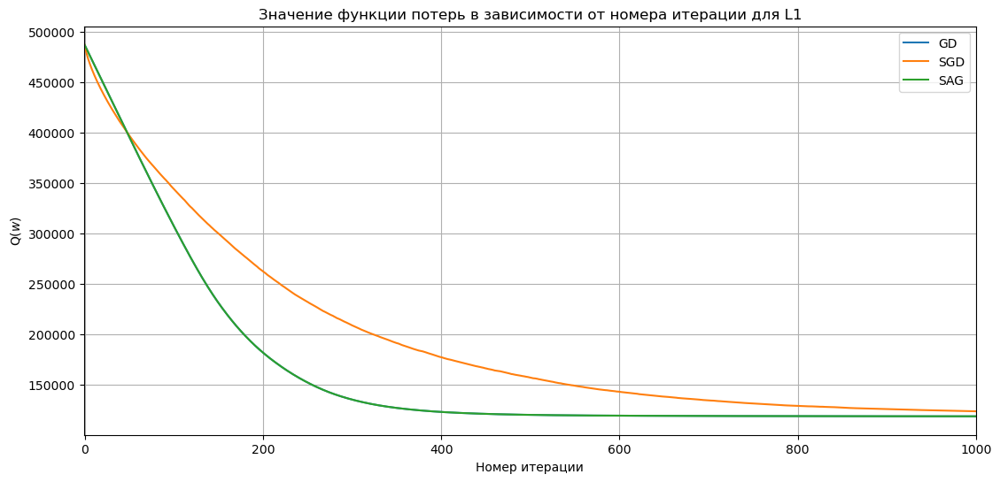

In [2086]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации для L1")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [2087]:
num_steps = 1000
errors_huber_m = np.array(lr_hub_gd_2.deviation_list)[:num_steps]
errors_huber_sgd = np.array(lr_hub_sgd_n_2.deviation_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag_n_2.deviation_list)[:num_steps]

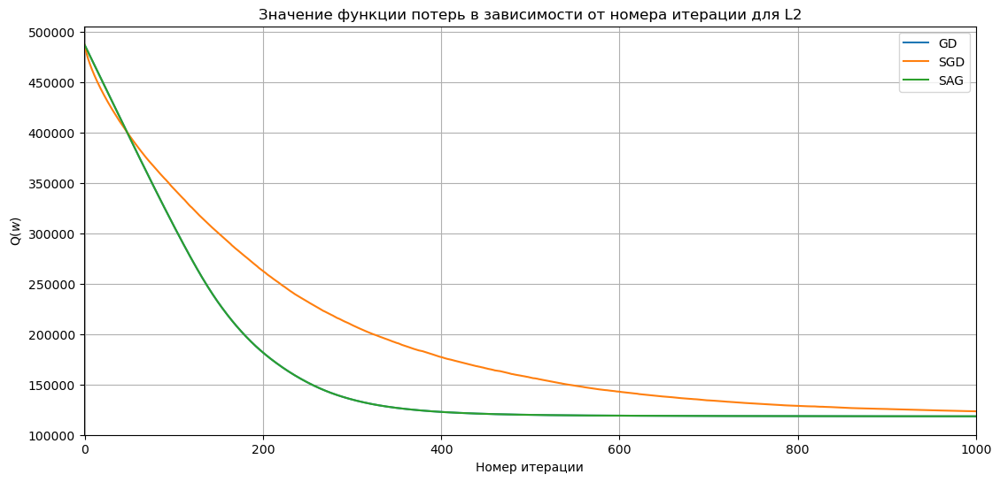

In [2088]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_m, label="GD")
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG")

plt.title("Значение функции потерь в зависимости от номера итерации для L2")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

### Норма градиента функции потерь в зависимости от номера итерации

In [2089]:
num_steps = 1000
grad_hub_m = np.array(lr_hub_gd_1.grad_list)[:num_steps]
grad_hub_sgd = np.array(lr_hub_sgd_n_1.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag_n_1.grad_list)[:num_steps]

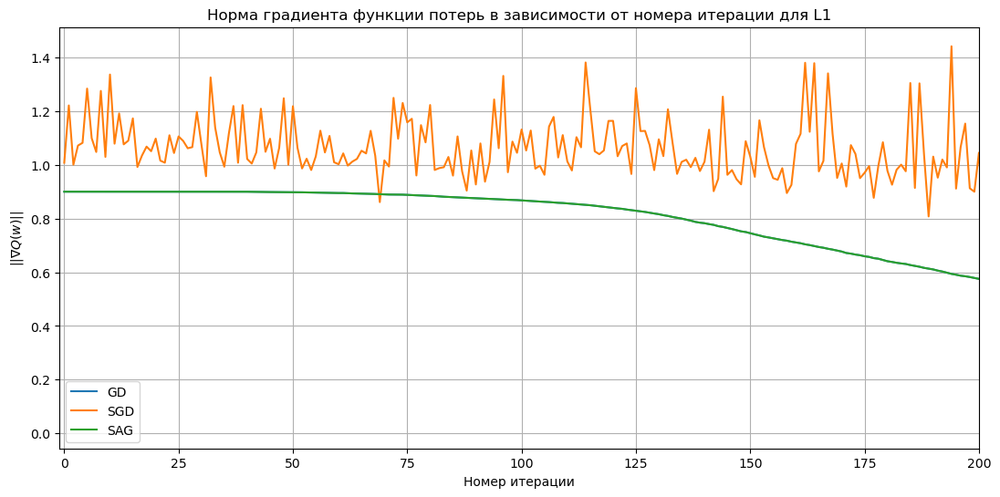

In [2091]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации для L1")
plt.xlim((-1, 200))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

In [2092]:
num_steps = 1000
grad_hub_m = np.array(lr_hub_gd_2.grad_list)[:num_steps]
grad_hub_sgd = np.array(lr_hub_sgd_n_2.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag_n_2.grad_list)[:num_steps]

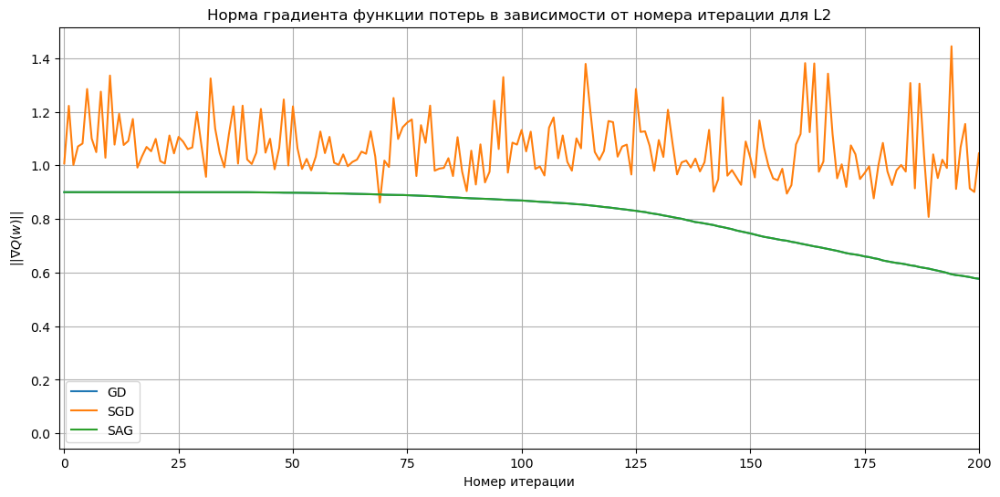

In [2093]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_m, label="GD")
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG")

plt.title("Норма градиента функции потерь в зависимости от номера итерации для L2")
plt.xlim((-1, 200))
#plt.ylim((-1, 2000))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

### Оценим влияение регуляризации  
На примере MSE

In [2147]:
weights_no_reg = lr_mse_gd_a.w[:-1]
weights_l1 = lr_mse_gd_1.w[:-1]
weights_l2 = lr_mse_gd_2.w[:-1]

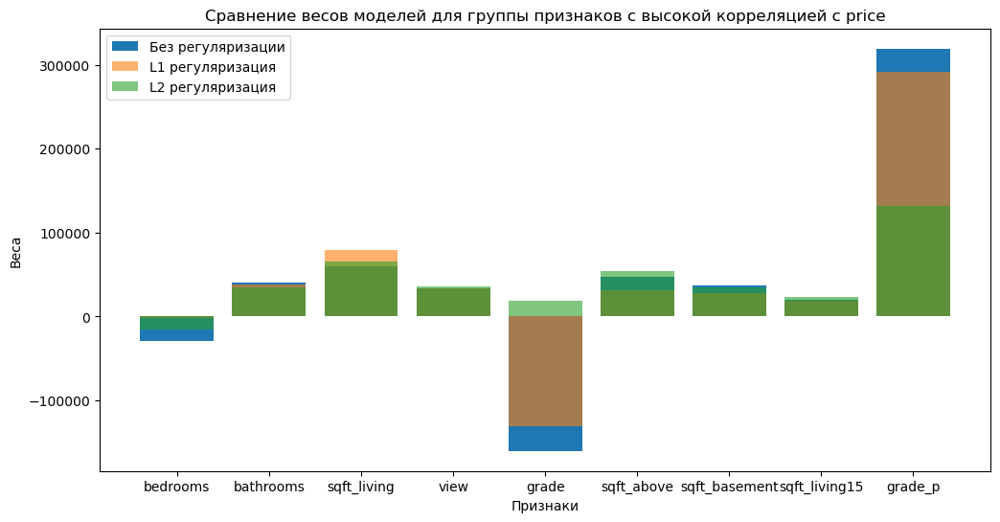

In [2159]:
group = filtered_correlations_best.index

plt.figure(figsize=(12, 6))
plt.bar(group, weights_no_reg[mask], label="Без регуляризации", alpha=1.0)
plt.bar(group, weights_l1[mask], label="L1 регуляризация", alpha=0.6)
plt.bar(group, weights_l2[mask], label="L2 регуляризация", alpha=0.6)
plt.xlabel("Признаки")
plt.ylabel("Веса")
plt.title("Сравнение весов моделей для группы признаков с высокой корреляцией с price")
plt.legend()
plt.show()

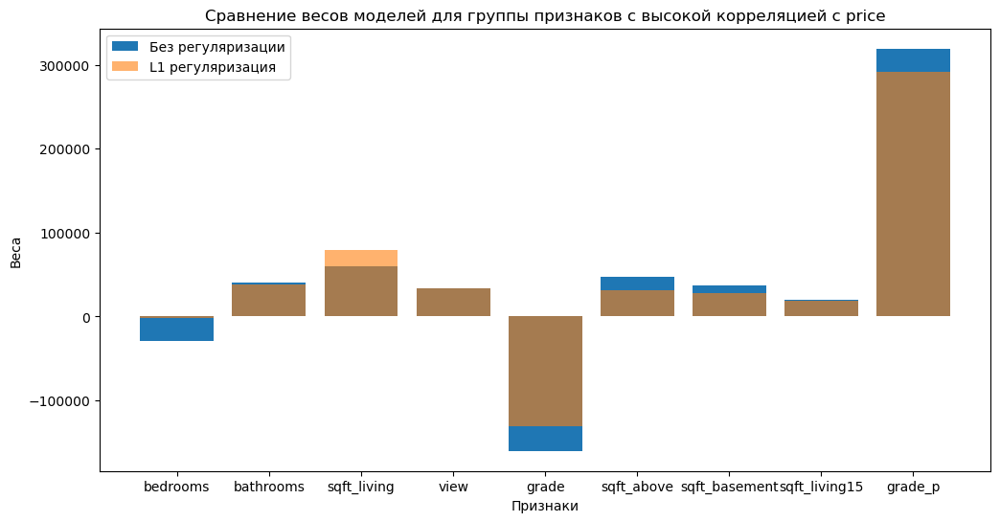

In [2166]:
group = filtered_correlations_best.index

plt.figure(figsize=(12, 6))
plt.bar(group, weights_no_reg[mask], label="Без регуляризации", alpha=1.0)
plt.bar(group, weights_l1[mask], label="L1 регуляризация", alpha=0.6)
plt.xlabel("Признаки")
plt.ylabel("Веса")
plt.title("Сравнение весов моделей для группы признаков с высокой корреляцией с price")
plt.legend()
plt.show()

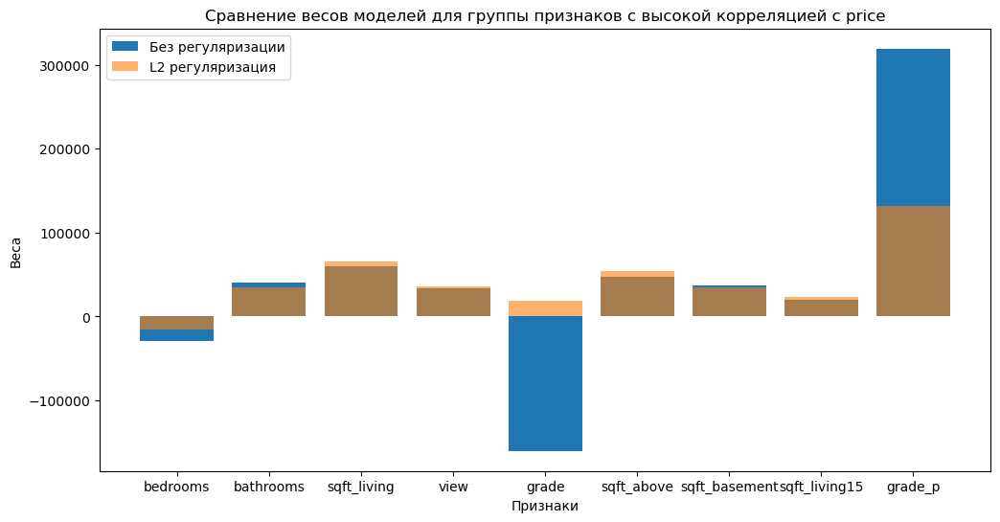

In [2167]:
group = filtered_correlations_best.index

plt.figure(figsize=(12, 6))
plt.bar(group, weights_no_reg[mask], label="Без регуляризации", alpha=1.0)
plt.bar(group, weights_l2[mask], label="L2 регуляризация", alpha=0.6)
plt.xlabel("Признаки")
plt.ylabel("Веса")
plt.title("Сравнение весов моделей для группы признаков с высокой корреляцией с price")
plt.legend()
plt.show()

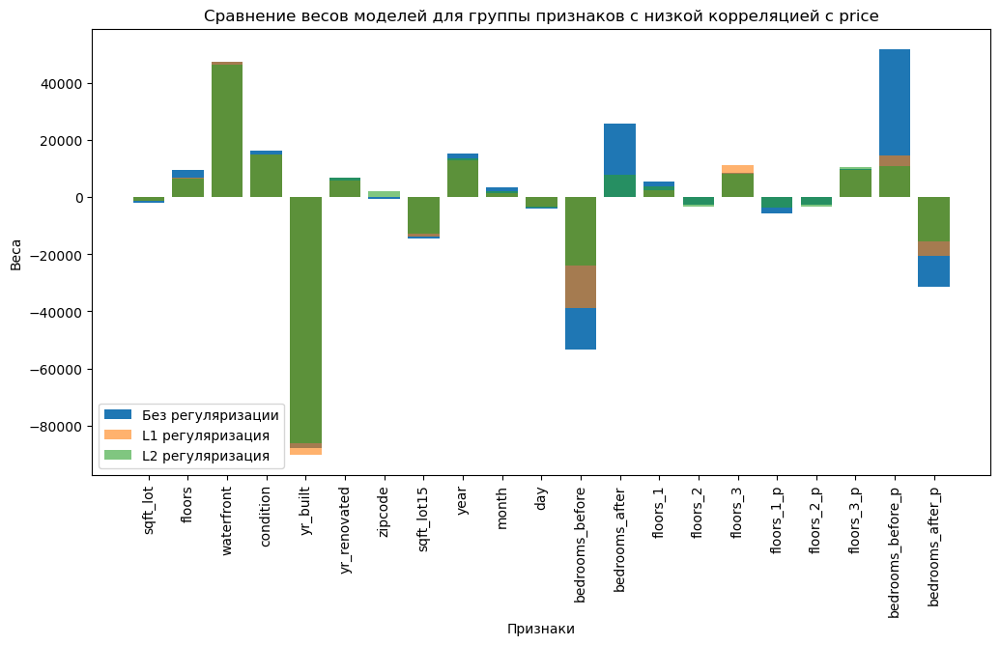

In [2165]:
group = filtered_correlations_n.index

plt.figure(figsize=(12, 6))
plt.bar(group, weights_no_reg[~mask], label="Без регуляризации", alpha=1.0)
plt.bar(group, weights_l1[~mask], label="L1 регуляризация", alpha=0.6)
plt.bar(group, weights_l2[~mask], label="L2 регуляризация", alpha=0.6)
plt.xlabel("Признаки")
plt.ylabel("Веса")
plt.title("Сравнение весов моделей для группы признаков с низкой корреляцией с price")
plt.xticks(fontsize=10,rotation=90)
plt.legend()
plt.show()

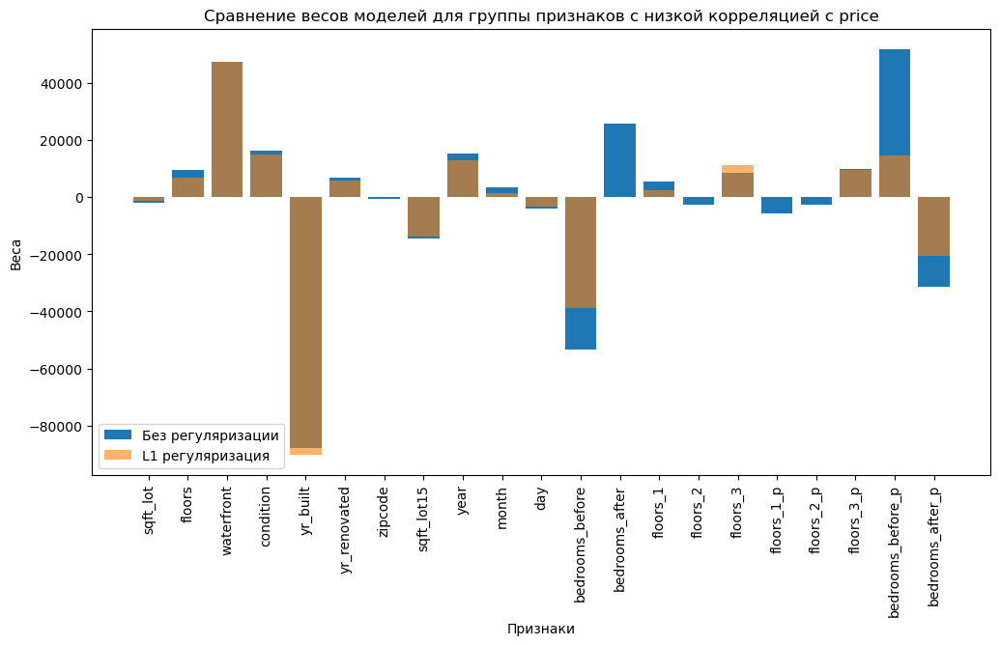

In [2168]:
group = filtered_correlations_n.index

plt.figure(figsize=(12, 6))
plt.bar(group, weights_no_reg[~mask], label="Без регуляризации", alpha=1.0)
plt.bar(group, weights_l1[~mask], label="L1 регуляризация", alpha=0.6)
plt.xlabel("Признаки")
plt.ylabel("Веса")
plt.title("Сравнение весов моделей для группы признаков с низкой корреляцией с price")
plt.xticks(fontsize=10,rotation=90)
plt.legend()
plt.show()

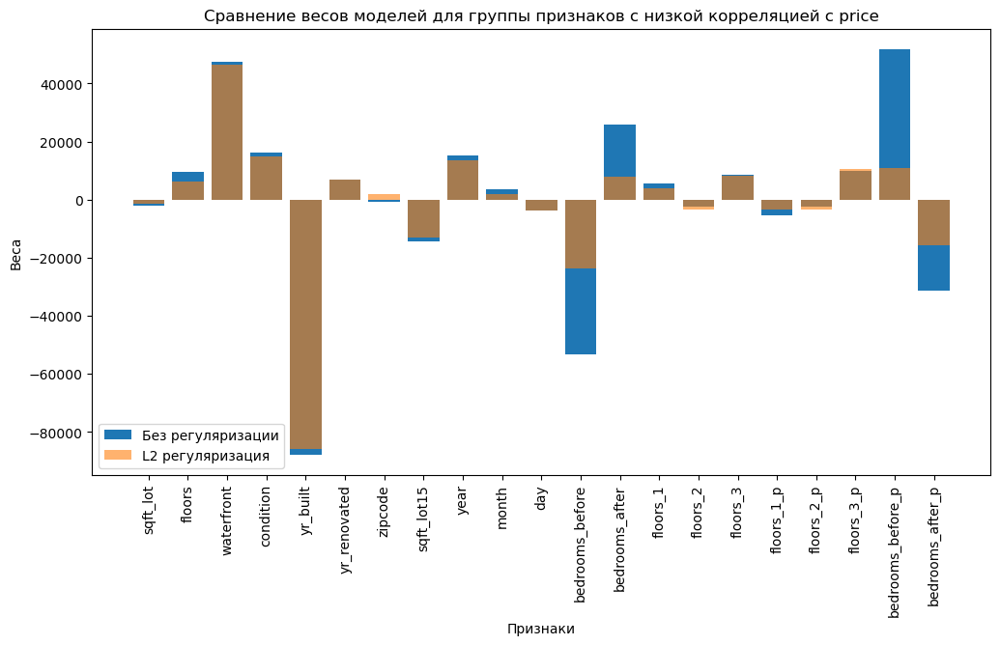

In [2169]:
group = filtered_correlations_n.index

plt.figure(figsize=(12, 6))
plt.bar(group, weights_no_reg[~mask], label="Без регуляризации", alpha=1.0)
plt.bar(group, weights_l2[~mask], label="L2 регуляризация", alpha=0.6)
plt.xlabel("Признаки")
plt.ylabel("Веса")
plt.title("Сравнение весов моделей для группы признаков с низкой корреляцией с price")
plt.xticks(fontsize=10,rotation=90)
plt.legend()
plt.show()

In [2184]:
feature_names = X_raw_reg.corr().index.tolist()[1:]
feature_to_index = {feature: idx for idx, feature in enumerate(feature_names)}
print(feature_to_index)

{'bedrooms': 0, 'bathrooms': 1, 'sqft_living': 2, 'sqft_lot': 3, 'floors': 4, 'waterfront': 5, 'view': 6, 'condition': 7, 'grade': 8, 'sqft_above': 9, 'sqft_basement': 10, 'yr_built': 11, 'yr_renovated': 12, 'zipcode': 13, 'sqft_living15': 14, 'sqft_lot15': 15, 'year': 16, 'month': 17, 'day': 18, 'bedrooms_before': 19, 'bedrooms_after': 20, 'floors_1': 21, 'floors_2': 22, 'floors_3': 23, 'floors_1_p': 24, 'floors_2_p': 25, 'floors_3_p': 26, 'bedrooms_before_p': 27, 'bedrooms_after_p': 28, 'grade_p': 29}


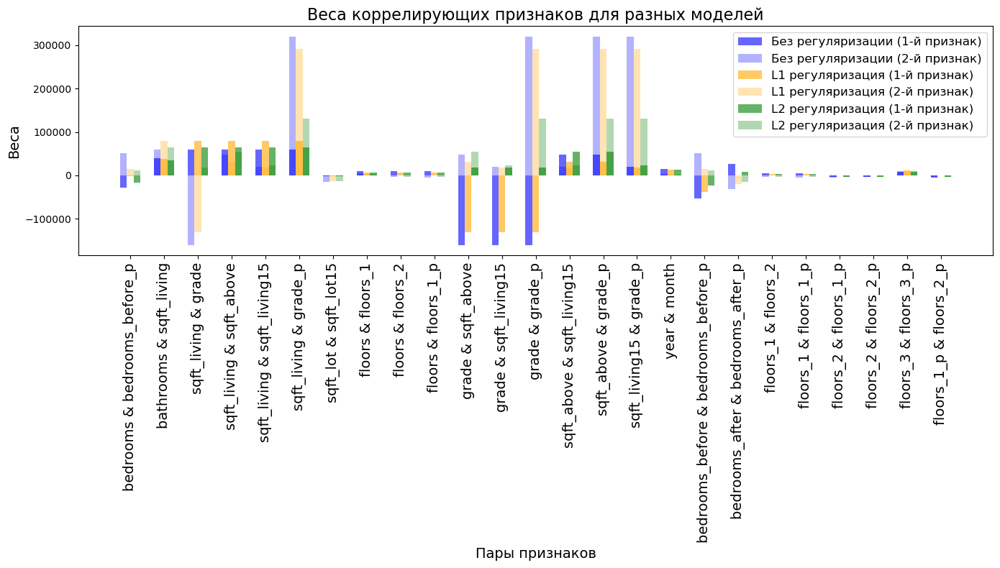

In [2233]:
pairs = list(zip(high_corr_pairs['Feature_1'], high_corr_pairs['Feature_2']))
pairs_labels = [f"{pair[0]} & {pair[1]}" for pair in pairs]  # Метки для пар

# Собираем веса для каждой пары
weights_no_reg_pairs = [
    (weights_no_reg[feature_to_index[pair[0]]], weights_no_reg[feature_to_index[pair[1]]]) for pair in pairs
]
weights_l1_pairs = [
    (weights_l1[feature_to_index[pair[0]]], weights_l1[feature_to_index[pair[1]]]) for pair in pairs
]
weights_l2_pairs = [
    (weights_l2[feature_to_index[pair[0]]], weights_l2[feature_to_index[pair[1]]]) for pair in pairs
]

x = np.arange(len(pairs))  # Индексы пар
width = 0.2  # Ширина столбиков

plt.figure(figsize=(14, 8))

# Веса для каждой модели
for i, (weights, label, color) in enumerate(zip(
    [weights_no_reg_pairs, weights_l1_pairs, weights_l2_pairs],
    ["Без регуляризации", "L1 регуляризация", "L2 регуляризация"],
    ['blue', 'orange', 'green']
)):
    plt.bar(x + i * width, [w[0] for w in weights], width=width, label=f"{label} (1-й признак)", color=color, alpha=0.6)
    plt.bar(x + i * width, [w[1] for w in weights], width=width, label=f"{label} (2-й признак)", color=color, alpha=0.3)

plt.xticks(x + width, pairs_labels, rotation=90, fontsize=14)
plt.xlabel("Пары признаков", fontsize=14)
plt.ylabel("Веса", fontsize=14)
plt.title("Веса коррелирующих признаков для разных моделей", fontsize=16)
plt.legend(fontsize=12)
plt.tight_layout()
plt.show()

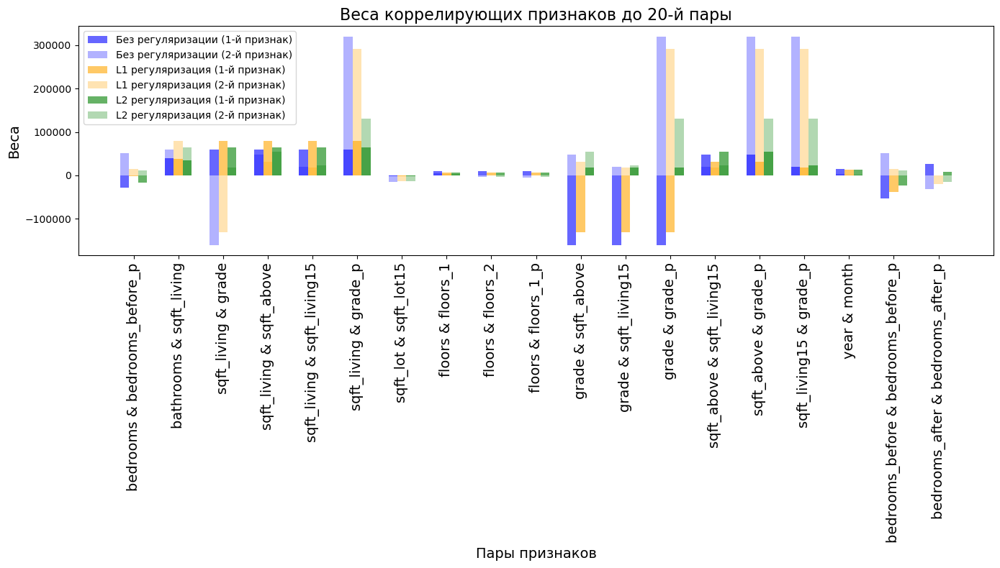

In [2234]:
cutoff_index = 19 
pairs = pairs[:cutoff_index]
pairs_labels = pairs_labels[:cutoff_index]
weights_no_reg_pairs = weights_no_reg_pairs[:cutoff_index]
weights_l1_pairs = weights_l1_pairs[:cutoff_index]
weights_l2_pairs = weights_l2_pairs[:cutoff_index]

x = np.arange(len(pairs))
plt.figure(figsize=(14, 8))

for i, (weights, label, color) in enumerate(zip(
    [weights_no_reg_pairs, weights_l1_pairs, weights_l2_pairs],
    ["Без регуляризации", "L1 регуляризация", "L2 регуляризация"],
    ['blue', 'orange', 'green']
)):
    plt.bar(x[:cutoff_index] + i * width, [w[0] for w in weights], width=width, label=f"{label} (1-й признак)", color=color, alpha=0.6)
    plt.bar(x[:cutoff_index] + i * width, [w[1] for w in weights], width=width, label=f"{label} (2-й признак)", color=color, alpha=0.3)

plt.xticks(x[:cutoff_index] + width, pairs_labels[:cutoff_index], rotation=90, fontsize=14)
plt.xlabel("Пары признаков", fontsize=14)
plt.ylabel("Веса", fontsize=14)
plt.title("Веса коррелирующих признаков до 20-й пары", fontsize=16)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

In [2218]:
X_help = X_raw_reg.drop('price', axis=1)

In [2229]:
original_corr_matrix = X_help.corr()
high_corr_threshold = 0.7
high_corr_pairs = original_corr_matrix[
    (original_corr_matrix.abs() > high_corr_threshold) & (original_corr_matrix != 1)
]
high_corr_features = high_corr_pairs.stack().reset_index()['level_0'].unique()
X_high_corr = X_help[high_corr_features]

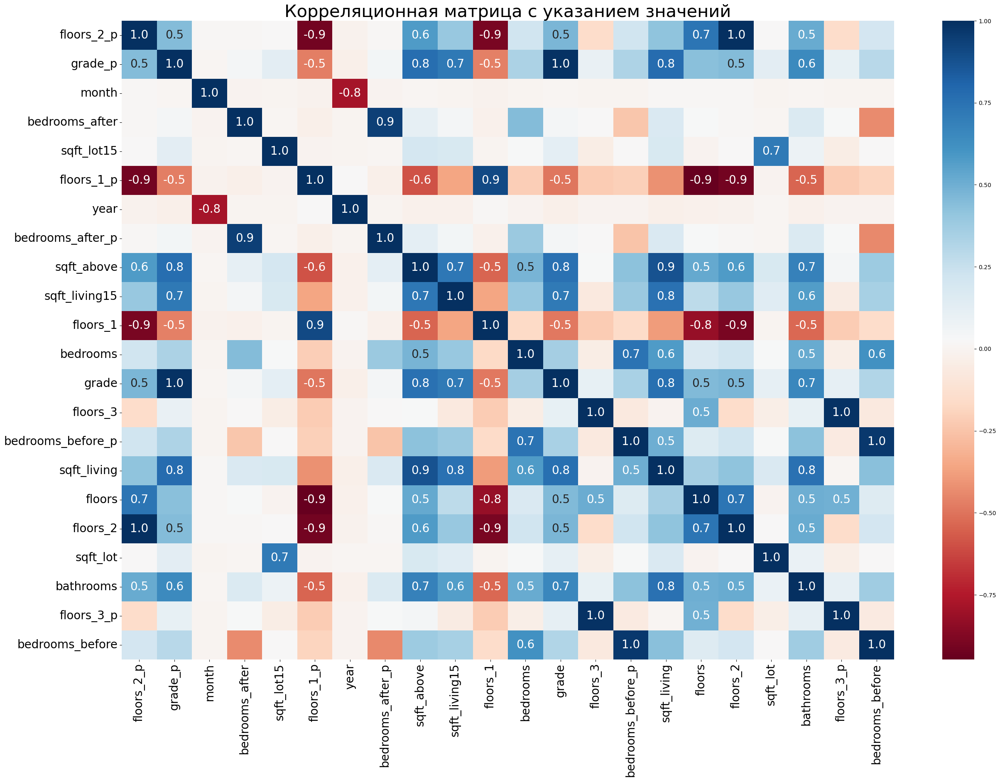

In [2230]:
lasso_weights = lr_mse_gd_a.w[:-1]
non_zero_features = [X_help.columns[i] for i in range(len(lasso_weights)) if abs(lasso_weights[i]) > 1e-6]
filtered_features = list(set(high_corr_features) & set(non_zero_features))
X_transformed = X_help[filtered_features]

new_corr_matrix = X_transformed.corr()
colormap = plt.cm.RdBu
fig, ax = plt.subplots(figsize=(30, 20))
ax = sns.heatmap(new_corr_matrix, ax=ax, annot=True, cmap=colormap, linecolor="white", fmt="0.1f")
ax.set_title('Корреляционная матрица с указанием значений', fontsize=30)
for t in ax.texts:
    if float(t.get_text()) >= 0.5 or float(t.get_text()) <= -0.5:
        t.set_text(t.get_text())
        t.set_fontsize(20)
    else:
        t.set_text("")
plt.xticks(fontsize=20,rotation=90)
plt.yticks(fontsize=20)
plt.show()

Перестроил для сильно коррелирующих признаков

### Проведем анализ выбросов
#### Проверим распределение ошибок

In [2235]:
errors = y_train_reg - lr_mse_gd_a.predict(X_train_reg_n)

q1 = np.percentile(errors, 25)  
q3 = np.percentile(errors, 75)  
iqr = q3 - q1  
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

mean = np.mean(errors)
std_dev = np.std(errors)
std_lower = mean - 3 * std_dev
std_upper = mean + 3 * std_dev


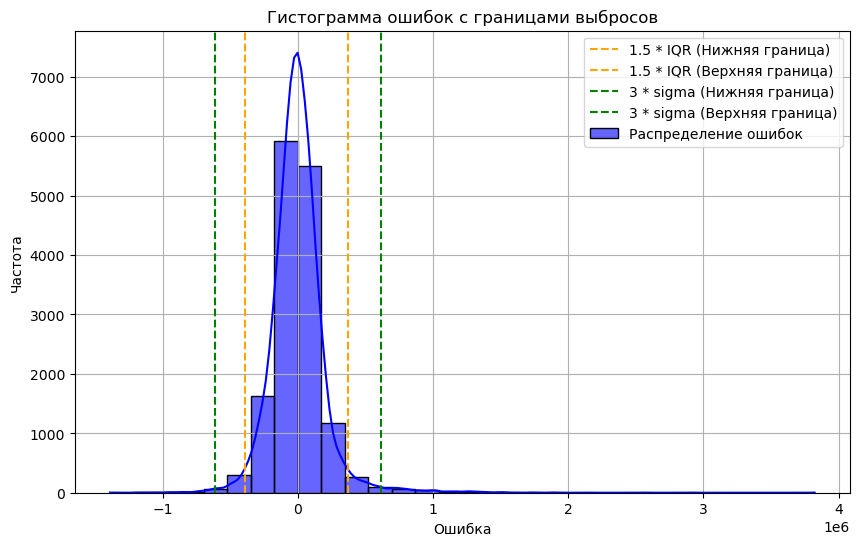

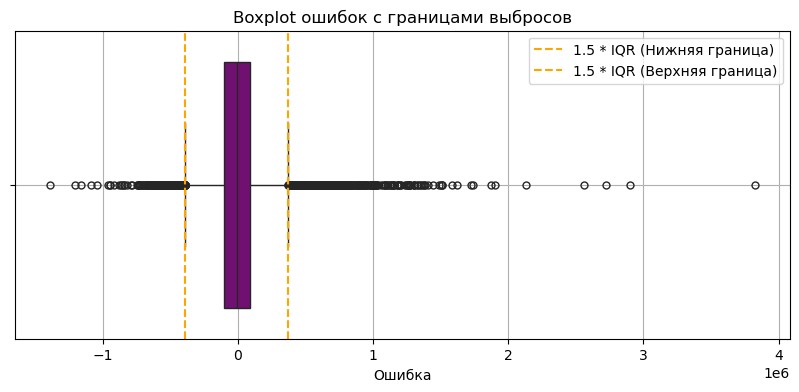

In [2241]:
plt.figure(figsize=(10, 6))

sns.histplot(errors, kde=True, bins=30, color='blue', alpha=0.6, label='Распределение ошибок')
plt.axvline(lower_bound, color='orange', linestyle='--', label='1.5 * IQR (Нижняя граница)')
plt.axvline(upper_bound, color='orange', linestyle='--', label='1.5 * IQR (Верхняя граница)')
plt.axvline(std_lower, color='green', linestyle='--', label='3 * sigma (Нижняя граница)')
plt.axvline(std_upper, color='green', linestyle='--', label='3 * sigma (Верхняя граница)')
plt.title("Гистограмма ошибок с границами выбросов")
plt.xlabel("Ошибка")
plt.ylabel("Частота")
plt.legend()
plt.grid()
plt.show()

plt.figure(figsize=(10, 4))
sns.boxplot(x=errors, color='purple', fliersize=5)
plt.axvline(lower_bound, color='orange', linestyle='--', label='1.5 * IQR (Нижняя граница)')
plt.axvline(upper_bound, color='orange', linestyle='--', label='1.5 * IQR (Верхняя граница)')
plt.title("Boxplot ошибок с границами выбросов")
plt.xlabel("Ошибка")
plt.legend()
plt.grid()
plt.show()


In [2237]:
# Вывод статистики
print(f"Первый квартиль (Q1): {q1}")
print(f"Третий квартиль (Q3): {q3}")
print(f"IQR (межквартильный размах): {iqr}")
print(f"Границы выбросов (1.5 * IQR): {lower_bound:.2f}, {upper_bound:.2f}")
print(f"Границы выбросов (3 * sigma): {std_lower:.2f}, {std_upper:.2f}")

Первый квартиль (Q1): -103538.07914647809
Третий квартиль (Q3): 86955.99580650119
IQR (межквартильный размах): 190494.07495297928
Границы выбросов (1.5 * IQR): -389279.19, 372697.11
Границы выбросов (3 * sigma): -615452.53, 615452.53


q1 - ниже него 25%  
q3 - выше него 25%  
q2 - медиана

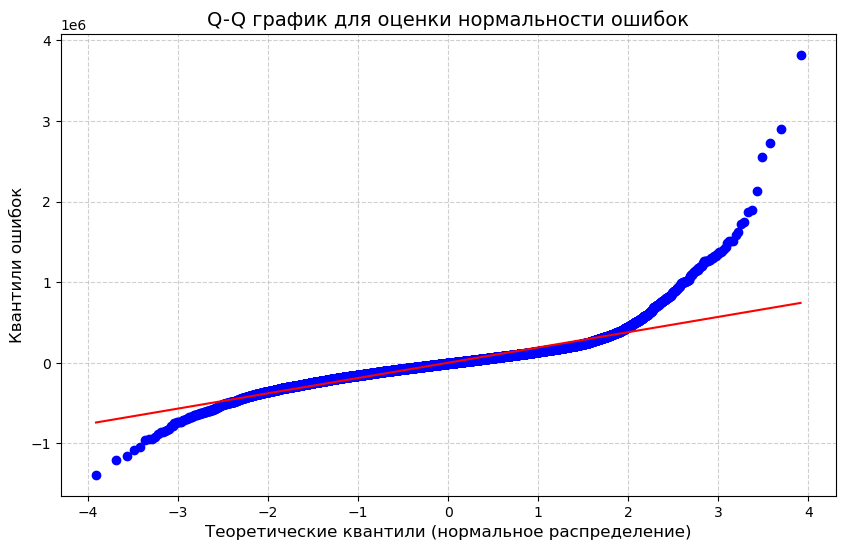

In [2240]:
import scipy.stats as stats

plt.figure(figsize=(10, 6))
stats.probplot(errors, dist="norm", plot=plt)
plt.title("Q-Q график для оценки нормальности ошибок", fontsize=14)
plt.xlabel("Теоретические квантили (нормальное распределение)", fontsize=12)
plt.ylabel("Квантили ошибок", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

Т.к распределение отклоняется от нормального, MSE принуждает минимизировать крупные выбросы сильнее,чем Huber и log  
т.е модель лучше подстраивается под данные с сильными выбросами, даже если это ухудшает предсказания для остальной части.  
В Huber же при оптимальном $\delta\$ выбросы меньше влияют на обучение, однако т.к выбросов много это играет против Huber и log  
Стоит отметить, что таргет также имеет не симметричное распределение и много сильных выбросов

P.S. MSE - сделала 1000 iq мув и учится на выбросах, когда остальные пытаются их минимизировать  
Нормальное распределение - устойчивый центральный момент

#### Проверим на выбросы price  
(Повторно)

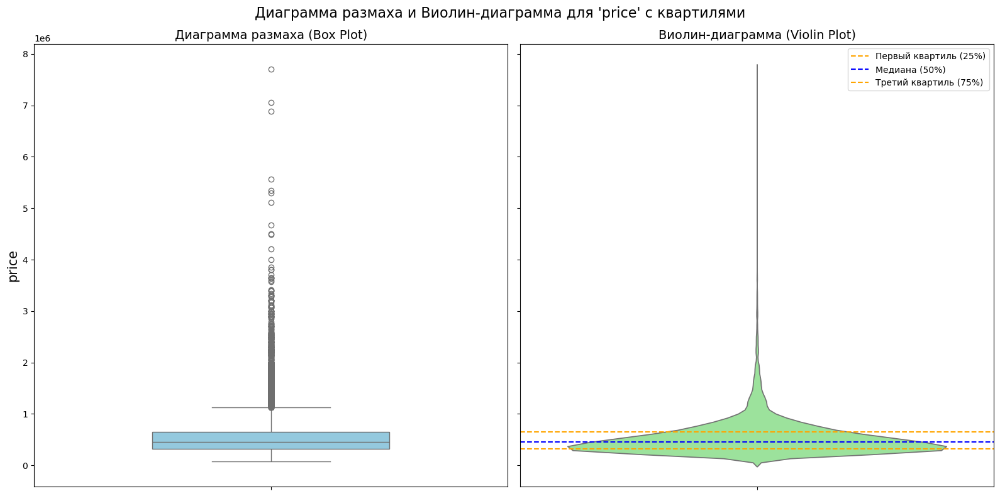

In [2246]:
data = X_raw_reg['price']
q1, median, q3 = np.percentile(data, [25, 50, 75])

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

sns.boxplot(data=data, ax=axes[0], width=0.5, color="skyblue")
axes[0].set_title("Диаграмма размаха (Box Plot)", fontsize=14)
axes[0].set_ylabel('price', fontsize=15)
axes[0].tick_params(axis='both', which='major', labelsize=10)

sns.violinplot(data=data, ax=axes[1], inner=None, color="lightgreen")
axes[1].axhline(q1, color="orange", linestyle="--", label="Первый квартиль (25%)")
axes[1].axhline(median, color="blue", linestyle="--", label="Медиана (50%)")
axes[1].axhline(q3, color="orange", linestyle="--", label="Третий квартиль (75%)")
axes[1].legend(loc="upper right", fontsize=10)
axes[1].set_title("Виолин-диаграмма (Violin Plot)", fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=10)

# Общий заголовок
plt.suptitle("Диаграмма размаха и Виолин-диаграмма для 'price' с квартилями", fontsize=16)
plt.tight_layout()
plt.show()


Как мы видим, данные распределены более плотно между Q1 и Q2, а большая дисперсия наблюдается между Q2 и Q3  
также видно что со стороны Q1(т.е < Q1) данные распределены с с небольшими отклонениями(левый хвост короче и шире -> меньший разброс). Со стороны Q3(т.е > Q3) данные сильно разбросаны, изменчивы, и  их плотность мала

Остальные данные были рассмотрены во время "разведывательного анализа"

### Обработка выбросов

In [2249]:
df = X_raw_reg.copy()

def mark_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return series.apply(lambda x: 1 if x < lower_bound or x > upper_bound else 0)

selected_features = ['grade', 'sqft_living', 'sqft_above']

df['outlier_grade'] = mark_outliers(df['grade'])
correlations = df.drop('outlier_grade', axis=1).corrwith(df['outlier_grade'])
print("Корреляции меток выбросов с признаками:")
print(correlations)


Корреляции меток выбросов с признаками:
price                0.485241
bedrooms             0.125522
bathrooms            0.314499
sqft_living          0.464923
sqft_lot             0.118981
floors               0.172449
waterfront           0.091527
view                 0.194012
condition           -0.074738
grade                0.510467
sqft_above           0.471510
sqft_basement        0.082587
yr_built             0.121351
yr_renovated        -0.002190
zipcode             -0.091423
sqft_living15        0.439708
sqft_lot15           0.115159
year                -0.011210
month                0.001479
day                 -0.007420
bedrooms_before      0.096477
bedrooms_after       0.034228
floors_1            -0.192332
floors_2             0.195397
floors_3             0.015994
floors_1_p          -0.197326
floors_2_p           0.195397
floors_3_p           0.024235
bedrooms_before_p    0.127872
bedrooms_after_p     0.036084
grade_p              0.614032
dtype: float64


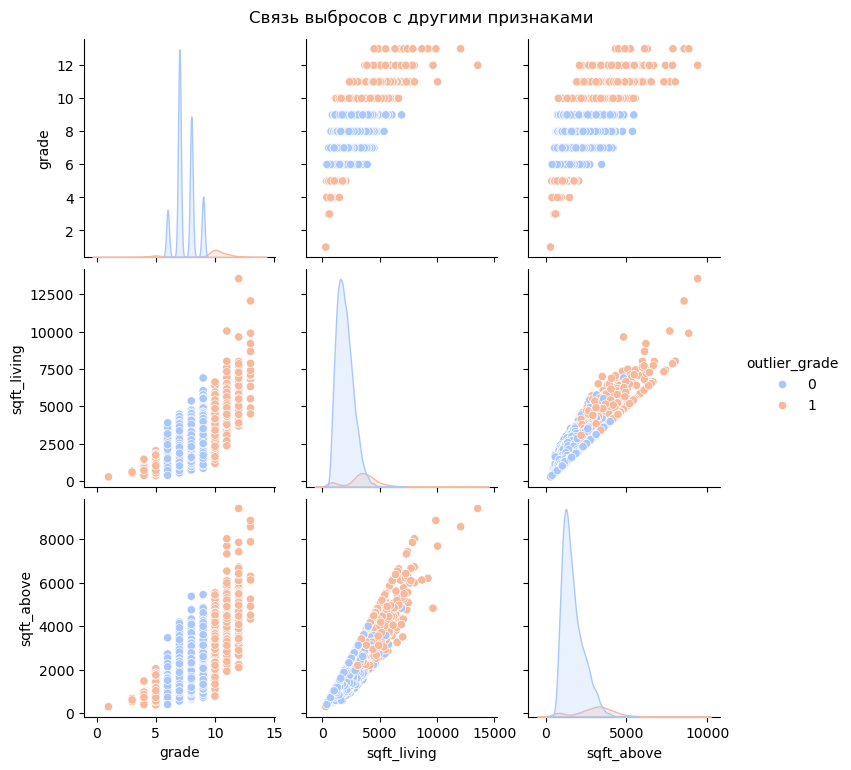

In [2250]:
sns.pairplot(data=df, vars=selected_features, hue='outlier_grade', palette='coolwarm')
plt.suptitle("Связь выбросов с другими признаками", y=1.02)
plt.show()


In [2256]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import KNNImputer

df = X_raw_reg.copy()

def calculate_iqr_bounds(series):
    q1, q3 = np.percentile(series, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return lower_bound, upper_bound

# Выявление выбросов для всех признаков
outliers = {}
for col in tqdm(df.columns):
    lower_bound, upper_bound = calculate_iqr_bounds(df[col])
    outliers[col] = (df[col] < lower_bound) | (df[col] > upper_bound)

# Замена выбросов в целевой переменной (price) с использованием линейной регрессии
target = 'price'
features = [col for col in df.columns if col != target]

# Разделение данных на нормальные и выбросы
price_outliers = outliers[target]
normal_data = df[~price_outliers]
outlier_data = df[price_outliers]

# Обучение модели линейной регрессии
reg_model = LinearRegression()
reg_model.fit(normal_data[features], normal_data[target])

# Замена выбросов предсказаниями модели
predicted_prices = reg_model.predict(outlier_data[features])
df.loc[price_outliers, target] = predicted_prices

# Замена выбросов в остальных признаках с использованием KNN Imputer
imputer = KNNImputer(n_neighbors=5)

# Замена выбросов на NaN
for col in tqdm(features):
    df.loc[outliers[col], col] = np.nan

# Применение KNN Imputer
df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)
df_imputed.head()


100%|█████████████████████████████████████████| 30/30 [00:00<00:00, 3718.24it/s]


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,bedrooms_after,floors_1,floors_2,floors_3,floors_1_p,floors_2_p,floors_3_p,bedrooms_before_p,bedrooms_after_p,grade_p
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,0.0,0.0,3.0,7.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,9.0,0.0,129.641814
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3.0,7.0,...,0.0,0.0,2.0,0.0,0.0,4.0,0.0,9.0,0.0,129.641814
2,180000.0,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3.0,6.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4.0,0.0,88.181631
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5.0,7.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,16.0,0.0,129.641814
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3.0,8.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,9.0,0.0,181.019336


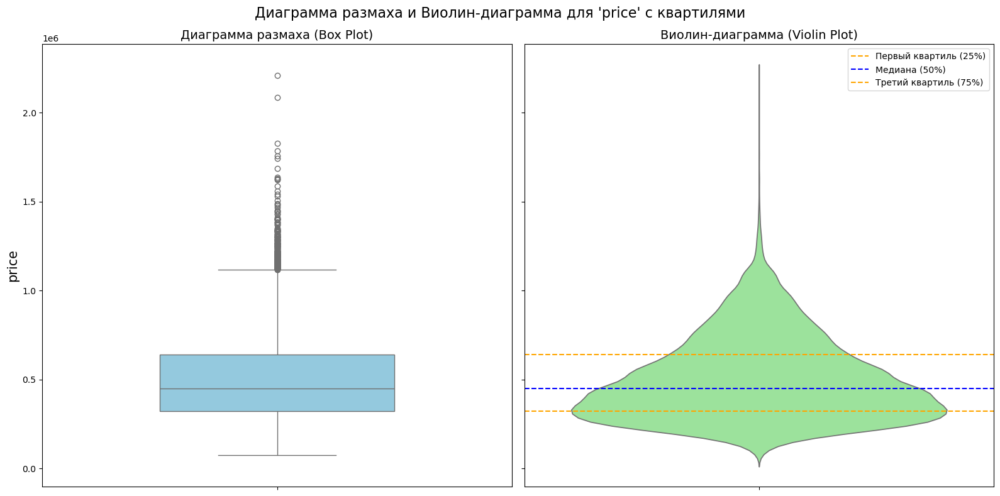

In [2260]:
data = df_imputed['price']
q1, median, q3 = np.percentile(data, [25, 50, 75])

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

sns.boxplot(data=data, ax=axes[0], width=0.5, color="skyblue")
axes[0].set_title("Диаграмма размаха (Box Plot)", fontsize=14)
axes[0].set_ylabel('price', fontsize=15)
axes[0].tick_params(axis='both', which='major', labelsize=10)

sns.violinplot(data=data, ax=axes[1], inner=None, color="lightgreen")
axes[1].axhline(q1, color="orange", linestyle="--", label="Первый квартиль (25%)")
axes[1].axhline(median, color="blue", linestyle="--", label="Медиана (50%)")
axes[1].axhline(q3, color="orange", linestyle="--", label="Третий квартиль (75%)")
axes[1].legend(loc="upper right", fontsize=10)
axes[1].set_title("Виолин-диаграмма (Violin Plot)", fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=10)

# Общий заголовок
plt.suptitle("Диаграмма размаха и Виолин-диаграмма для 'price' с квартилями", fontsize=16)
plt.tight_layout()
plt.show()


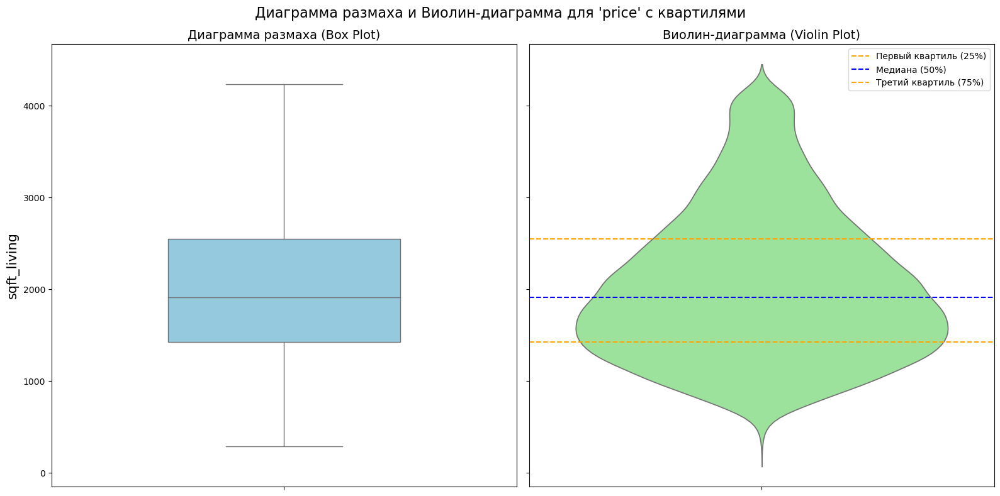

In [2265]:
data = df_imputed['sqft_living']
q1, median, q3 = np.percentile(data, [25, 50, 75])

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

sns.boxplot(data=data, ax=axes[0], width=0.5, color="skyblue")
axes[0].set_title("Диаграмма размаха (Box Plot)", fontsize=14)
axes[0].set_ylabel('sqft_living', fontsize=15)
axes[0].tick_params(axis='both', which='major', labelsize=10)

sns.violinplot(data=data, ax=axes[1], inner=None, color="lightgreen")
axes[1].axhline(q1, color="orange", linestyle="--", label="Первый квартиль (25%)")
axes[1].axhline(median, color="blue", linestyle="--", label="Медиана (50%)")
axes[1].axhline(q3, color="orange", linestyle="--", label="Третий квартиль (75%)")
axes[1].legend(loc="upper right", fontsize=10)
axes[1].set_title("Виолин-диаграмма (Violin Plot)", fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=10)

# Общий заголовок
plt.suptitle("Диаграмма размаха и Виолин-диаграмма для 'price' с квартилями", fontsize=16)
plt.tight_layout()
plt.show()


##### Этот способ незначительно улучшил price, но убрал выбросы в других признаках

In [2266]:
from sklearn.impute import KNNImputer
from tqdm import tqdm

# Копируем исходный DataFrame
df = X_raw_reg.copy()

def calculate_iqr_bounds(series):
    """Функция для расчета границ выбросов на основе межквартильного размаха (IQR)."""
    q1, q3 = np.percentile(series, [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    return lower_bound, upper_bound

# Выявление выбросов для всех признаков
outliers = {}
for col in tqdm(df.columns):
    lower_bound, upper_bound = calculate_iqr_bounds(df[col])
    outliers[col] = (df[col] < lower_bound) | (df[col] > upper_bound)

# Замена выбросов на NaN для всех признаков
for col in tqdm(df.columns):
    df.loc[outliers[col], col] = np.nan

# Применение KNN Imputer для обработки всех выбросов
imputer = KNNImputer(n_neighbors=5)
df_imputed_price = pd.DataFrame(imputer.fit_transform(df), columns=df.columns)

# Выводим результат
print("Данные после обработки выбросов с использованием KNN Imputer:")
df_imputed_price.head()


100%|█████████████████████████████████████████| 31/31 [00:00<00:00, 1800.28it/s]


Данные после обработки выбросов с использованием KNN Imputer:


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,bedrooms_after,floors_1,floors_2,floors_3,floors_1_p,floors_2_p,floors_3_p,bedrooms_before_p,bedrooms_after_p,grade_p
0,221900.0,3.0,1.00,1180.0,5650.0,1.0,0.0,0.0,3.0,7.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,9.0,0.0,129.641814
1,538000.0,3.0,2.25,2570.0,7242.0,2.0,0.0,0.0,3.0,7.0,...,0.0,0.0,2.0,0.0,0.0,4.0,0.0,9.0,0.0,129.641814
2,180000.0,2.0,1.00,770.0,10000.0,1.0,0.0,0.0,3.0,6.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,4.0,0.0,88.181631
3,604000.0,4.0,3.00,1960.0,5000.0,1.0,0.0,0.0,5.0,7.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,16.0,0.0,129.641814
4,510000.0,3.0,2.00,1680.0,8080.0,1.0,0.0,0.0,3.0,8.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,9.0,0.0,181.019336


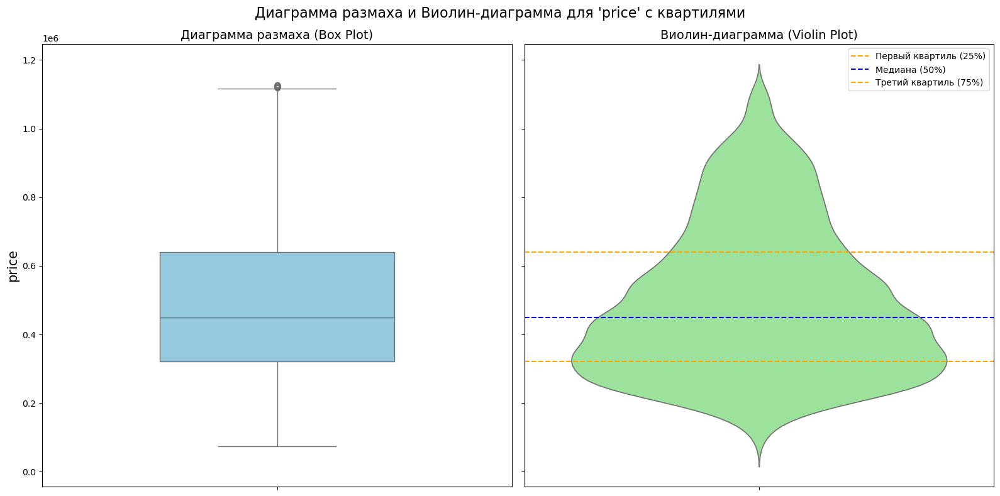

In [2267]:
data = df_imputed_price['price']
q1, median, q3 = np.percentile(data, [25, 50, 75])

fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

sns.boxplot(data=data, ax=axes[0], width=0.5, color="skyblue")
axes[0].set_title("Диаграмма размаха (Box Plot)", fontsize=14)
axes[0].set_ylabel('price', fontsize=15)
axes[0].tick_params(axis='both', which='major', labelsize=10)

sns.violinplot(data=data, ax=axes[1], inner=None, color="lightgreen")
axes[1].axhline(q1, color="orange", linestyle="--", label="Первый квартиль (25%)")
axes[1].axhline(median, color="blue", linestyle="--", label="Медиана (50%)")
axes[1].axhline(q3, color="orange", linestyle="--", label="Третий квартиль (75%)")
axes[1].legend(loc="upper right", fontsize=10)
axes[1].set_title("Виолин-диаграмма (Violin Plot)", fontsize=14)
axes[1].tick_params(axis='both', which='major', labelsize=10)

# Общий заголовок
plt.suptitle("Диаграмма размаха и Виолин-диаграмма для 'price' с квартилями", fontsize=16)
plt.tight_layout()
plt.show()


##### Ситуация значительно улучшилась, убрали большую часть выбросов, однако такой способ не безопасен  
P.S. Удалять выбросы из target

### Обучим модели на новых данных

#### С выбросами в target

In [2270]:
y_new = df_imputed['price']
X_new = df_imputed.drop('price', axis=1)

In [2271]:
X_new = X_new.values
y_new = y_new.values
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_new,y_new,test_size=0.3,random_state=63)

In [2272]:
normalizer = StandardScaler()
X_train_new_n = normalizer.fit_transform(X_train_new)
X_test_new_n = normalizer.transform(X_test_new)

In [2299]:
lr_mse_gd_st = LinearRegressionStats(MSELoss(), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_st.fit(X_train_new_n, y_train_new)
print(lr_mse_gd_st.iteration)
lr_mse_gd_st.w

1000


array([-9.00940841e+03,  1.64506373e+04,  1.07046864e+05, -1.26909572e+04,
        3.65190641e+04, -1.82541251e-05, -4.26543340e-05,  1.32038650e+04,
        4.18432835e+03, -2.81944106e+04, -1.08591742e+04, -6.84201466e+04,
        5.06951415e-05,  5.57841138e+03,  4.46394871e+04, -1.07460178e+04,
        9.32752066e+03,  1.29366643e+03, -1.87644592e+03, -9.00940842e+03,
        3.30099320e-05,  5.71734247e+03,  5.30598762e+01, -7.12208838e-05,
        2.40009203e+04,  5.30598456e+01, -3.61652923e-05,  1.38320682e+03,
       -8.18215533e-05,  8.63107124e+04,  4.96814940e+05])

In [2301]:
print(f"Train: {mean_squared_error(y_train_new, lr_mse_gd_st.predict(X_train_new_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_new, lr_mse_gd_st.predict(X_test_new_n))**0.5}")
print(r2_score(y_train_new, lr_mse_gd_st.predict(X_train_new_n)), r2_score(y_test_new, lr_mse_gd_st.predict(X_test_new_n)))

Train: 135649.54278104648
Test: 134507.12843911033
0.6219967072354478 0.6188091455692297


In [2312]:
lr_mse_gd_1_st = LinearRegressionStats(MSEL1Loss(1000), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_1_st.fit(X_train_new_n, y_train_new)
print(lr_mse_gd_1_st.iteration)
lr_mse_gd_1_st.w

1000


array([-7.83688771e+03,  1.52901522e+04,  9.25858564e+04, -1.22888262e+04,
        1.81701463e+04, -1.82541251e-05, -4.26543340e-05,  1.29223001e+04,
        3.90635691e+03, -1.31906261e+04, -3.63968073e+03, -6.74153846e+04,
        5.06951415e-05,  5.57004699e+03,  4.34561527e+04, -1.06368248e+04,
        7.82366320e+03,  2.60707218e+01, -1.44114892e+03, -7.83688772e+03,
        3.30099320e-05,  7.97477582e+02, -6.37629885e+03, -7.12208838e-05,
       -2.23292323e+00, -6.37629888e+03, -3.61652923e-05,  8.05690741e-01,
       -8.18215533e-05,  8.61824312e+04,  4.96814940e+05])

In [2313]:
print(f"Train: {mean_squared_error(y_train_new, lr_mse_gd_1_st.predict(X_train_new_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_new, lr_mse_gd_1_st.predict(X_test_new_n))**0.5}")
print(r2_score(y_train_new, lr_mse_gd_1_st.predict(X_train_new_n)), r2_score(y_test_new, lr_mse_gd_1_st.predict(X_test_new_n)))

Train: 135787.08908724054
Test: 134431.84647645114
0.6212297408960862 0.6192357216976896


In [2320]:
lr_mse_gd_2_st = LinearRegressionStats(MSEL2Loss(1e-4), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_2_st.fit(X_train_new_n, y_train_new)
print(lr_mse_gd_2_st.iteration)
lr_mse_gd_2_st.w

1000


array([-9.00693651e+03,  1.64586157e+04,  1.06865131e+05, -1.26838522e+04,
        3.63191968e+04, -1.78926656e-05, -4.18097132e-05,  1.32081239e+04,
        4.29340578e+03, -2.80221107e+04, -1.07829544e+04, -6.84010437e+04,
        4.96913005e-05,  5.58703612e+03,  4.46402429e+04, -1.07490332e+04,
        9.32497727e+03,  1.29165849e+03, -1.87593958e+03, -9.00693651e+03,
        3.23562851e-05,  5.69090426e+03, -2.41858599e+01, -6.98106018e-05,
        2.37140659e+04, -2.41858899e+01, -3.54491645e-05,  1.38386556e+03,
       -8.02013619e-05,  8.61937475e+04,  4.96814940e+05])

In [2321]:
print(f"Train: {mean_squared_error(y_train_new, lr_mse_gd_2_st.predict(X_train_new_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_new, lr_mse_gd_2_st.predict(X_test_new_n))**0.5}")
print(r2_score(y_train_new, lr_mse_gd_2_st.predict(X_train_new_n)), r2_score(y_test_new, lr_mse_gd_2_st.predict(X_test_new_n)))

Train: 135650.01410404165
Test: 134505.82991235593
0.6219940804377453 0.6188165055380203


In [2322]:
new_model = LinearRegression()
new_model.fit(X_train_new_n, y_train_new)

LinearRegression()

In [2324]:
new_model.coef_

array([ 4.65262388e+15,  1.63810000e+04,  1.07040500e+05, -1.26645000e+04,
        9.91491250e+04,  1.19152705e+16, -1.47698950e+16,  1.31787480e+04,
        3.99781250e+03, -2.74545000e+04, -1.05599688e+04, -6.93682188e+04,
        1.31012118e+16,  5.41793750e+03,  4.44984375e+04, -1.07129062e+04,
        9.14474414e+03,  1.16516211e+03, -1.88293555e+03, -4.65262388e+15,
       -1.53745314e+16,  1.61975938e+04,  8.05473890e+17,  0.00000000e+00,
        1.21147812e+05, -8.05473890e+17,  0.00000000e+00,  1.19250000e+03,
        0.00000000e+00,  8.65360000e+04])

In [2323]:
print(f"Train: {mean_squared_error(y_train_new, new_model.predict(X_train_new_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_new, new_model.predict(X_test_new_n))**0.5}")
print(r2_score(y_train_new, new_model.predict(X_train_new_n)), r2_score(y_test_new, new_model.predict(X_test_new_n)))

Train: 135577.1675224869
Test: 134421.26644314767
0.622399963849396 0.6192956530357716


In [2368]:
lr_hub_sgd_n_1_st = LinearRegressionStats(HuberL1Loss(0.9, 0.001), lr=5500, method='SGD', batch_size=64, n_iterations=10000)
lr_hub_sgd_n_1_st.fit(X_train_new_n, y_train_new)
print(lr_hub_sgd_n_1_st.iteration)
lr_hub_sgd_n_1_st.w

10000


array([ -9145.28757396,  14696.80477739,  77494.35865977, -12167.57274337,
        16939.50716193,      0.        ,      0.        ,  13618.9621164 ,
        19992.82826403,   3638.70823762,   3987.56471782, -71222.0186056 ,
            0.        ,   5462.39755301,  44765.07679134, -15181.60241008,
         7761.04927259,   -815.03359512,  -2448.86480131,  -9145.28758015,
            0.        ,   3955.41303148,  -5645.366193  ,      0.        ,
        -1910.04205535,  -5645.3662236 ,      0.        ,    583.88631169,
            0.        ,  78081.0530785 , 493129.69699431])

In [2369]:
lr_hub_sag_n_1_st = LinearRegressionStats(HuberL1Loss(0.9, 0.001), lr=2250, method='SAG', n_iterations=1500)
lr_hub_sag_n_1_st.fit(X_train_new_n, y_train_new)
print(lr_hub_sag_n_1_st.iteration)
lr_hub_sag_n_1_st.w

1500


array([-9.83630298e+03,  1.50505447e+04,  7.09784106e+04, -1.24396247e+04,
        1.59504500e+04, -1.82541251e-05, -4.26543340e-05,  1.44998385e+04,
        2.46735355e+04,  1.04709566e+04,  7.19884496e+03, -6.96507008e+04,
        5.06951415e-05,  5.05517210e+03,  4.57226246e+04, -1.49642185e+04,
        7.71670239e+03, -6.35600841e+02, -1.98272918e+03, -9.83630298e+03,
        3.30099320e-05,  5.23609861e+03, -6.56033349e+03, -7.12208838e-05,
       -2.52313497e+03, -6.56033352e+03, -3.61652923e-05,  6.76047781e+02,
       -8.18215533e-05,  7.39907308e+04,  4.93391441e+05])

In [2367]:
print(f"Test: {mean_squared_error(y_test_new, lr_hub_sgd_n_1_st.predict(X_test_new_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_new, lr_hub_sag_n_1_st.predict(X_test_new_n))**0.5}")

Test: 135053.5995945241
Test: 134840.18477587614


In [2387]:
num_steps = 1000
errors_huber_sgd = np.array(lr_hub_sgd_n_1_st.deviation_list)[:num_steps]  
errors_huber_sag = np.array(lr_hub_sag_n_1_st.deviation_list)[:num_steps]

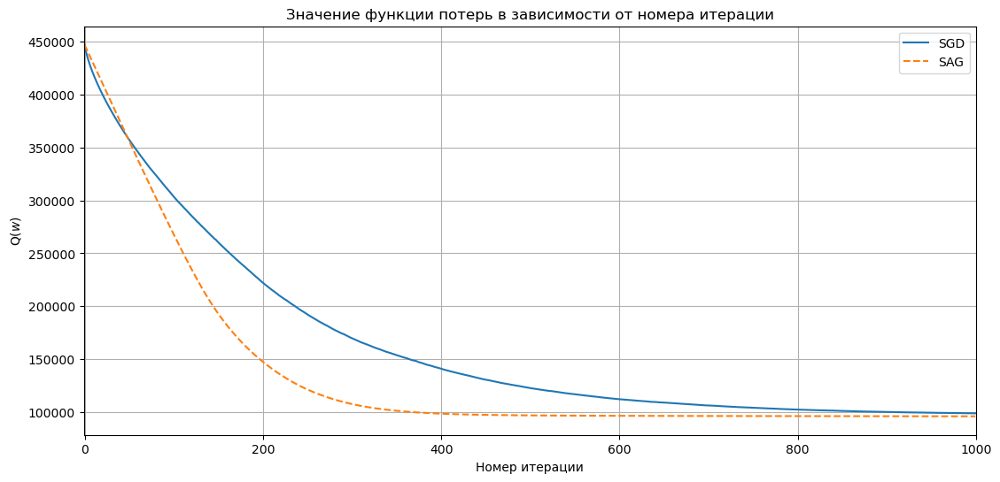

In [2388]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), errors_huber_sgd, label="SGD")
plt.plot(range(num_steps), errors_huber_sag, label="SAG", linestyle='--')

plt.title("Значение функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"Q($w$)")
plt.grid()
plt.show()

In [2393]:
num_steps = 1000
grad_hub_sgd = np.array(lr_hub_sgd_n_1_st.grad_list)[:num_steps]
grad_hub_sag = np.array(lr_hub_sag_n_1_st.grad_list)[:num_steps]

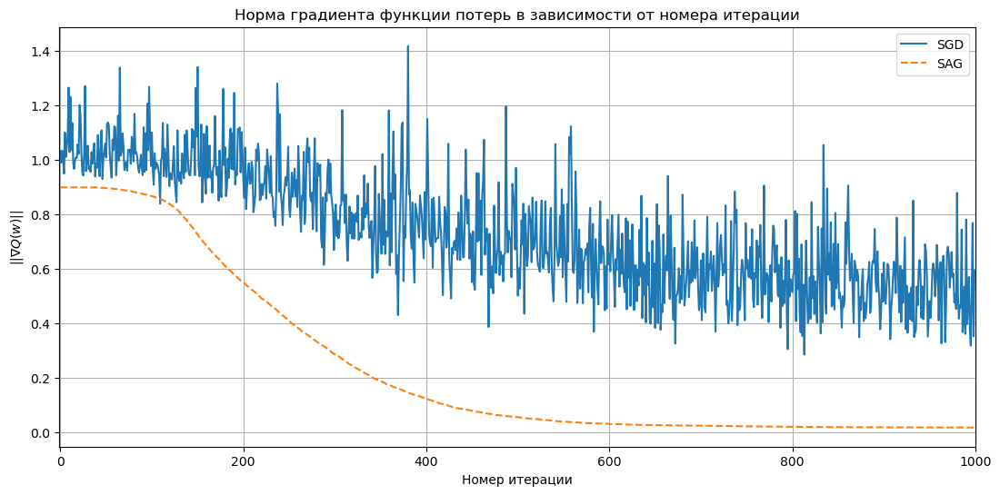

In [2395]:
plt.figure(figsize=(13, 6))
plt.plot(range(num_steps), grad_hub_sgd, label="SGD")
plt.plot(range(num_steps), grad_hub_sag, label="SAG", linestyle='--')

plt.title("Норма градиента функции потерь в зависимости от номера итерации")
plt.xlim((-1, num_steps))
plt.legend()
plt.xlabel("Номер итерации")
plt.ylabel(r"$||\nabla Q$($w$)||")
plt.grid()
plt.show()

#### Мб разделить дома на классы, дорогие и нет, чтобы лучше модель каждый класс предсказывала))

#### Без выбросов в target

In [2288]:
y_new_p = df_imputed_price['price']
X_new_p = df_imputed_price.drop('price', axis=1)

In [2289]:
X_new_p = X_new_p.values
y_new_p = y_new_p.values
X_train_new_p, X_test_new_p, y_train_new_p, y_test_new_p = train_test_split(X_new_p,y_new_p,test_size=0.3,random_state=60)

In [2290]:
normalizer = StandardScaler()
X_train_new_p_n = normalizer.fit_transform(X_train_new_p)
X_test_new_p_n = normalizer.transform(X_test_new_p)

In [2291]:
lr_mse_gd_p = LinearRegressionStats(MSELoss(), lr=0.1, method='GD', n_iterations=1000)
lr_mse_gd_p.fit(X_train_new_p_n, y_train_new_p)
print(lr_mse_gd_p.iteration)
lr_mse_gd_p.w

1000


array([-1.02954196e+04,  1.50039126e+04,  1.01144241e+05, -1.22441945e+04,
        3.69781196e+04, -1.82541251e-05, -4.26543340e-05,  1.25769445e+04,
        4.27152481e+03, -2.26468013e+04, -7.71942956e+03, -6.81013808e+04,
        5.06951415e-05,  4.95779412e+03,  4.40261508e+04, -1.12241588e+04,
        7.96611099e+03,  6.06208809e+01, -1.81895673e+03, -1.02954196e+04,
        3.30099320e-05,  2.40279665e+03, -2.96726266e+02, -7.12208838e-05,
        2.62596916e+04, -2.96726297e+02, -3.61652923e-05,  5.38984206e+03,
       -8.18215533e-05,  8.49903895e+04,  4.93624395e+05])

In [2292]:
print(f"Train: {mean_squared_error(y_train_new_p, lr_mse_gd_p.predict(X_train_new_p_n))**0.5}")
print(f"Test: {mean_squared_error(y_test_new_p, lr_mse_gd_p.predict(X_test_new_p_n))**0.5}")
print(r2_score(y_train_new_p, lr_mse_gd_p.predict(X_train_new_p_n)), r2_score(y_test_new_p, lr_mse_gd_p.predict(X_test_new_p_n)))

Train: 135263.64075536668
Test: 135351.90984969027
0.6182523052585861 0.6274335747746289
